# 1. Import Packages

In [ ]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker
from scipy.stats import skew
!pip install tensorflow_decision_forests
import tensorflow_decision_forests as tfdf
from sklearn.metrics import mean_squared_error

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 991.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 24.1 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found exi

### 1.1 Load Data

In [ ]:
test_data = pd.read_csv('/content/test.csv')

In [ ]:
train_data = pd.read_csv('/content/train.csv')

# 2. Exploratory Data Analysis

Note: The test data does not include SalePrice while the train data does. We will split the test data for training and testing for supervised learning. If time permits, we will use test data for unsupervised learning.



####2.1 Inital EDA

In [ ]:
# getting the shape of the data sets for both train and test:
print ("Train: ",train_data.shape[0],"sales, and ",train_data.shape[1],"features")
print ("Test: ",test_data.shape[0],"sales, and ",test_data.shape[1],"features")

Train:  1460 sales, and  81 features
Test:  1459 sales, and  80 features


In [ ]:
# focus on the train data from this point forward
# view the first 5 row of the data
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
# view the last 5 row of the data
train_data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [ ]:
# looking at the data types and non-null values
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
# reformat formatting of datasets
numeric_datatypes = ['int64',  'float64']
numeric_columns = []
for column in train_data.columns:
    if train_data[column].dtype in numeric_datatypes:
        numeric_columns.append(column)

In [ ]:
# droping ID column
train_data.drop('Id', axis = 1, inplace = True)

#### 2.2 Numerical Features

In [ ]:
# split the data between numerical and categorical values
numerical = [f for f in train_data.columns if train_data.dtypes[f] != 'object']
numerical.remove('SalePrice')

categorical = [f for f in train_data.columns if train_data.dtypes[f] == 'object']

In [ ]:
num_numerical = len(numerical)
print(f"Number of numerical variables: {num_numerical}")

Number of numerical variables: 36


In [ ]:
# numerical variables
numerical

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

#### 2.3 Categorical Features

In [ ]:
num_categorical = len(categorical)
print(f"Number of numerical variables: {num_categorical}")

Number of numerical variables: 43


In [ ]:
# categorical features
categorical

['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

### 2.4 Handling Feature Null Values

In [ ]:
# count of all missing values in each column
pd.set_option('display.max_rows', 100)
missing_values = train_data.isnull().sum()
non_zero_missing_values = missing_values[missing_values != 0]
sorted_non_zero_missing_values = non_zero_missing_values.sort_values(ascending = False)
print(sorted_non_zero_missing_values)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtFinType2      38
BsmtExposure      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
Electrical         1
dtype: int64


<Axes: >

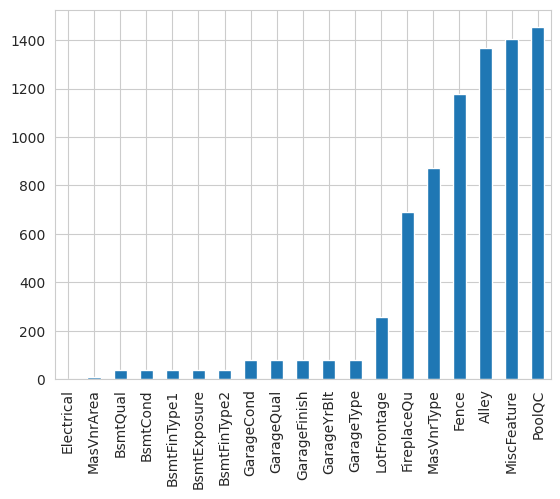

In [ ]:
sns.set_style('whitegrid')
non_zero_missing_values.sort_values(inplace=True)
non_zero_missing_values.plot.bar()

In [ ]:
# drop variables with high null values that wont have a big impact on sale price
train_data.drop(columns = ['MiscFeature', 'Fence', 'PoolQC', 'FireplaceQu', 'Alley', 'LotFrontage'], axis = 1, inplace = True)

In [ ]:
# inputting missing values for numerical feature, assuming the dataset is using null as a 0
for col in ('GarageYrBlt', 'GarageArea', 'GarageCars'):
    train_data[col] = train_data[col].fillna(0)

for col in ('BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath'):
    train_data[col] = train_data[col].fillna(0)

train_data["MasVnrArea"] = train_data["MasVnrArea"].fillna(0)

In [ ]:
# inputting missing values for categorical feature
for col in ('GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'):
    train_data[col] = train_data[col].fillna('None')

for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_data[col] = train_data[col].fillna('None')

In [ ]:
# look at unique values for electrical
value_counts = train_data['Electrical'].value_counts()
print(value_counts)

Electrical
SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64


In [ ]:
# electrical has one NA value bc this feature has mostly 'SBrkr', it will be set for the missing value
train_data['Electrical'] = train_data['Electrical'].fillna(train_data['Electrical'].mode()[0])


In [ ]:
#looking at MasVnrType values
type_counts = train_data['MasVnrType'].value_counts()
print(type_counts)

null_count = train_data['MasVnrType'].isnull().sum()
print(null_count)

MasVnrType
BrkFace    445
Stone      128
BrkCmn      15
Name: count, dtype: int64
872


In [ ]:
# from the data description MasVnrType has values of BrkCmn, BrkFace, CBlock, None, Stone
# we are going to assume that empty values are none and fill in the missing value with none
train_data['MasVnrType'] = train_data['MasVnrType'].fillna('None')

In [ ]:
# check to make sure that there are no more null values
train_data.isnull().sum()

MSSubClass       0
MSZoning         0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional  

### 2.5 Outcome Feature (Sale Price)

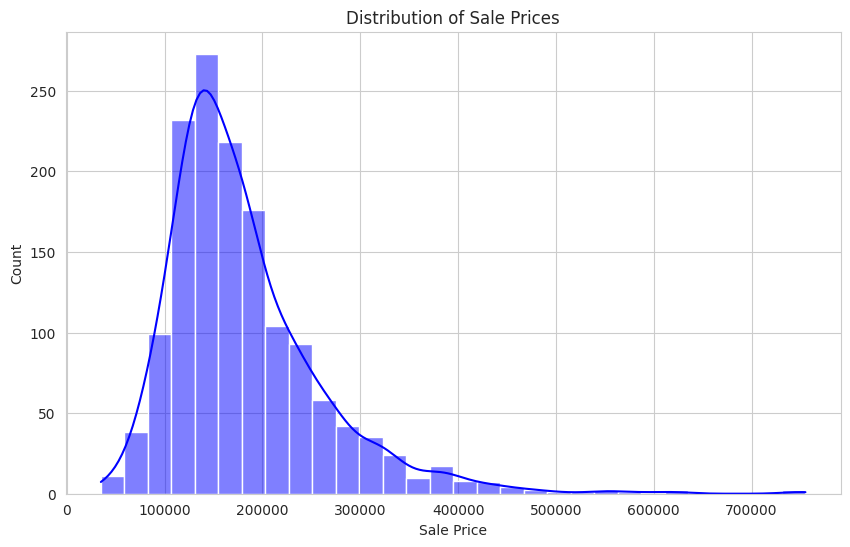

In [ ]:
# plotting sale price distribution
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(train_data['SalePrice'], kde=True, bins=30, color='blue')
plt.title('Distribution of Sale Prices')
plt.xlabel('Sale Price')
plt.ylabel('Count')
plt.show()

In [ ]:
print("Skew:",train_data['SalePrice'].skew())

Skew: 1.8828757597682129


In [ ]:
# statistical summary of sale price for training data
train_data['SalePrice'].describe()

# sale price is skewed - we will definitely need to transform this below in the feature engineering section

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

### 2.6 Correlation Matrix of Numerical Feature

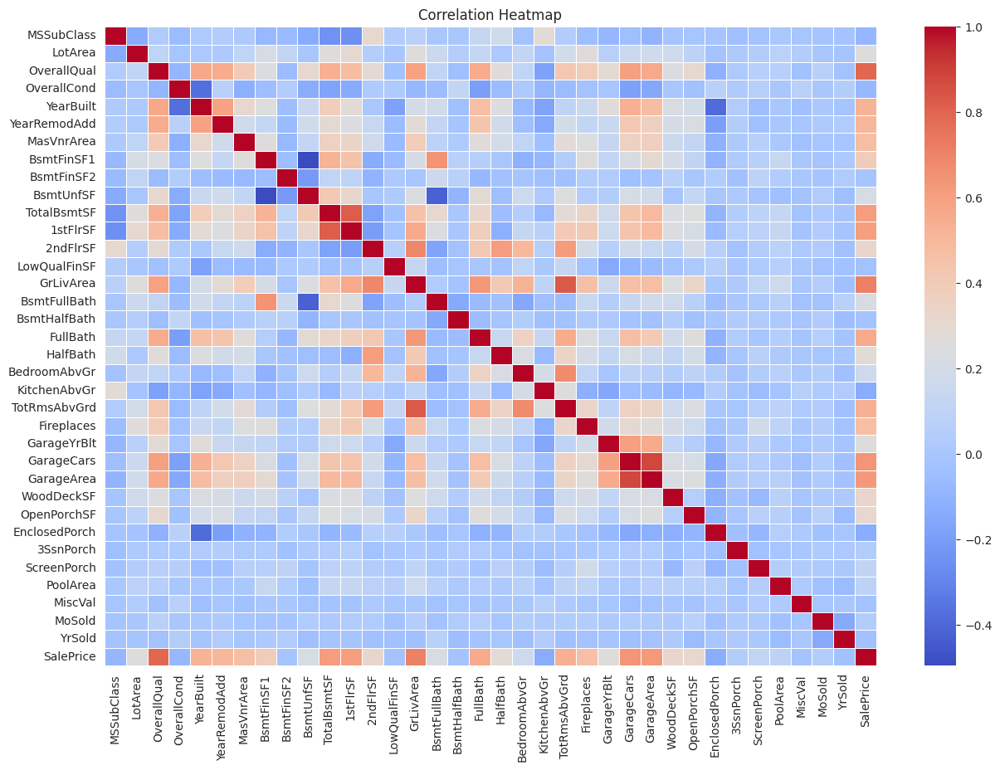

In [ ]:
# correlation matrix before major feature engineering
corr_matrix = train_data.select_dtypes(include=['int64', 'float64']).corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# 3. Feature Engineering

### 3.1 Outcome Variable - Sale Price

In [ ]:
# adjust for home price appreciation -ASSUMPTION-
train_data_year_sorted = train_data.sort_values(by='YrSold', ascending=True)
train_data_year_sorted

train_data['AdjustedSalePrice'] = round(train_data['SalePrice'] * (1.025 ** (2010 - train_data['YrSold'])),0)
train_data.sort_values(by='YrSold', ascending=True)

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AdjustedSalePrice
781,60,RL,7153,Pave,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,...,0,0,0,0,7,2006,WD,Normal,175900,194161.0
1219,160,RM,1680,Pave,Reg,Lvl,AllPub,Inside,Gtl,BrDale,...,0,0,0,0,4,2006,WD,Abnorml,91500,100999.0
281,20,FV,7200,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,...,0,0,0,0,5,2006,New,Partial,185000,204205.0
569,90,RL,7032,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,...,0,0,0,0,12,2006,WD,Normal,135960,150074.0
1220,20,RL,7800,Pave,IR1,Lvl,AllPub,Inside,Gtl,NAmes,...,0,0,0,0,11,2006,WD,Abnorml,115000,126938.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,30,RM,8520,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,...,0,0,0,0,5,2010,WD,Normal,105900,105900.0
1322,60,RL,10186,Pave,IR1,Lvl,AllPub,Inside,Gtl,NoRidge,...,0,0,0,0,6,2010,WD,Normal,190000,190000.0
162,20,RL,12182,Pave,Reg,Lvl,AllPub,Corner,Gtl,NridgHt,...,0,0,0,0,5,2010,New,Partial,220000,220000.0
158,60,FV,12552,Pave,Reg,Lvl,AllPub,Corner,Gtl,Somerst,...,0,0,0,0,5,2010,WD,Normal,254900,254900.0


In [ ]:
train_data['AdjustedSalePrice'].describe()

count      1460.000000
mean     191128.862329
std       84396.716718
min       35772.000000
25%      137212.750000
50%      171725.500000
75%      223778.000000
max      813052.000000
Name: AdjustedSalePrice, dtype: float64

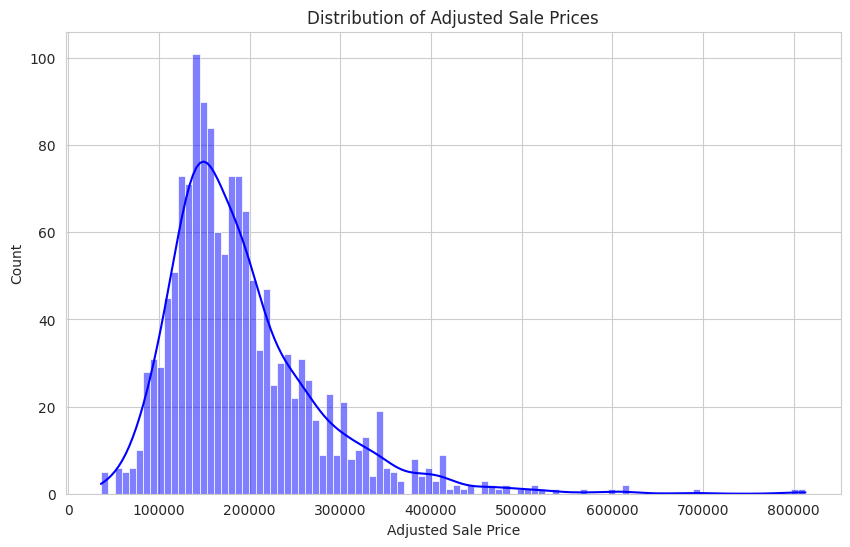

Skew: 1.895976395205773
Kurtosis 6.735267225904261


In [ ]:
# plotting adjusted sale price distribution
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(train_data['AdjustedSalePrice'], kde=True, bins=100, color='blue')
plt.title('Distribution of Adjusted Sale Prices')
plt.xlabel('Adjusted Sale Price')
plt.ylabel('Count')
plt.show()

# Sale price has a right skew and would not perform well on most models, would need to be transformed to be normally distributed

print("Skew:",train_data['AdjustedSalePrice'].skew())
print("Kurtosis", train_data['AdjustedSalePrice'].kurt())

In [ ]:
# Feature engineering of the outcome variable

train_data["LogAdjustedSalePrice"] = np.log1p(train_data["AdjustedSalePrice"])
train_data['LogAdjustedSalePrice'].describe()

count    1460.000000
mean       12.077992
std         0.402009
min        10.484949
25%        11.829295
50%        12.053658
75%        12.318414
max        13.608552
Name: LogAdjustedSalePrice, dtype: float64

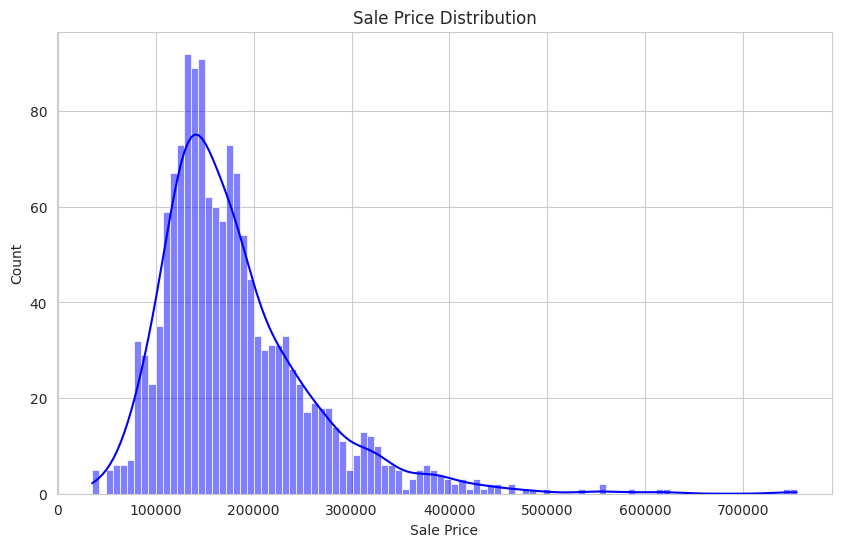

SalePrice Skew: 1.8828757597682129


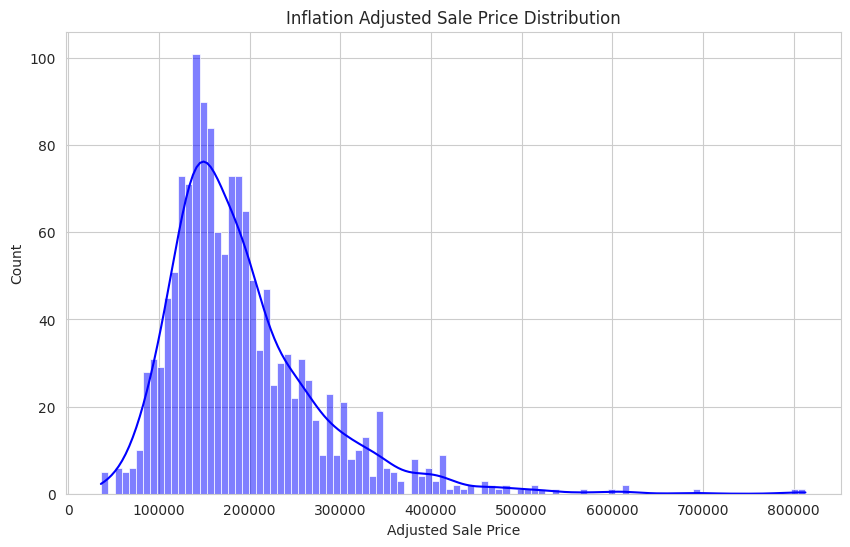

AdjustedSalePrice Skew: 1.8828757597682129


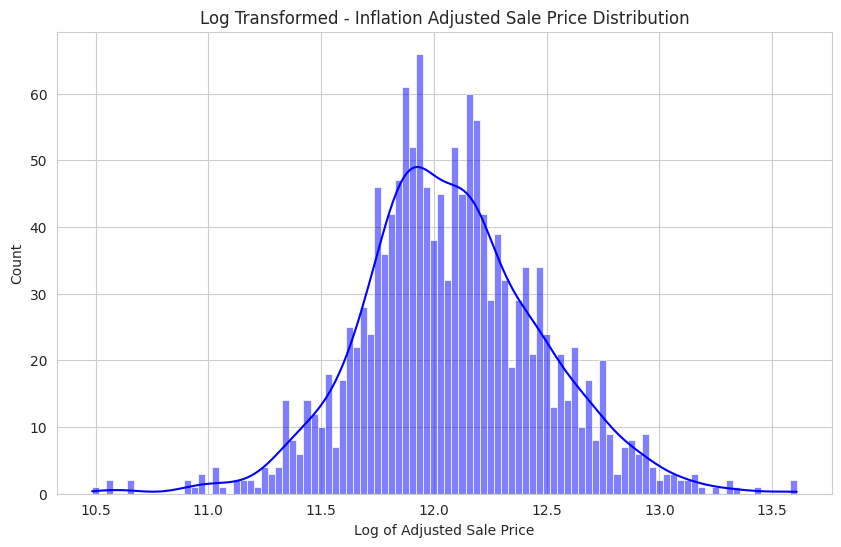

LogAdjustedSalePrice Skew: 0.10992595736140584
LogAdjustedSalePrice Kurtosis 0.8122854493703642


In [ ]:
# Outcome variable as shown is skewed and would affect machine learning algorithms that assume a normal distribution (linear regression and logistic regression)
# Algorithms like decision trees and random forest are pretty robust to skewness though

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(train_data['SalePrice'], kde=True, bins=100, color='blue')
plt.title('Sale Price Distribution')
plt.xlabel('Sale Price')
plt.ylabel('Count')
plt.show()

print("SalePrice Skew:",train_data['SalePrice'].skew())

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(train_data['AdjustedSalePrice'], kde=True, bins=100, color='blue')
plt.title('Inflation Adjusted Sale Price Distribution')
plt.xlabel('Adjusted Sale Price')
plt.ylabel('Count')
plt.show()

print("AdjustedSalePrice Skew:",train_data['SalePrice'].skew())

#Although model hasn't been finalized, we decided to normalize our outcome variable by applying a log transformation
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(train_data['LogAdjustedSalePrice'], kde=True, bins=100, color='blue')
plt.title('Log Transformed - Inflation Adjusted Sale Price Distribution')
plt.xlabel('Log of Adjusted Sale Price')
plt.ylabel('Count')
plt.show()

print("LogAdjustedSalePrice Skew:",train_data['LogAdjustedSalePrice'].skew())
print("LogAdjustedSalePrice Kurtosis", train_data['LogAdjustedSalePrice'].kurt())

# from this point on, only using LogAdjustedSalePrice

### 3.2 Numerical Features

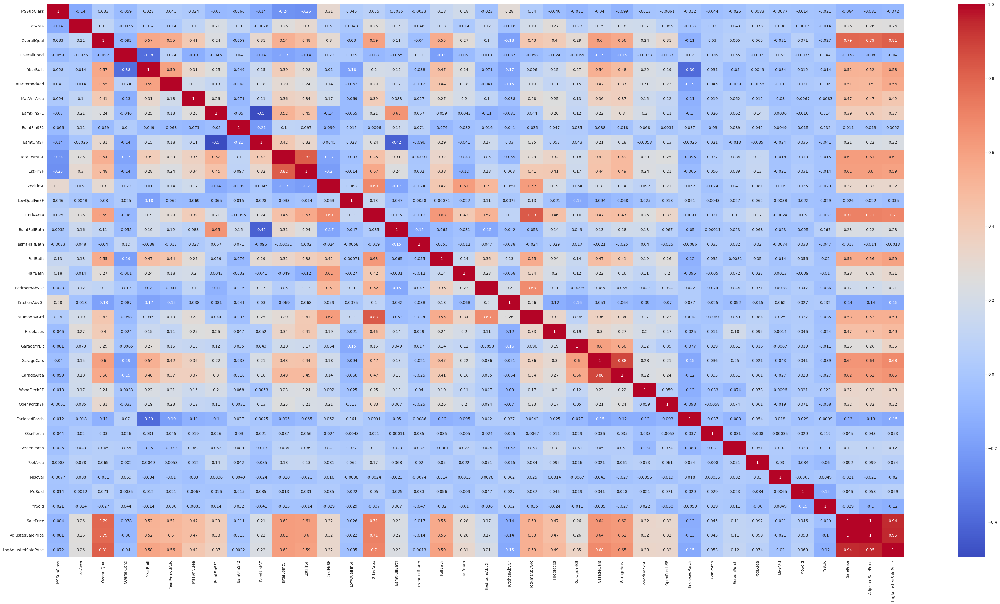

In [ ]:
# Want to narrow down the amount of features in the model from 81 so heatmap is used visualize the correlation between features and sale price
# Taking account of only the numerical columns without any feature engineering, the columns with the highest correaltions with SalePrice are
# OverallQual(0.81),YearBuilt(0.58),YearRemodAdd(0.56),TotalBsmtSF(0.61),1stFlrSF(0.59),GrLivArea(0.7),FullBath(0.59),TotRmsAbvGrd(0.53),FirePlaces(0.49),GarageYrBlt(0.54),GarageCars(0.68),GarageArea(0.65)
# How to handle outliers, possible to combine features to come up with other insight
def Heat_map(col):
    dataset = train_data[col].copy()
    corr = dataset.corr()
    plt.figure(figsize=(50, 26))
    sns.heatmap(corr, annot=True, cmap = 'coolwarm')

numerical_columns = []
for col in train_data.columns:
    if train_data[col].dtype != "O" and col != "Id":
        numerical_columns.append(col)

Heat_map(numerical_columns)

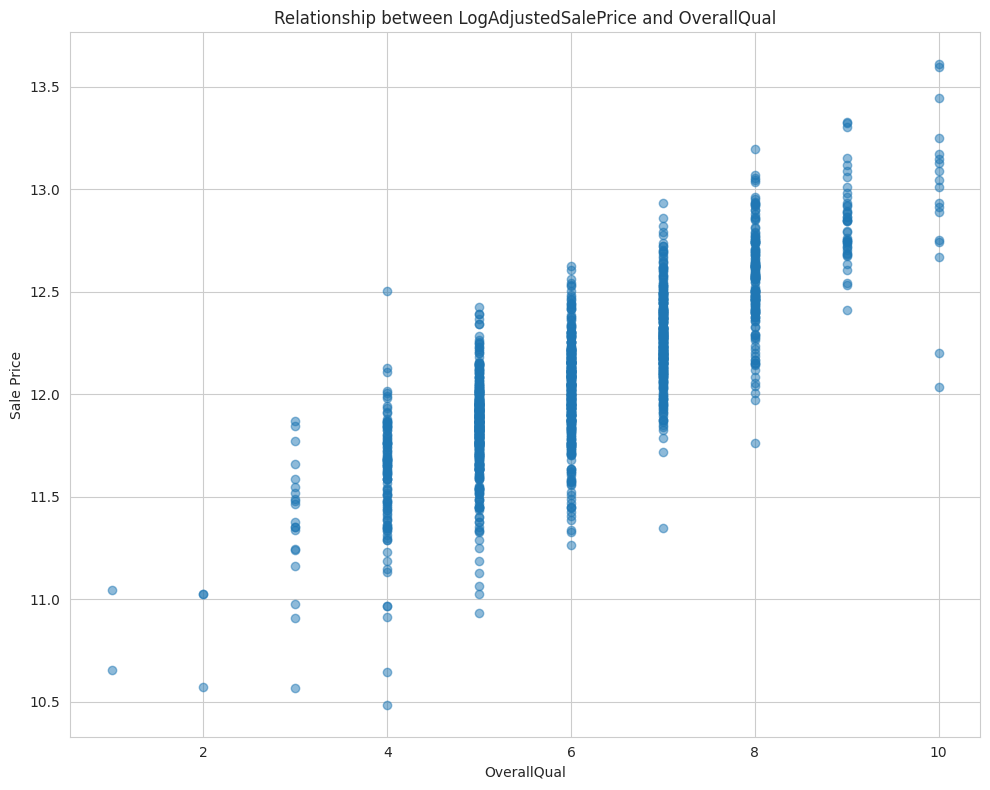

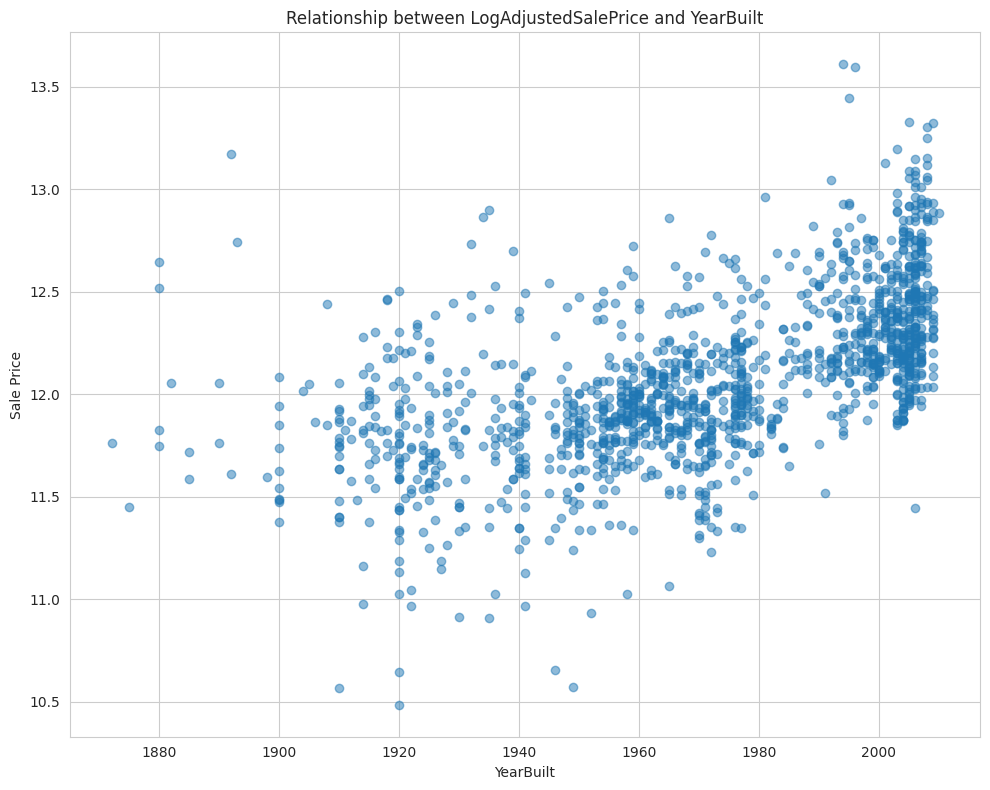

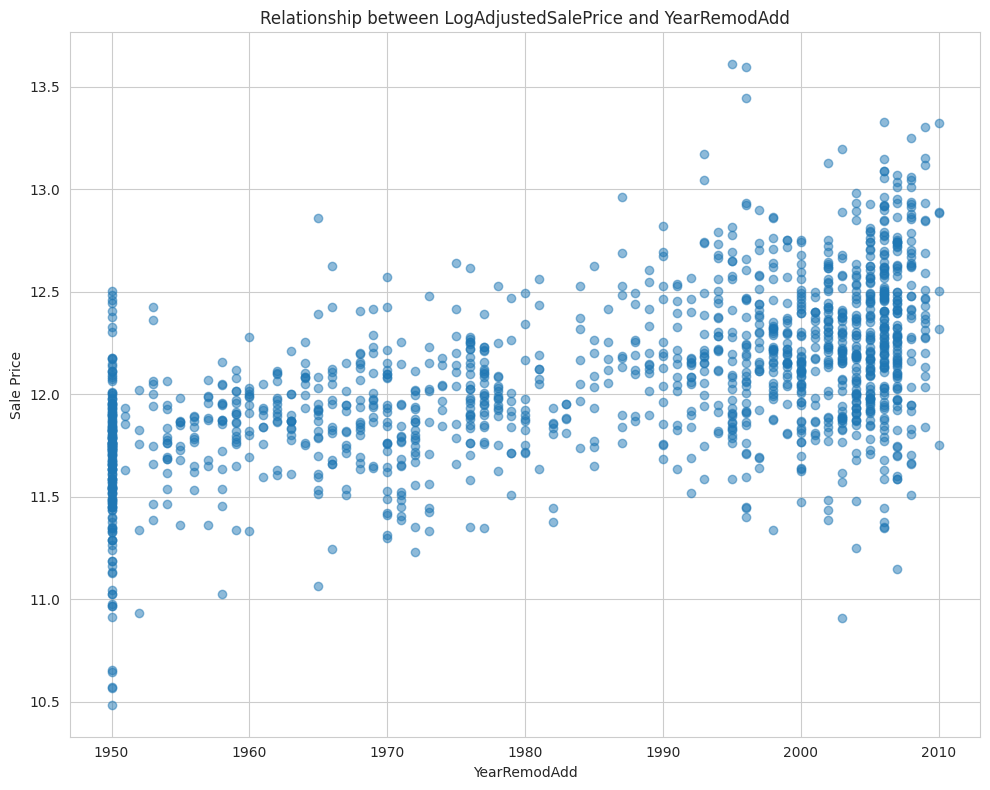

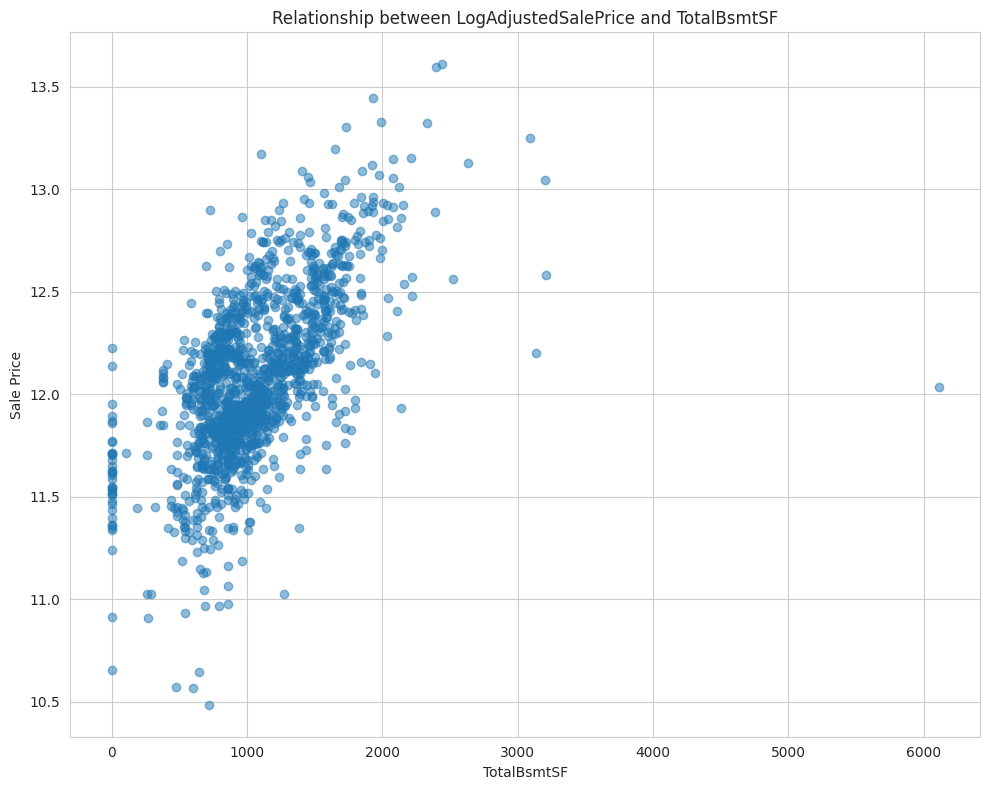

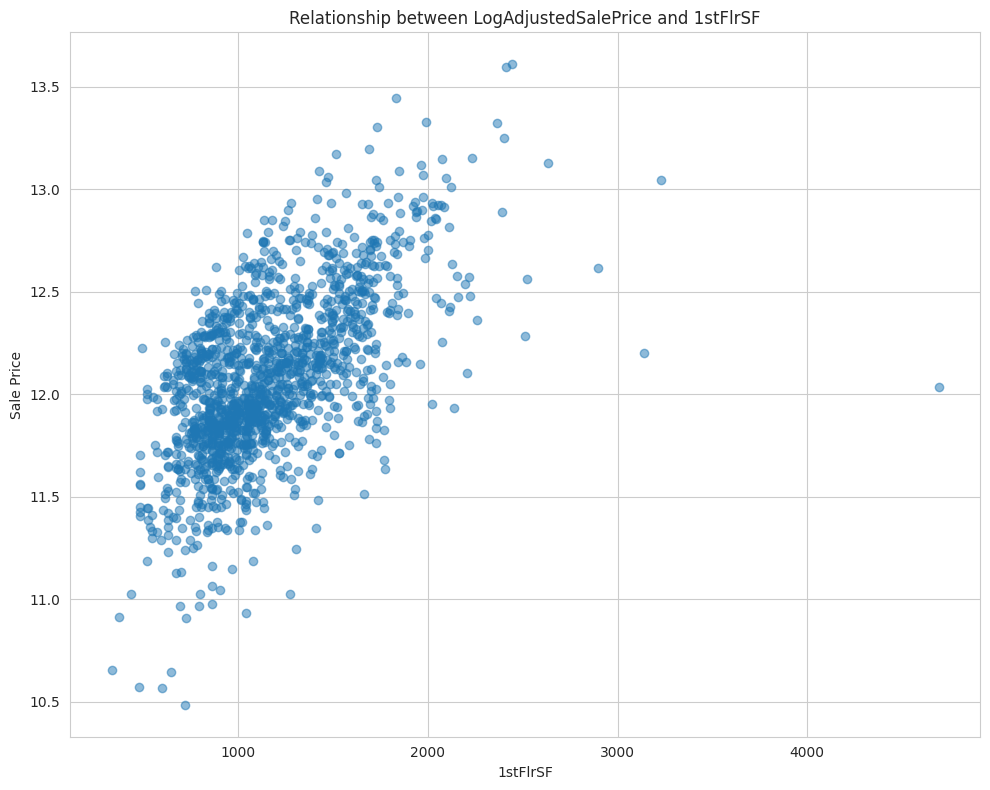

...

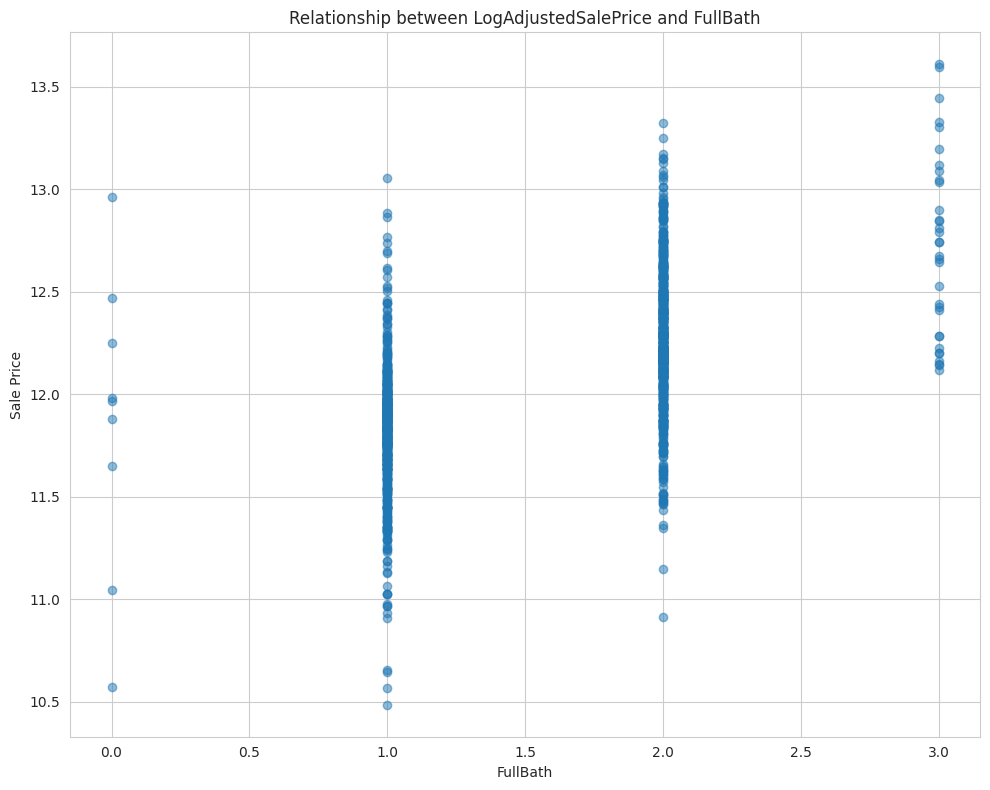

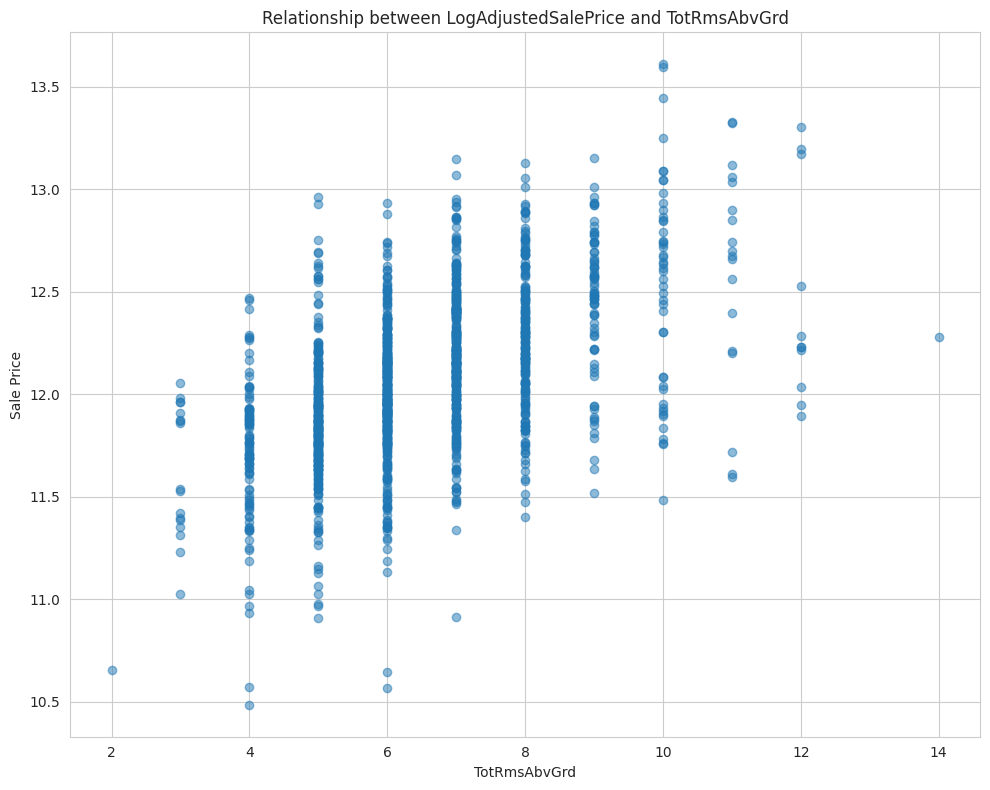

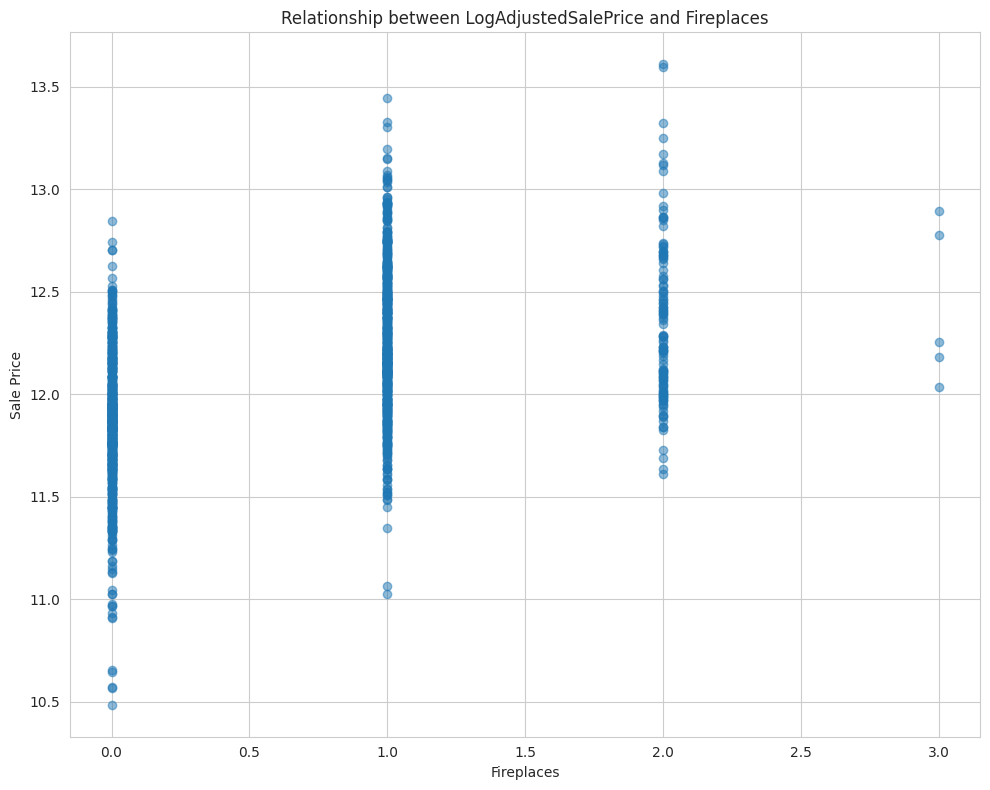

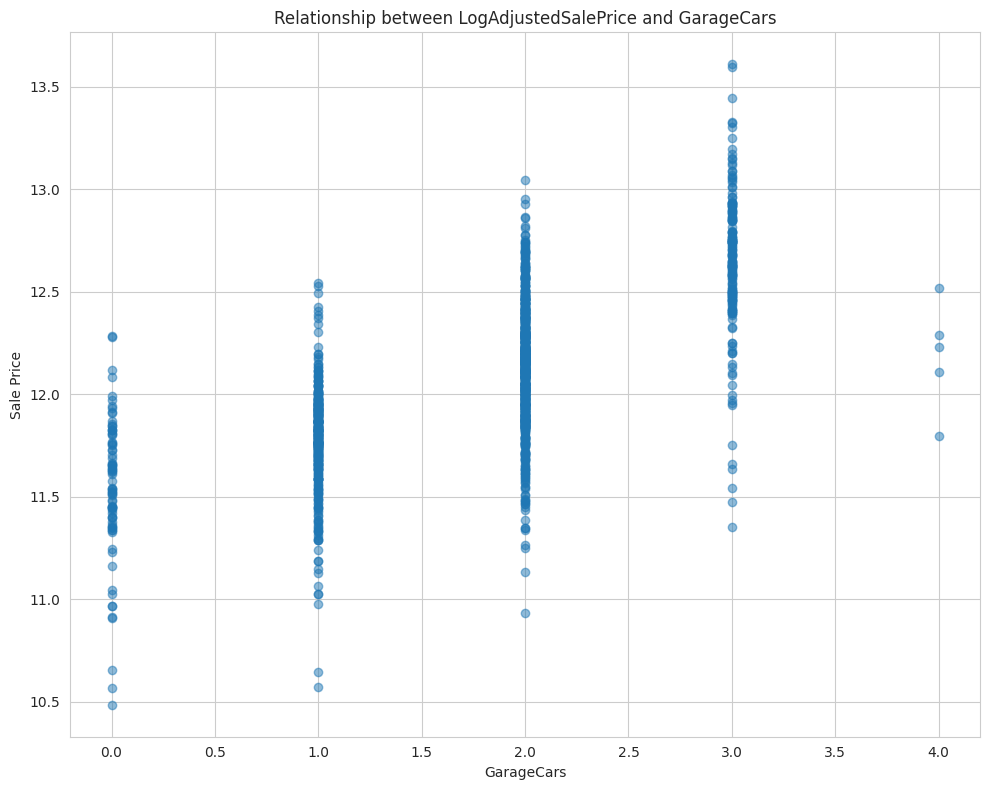

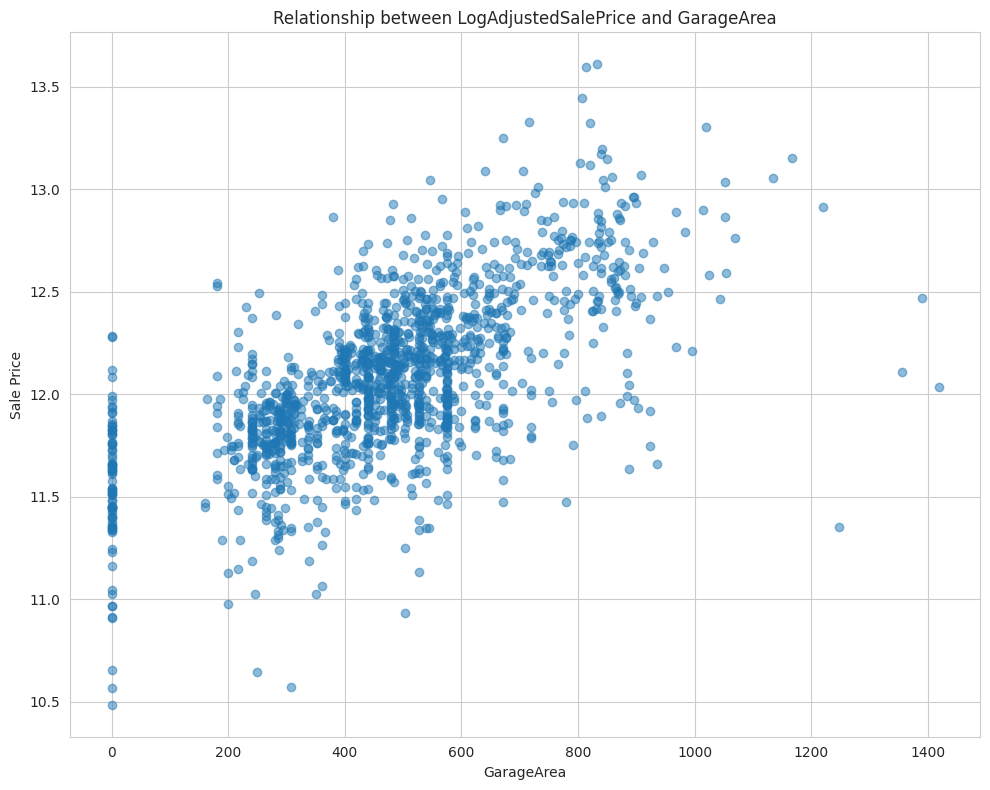

In [ ]:
# adding list for potential numerical features and checking their relationship with sale price
numerical_features = ['OverallQual', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', '1stFlrSF',
                   'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea']

for feature in numerical_features:
 fig, ax = plt.subplots(figsize=(10, 8))
 plt.scatter(train_data[feature], train_data['LogAdjustedSalePrice'], alpha=0.5)
 plt.title(f"Relationship between LogAdjustedSalePrice and {feature}")
 plt.xlabel(feature)
 plt.ylabel('Sale Price')
 plt.tight_layout()
 plt.show()

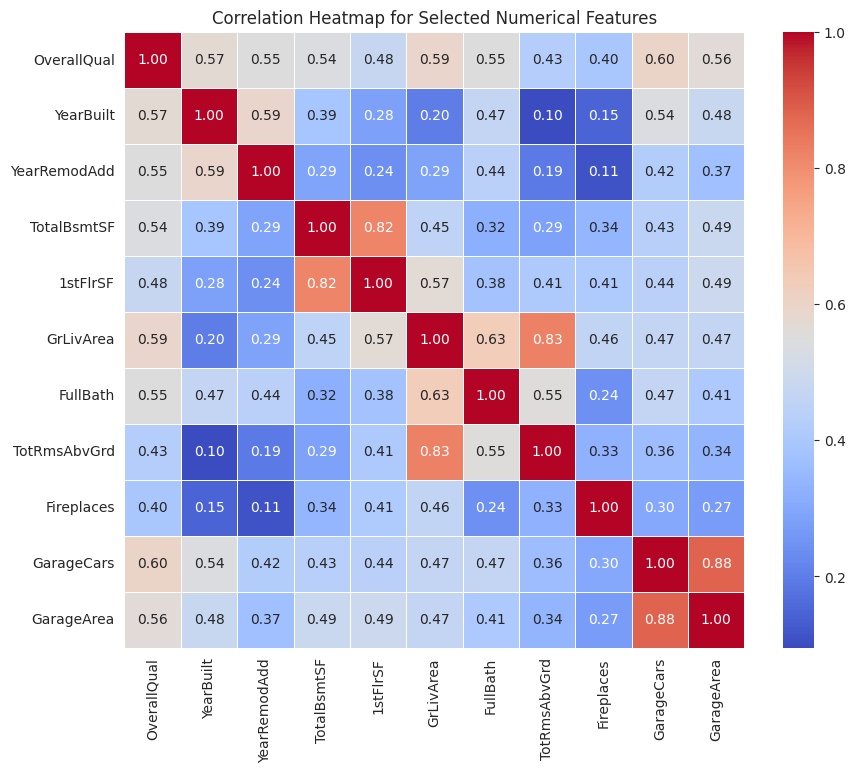

In [ ]:
# Correlation of the selected numerical features

# Subset the DataFrame with selected features
selected_train_data = train_data[numerical_features]

# Calculate the correlation matrix
corr_matrix = selected_train_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap for Selected Numerical Features')
plt.show()

#### 3.2.1 Transforming and Creating Features

In [ ]:
# Several of the large correlation relate to the square footage of the house. Creating a feature to capture the total area of the house including above ground and below ground square feet

# 'TotalBsmtSF' and 'GrLivArea' are already sums of variables (e.g., '1stFlrSF' + '2ndFlrSF' = 'GrLivArea'), so use these
train_data['TotalSF'] = (train_data['TotalBsmtSF'] + train_data['GrLivArea'] + train_data['GarageArea'])

# to comprehensively represent all bathrooms, add them up, even though half bath isn't have a high correlation
train_data['TotalBath'] = (train_data['FullBath'] + 0.5*(train_data['HalfBath']) + train_data['BsmtFullBath'] + 0.5* train_data['BsmtHalfBath'])



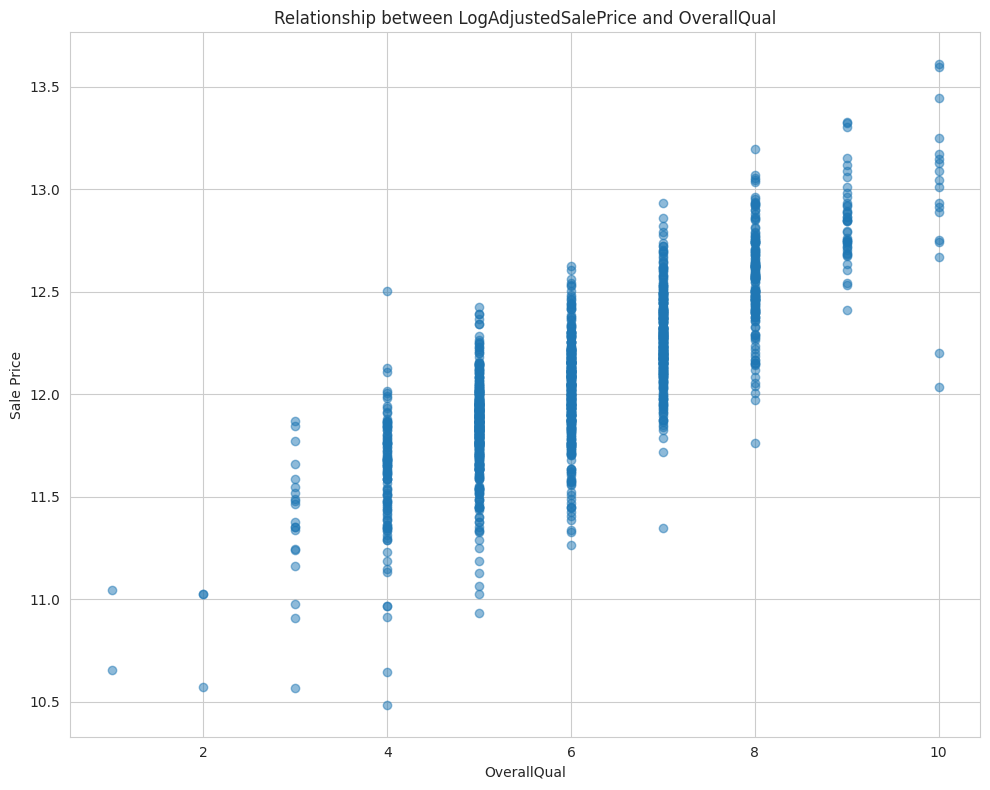

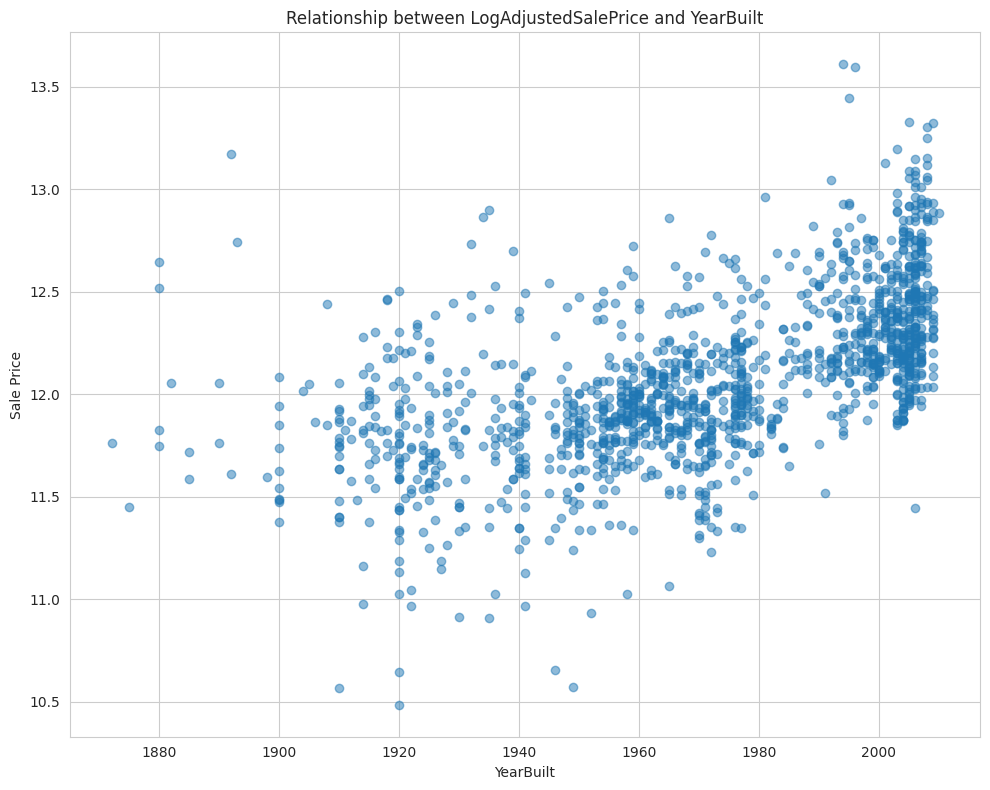

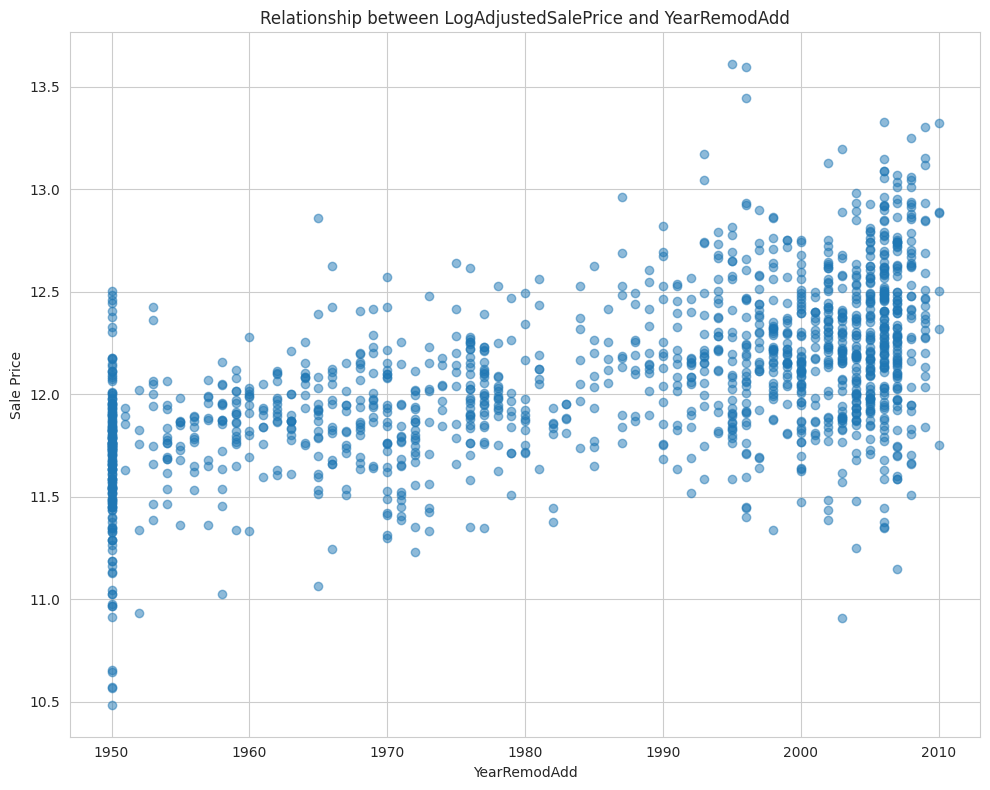

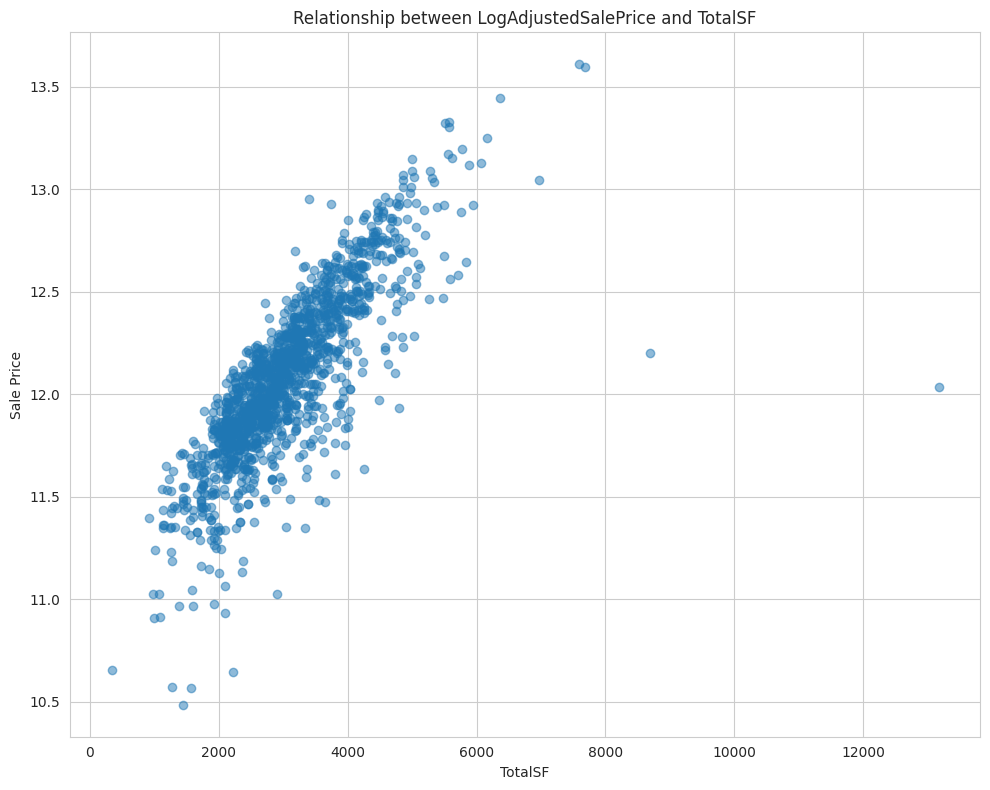

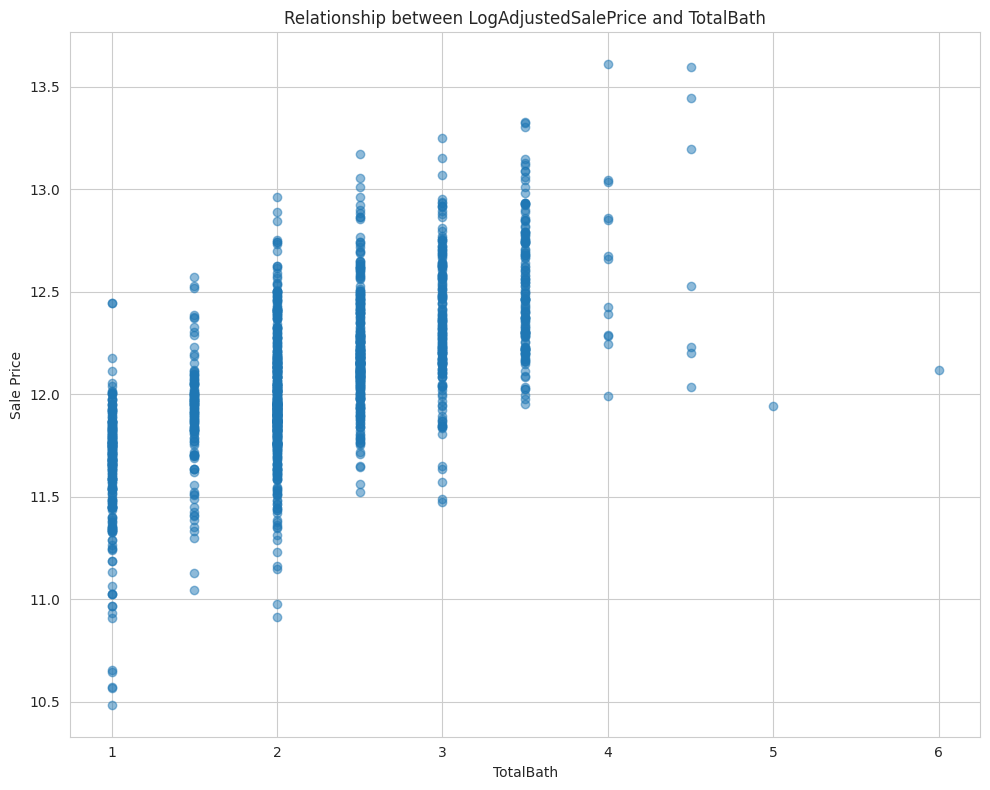

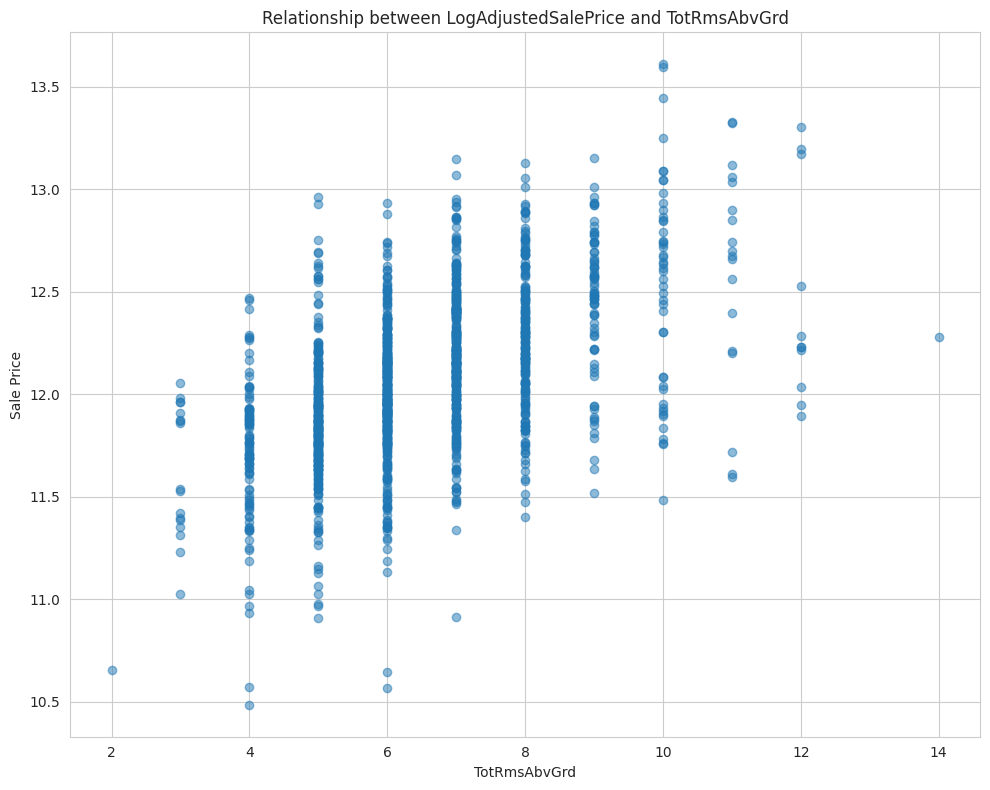

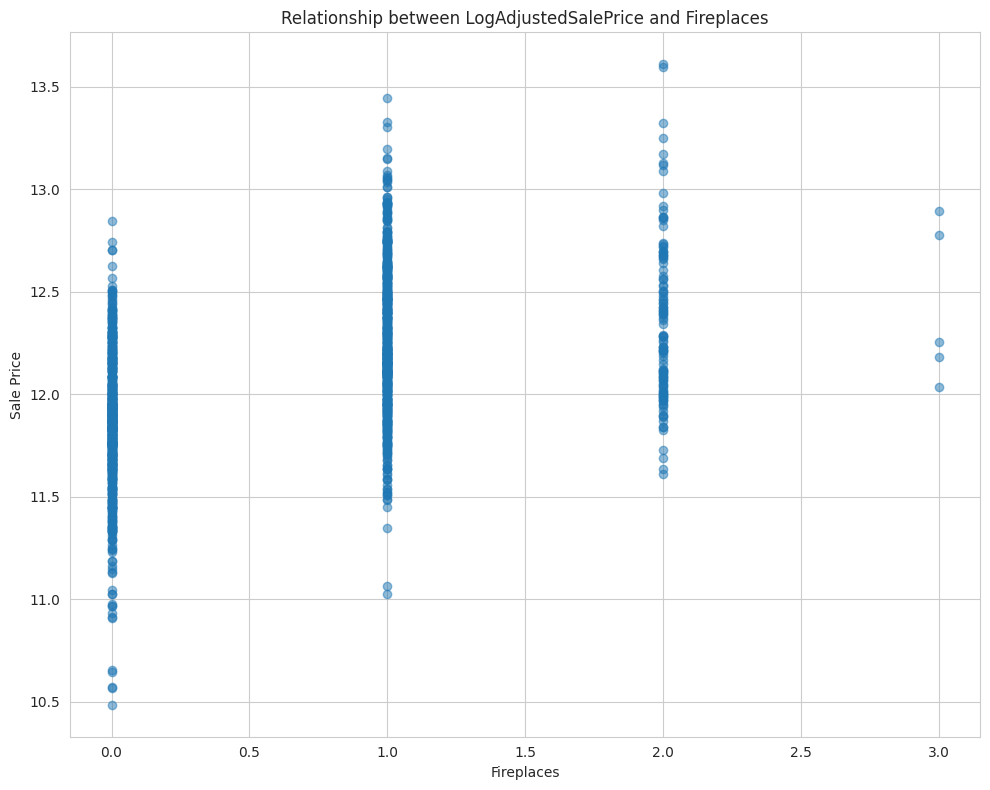

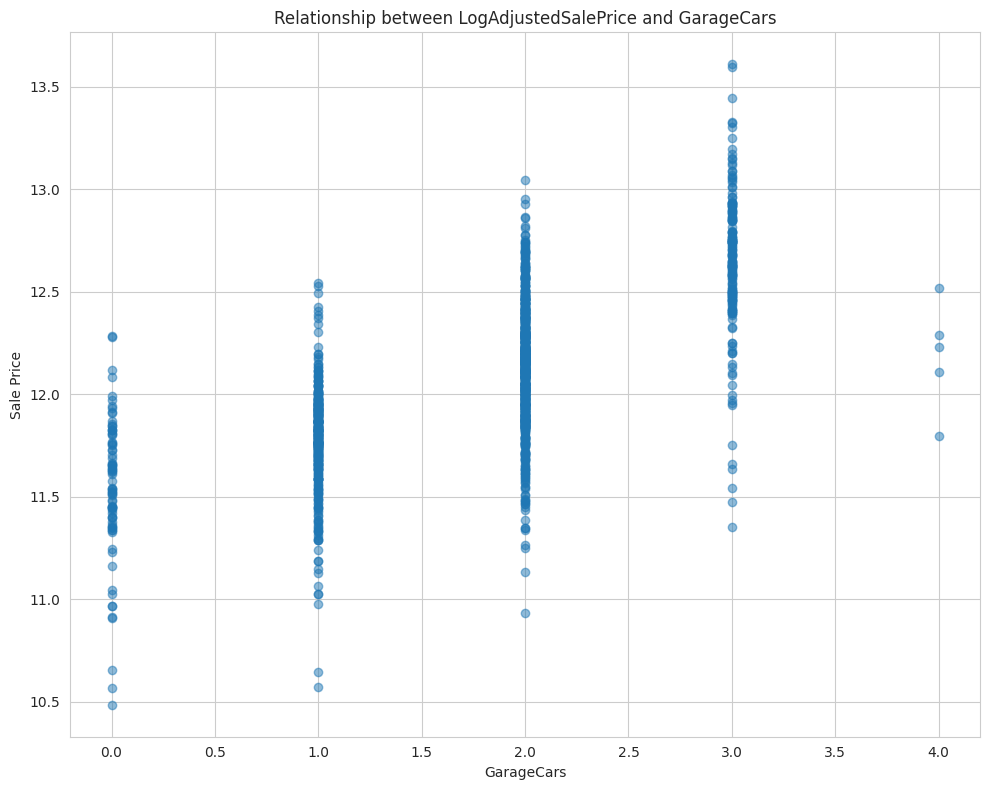

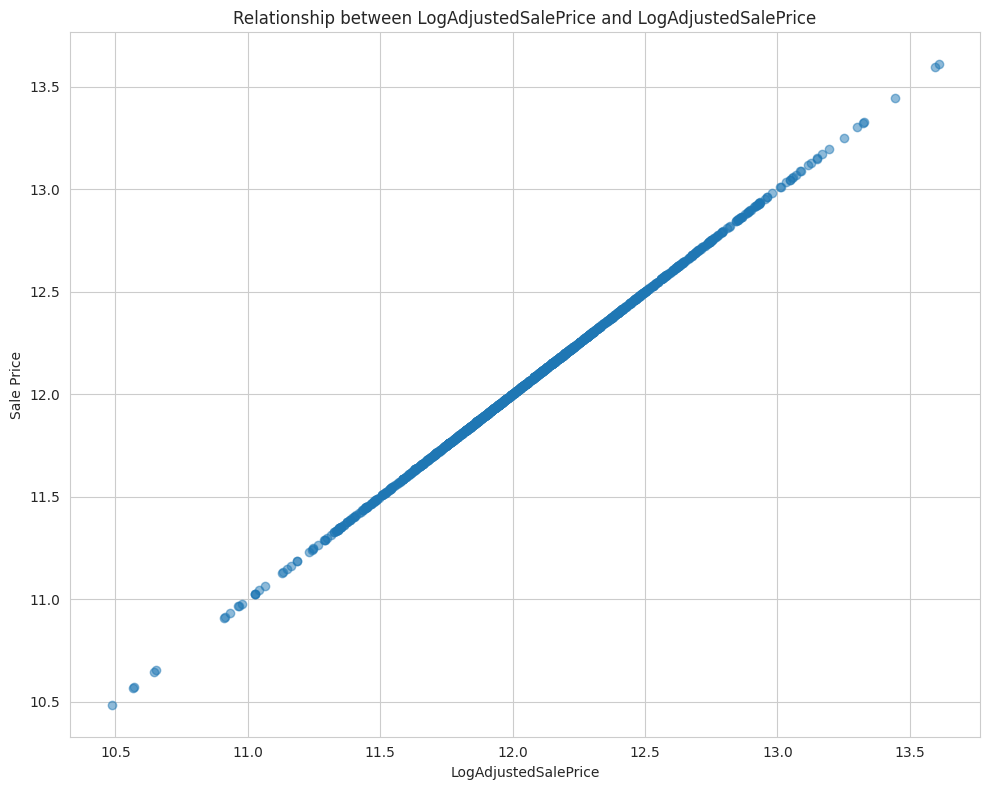

In [ ]:
# update the list for numerical features
numerical_features = ['OverallQual', 'YearBuilt', 'YearRemodAdd', 'TotalSF',
                      'TotalBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars','LogAdjustedSalePrice']

for feature in numerical_features:
 fig, ax = plt.subplots(figsize=(10, 8))
 plt.scatter(train_data[feature], train_data['LogAdjustedSalePrice'], alpha=0.5)
 plt.title(f"Relationship between LogAdjustedSalePrice and {feature}")
 plt.xlabel(feature)
 plt.ylabel('Sale Price')
 plt.tight_layout()
 plt.show()

List of features to investigate due to lack of relationship with LogAdjustedSale Price

1. Lot Area: Potential need to perform log transformation as all the values are clustered from 100,000, with a relatively few entries above 500,000 - Ak
2. OverallQual:  Does not require any transformations - Ak
3. OverallCond - Does not show strong relationship between OverallQual and LogAdjustedSalePrice (might not need)
4. YearBuilt: Does not show strong relationship between YearBuilt and LogAdjustedSalePrice - KP
5.YearRemodAdd: Does not show strong relationship between YearRemodAdd and LogAdjustedSalePrice - KP

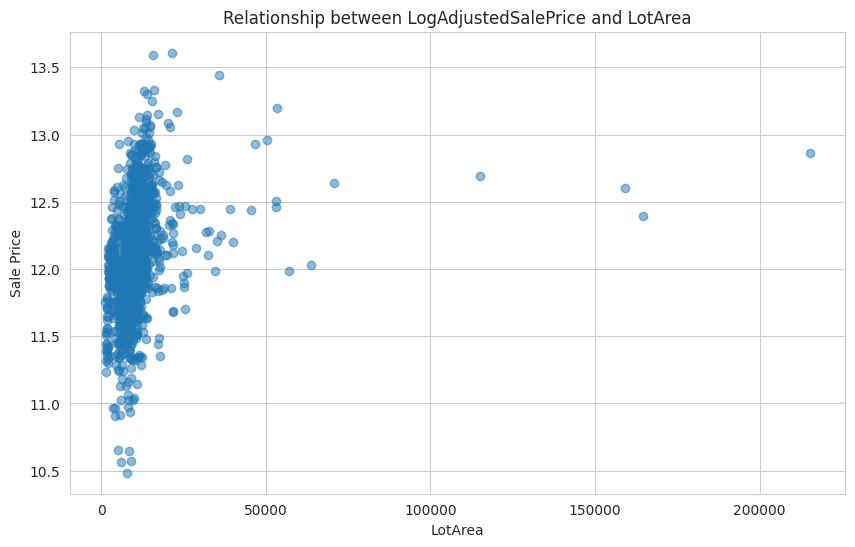

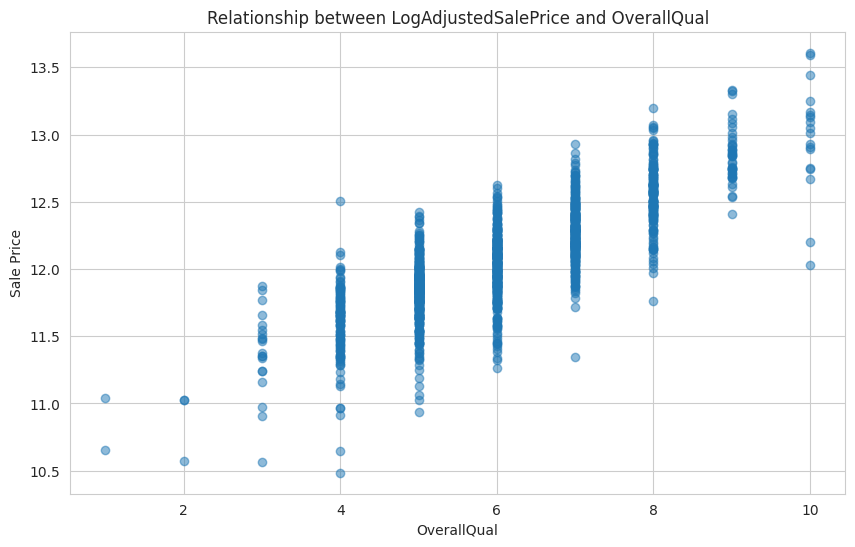

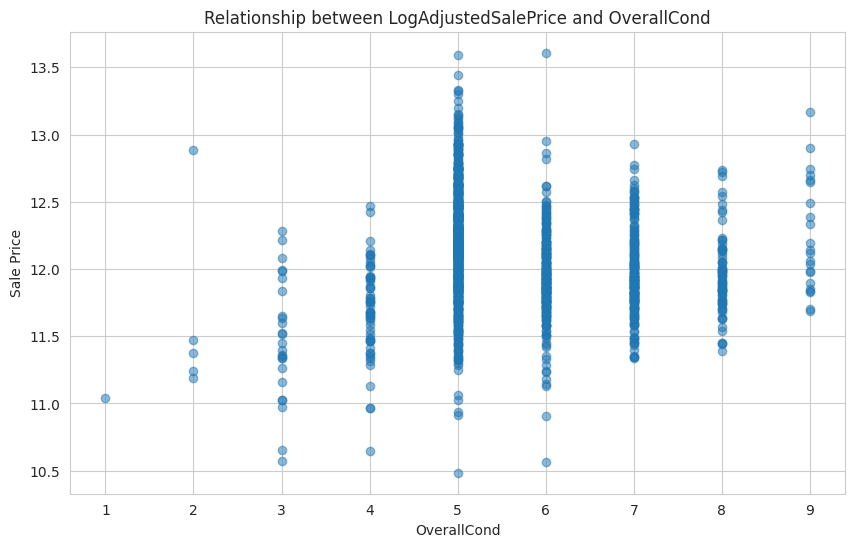

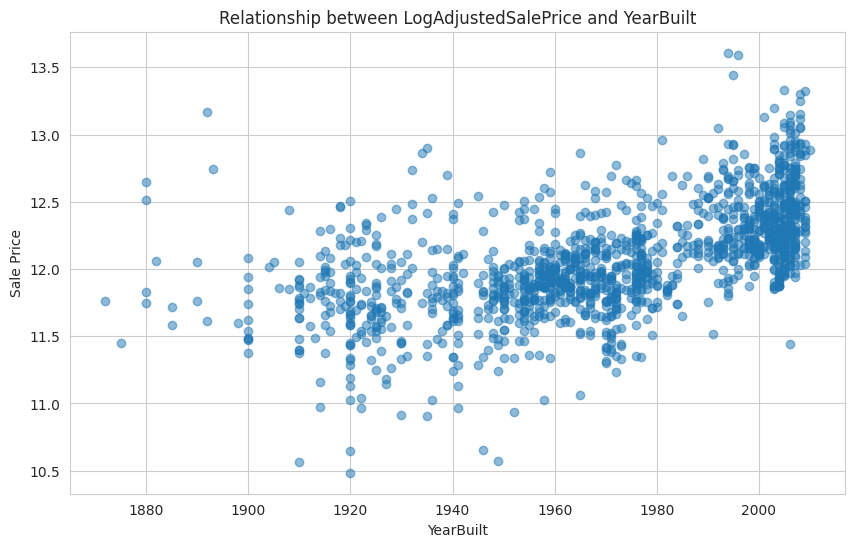

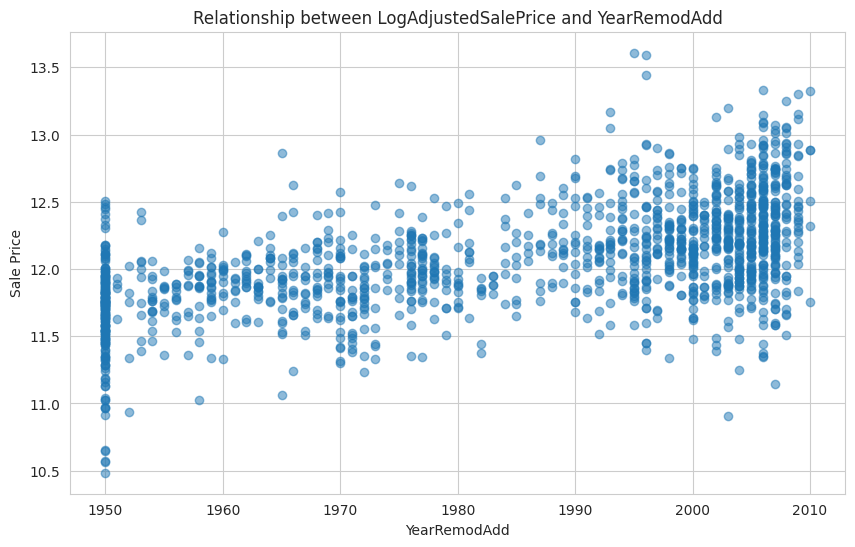

In [ ]:
# Visualize trends/outliers for features (not the transformed features coming multiple features together)

#adding list for potential numerical features
numerical_feature = ['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd'] # AK: why do we have this new list vs. the above? can we delete this cell now?

for feature in train_data[numerical_feature]:
  if train_data[feature].dtype != "O" and feature != "Id":
    fig, ax = plt.subplots(figsize=(10, 6))
    plt.scatter(train_data[feature], train_data['LogAdjustedSalePrice'], alpha=0.5)
    plt.title(f"Relationship between LogAdjustedSalePrice and {feature}")
    plt.xlabel(feature)
    plt.ylabel('Sale Price')
    plt.show()

<Axes: >

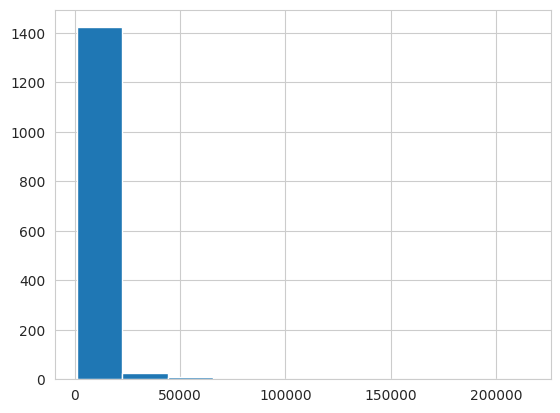

In [ ]:
# take a look at other num features that intuitively should have high correlation but don't: LotArea
train_data["LotArea"].hist()

<Axes: >

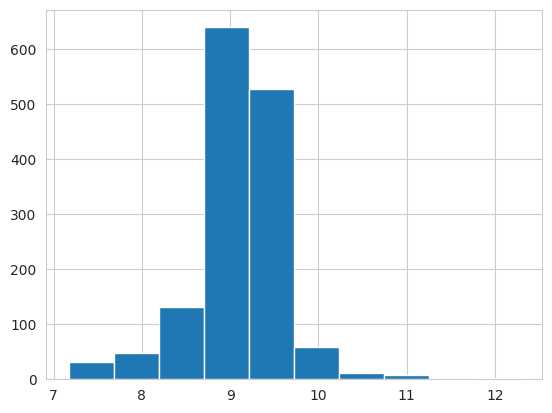

In [ ]:
# Feature engineering for LotArea: log transform

train_data["AdjustedLotArea"] = np.log1p(train_data["LotArea"])
train_data["AdjustedLotArea"].hist()

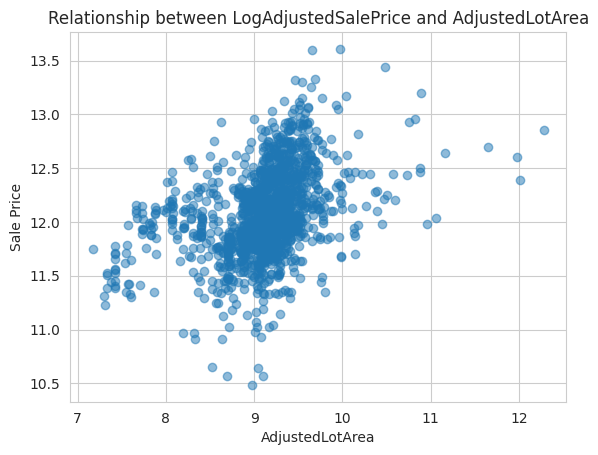

In [ ]:
# Feature engineering for LotArea: log transform
plt.scatter(train_data["AdjustedLotArea"], train_data['LogAdjustedSalePrice'], alpha=0.5)
plt.title(f"Relationship between LogAdjustedSalePrice and AdjustedLotArea")
plt.xlabel("AdjustedLotArea")
plt.ylabel('Sale Price')
plt.show()

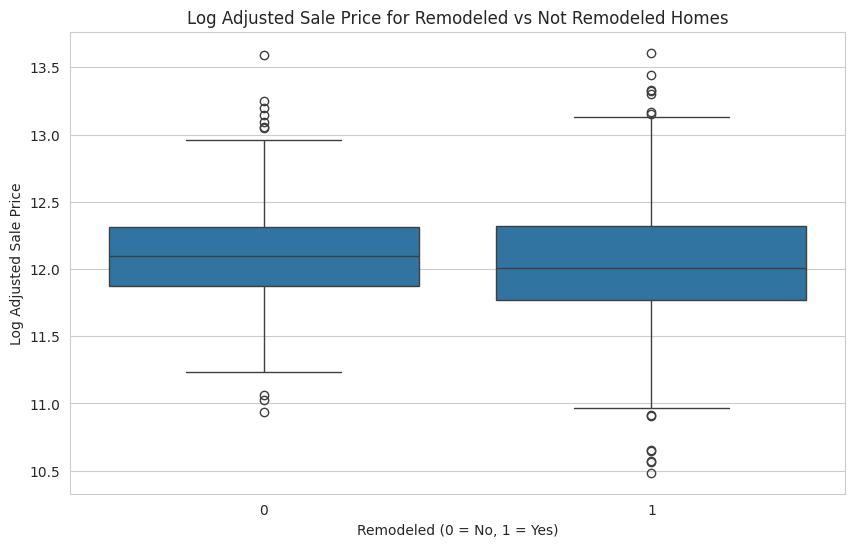

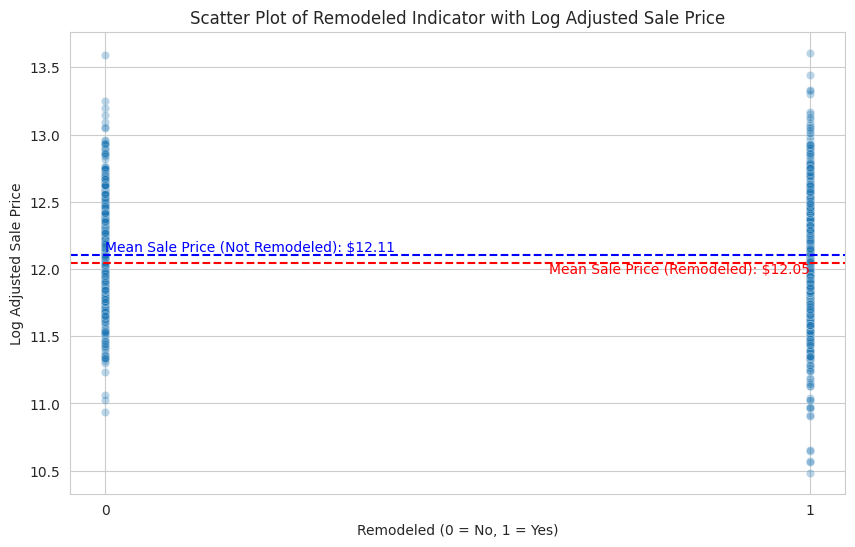

The correlation between homes being remodeled and Log Adjusted Sale Price is: -0.07499638947778495


In [ ]:
# creating an indicator varibale to determine if the house has been remodel or not
# if the year built is the same as the year remodel then that indicates the house has not been remodel
# however if the year remodel is differnt from the year built it means that the house have under gone some remodeling
train_data['IsRemodeled'] = (train_data['YearRemodAdd'] != train_data['YearBuilt']).astype(int)
mean_price_remodeled = train_data[train_data['IsRemodeled'] == 1]['LogAdjustedSalePrice'].mean()
mean_price_not_remodeled = train_data[train_data['IsRemodeled'] == 0]['LogAdjustedSalePrice'].mean()

plt.figure(figsize=(10, 6))
sns.boxplot(x='IsRemodeled', y='LogAdjustedSalePrice', data=train_data)
plt.title('Log Adjusted Sale Price for Remodeled vs Not Remodeled Homes')
plt.xlabel('Remodeled (0 = No, 1 = Yes)')
plt.ylabel('Log Adjusted Sale Price')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x='IsRemodeled', y='LogAdjustedSalePrice', data=train_data, alpha=0.3)
plt.title('Scatter Plot of Remodeled Indicator with Log Adjusted Sale Price')
plt.xlabel('Remodeled (0 = No, 1 = Yes)')
plt.ylabel('Log Adjusted Sale Price')

plt.axhline(y=mean_price_remodeled, color='red', linestyle='--')
plt.axhline(y=mean_price_not_remodeled, color='blue', linestyle='--')
plt.text(x=1, y=mean_price_remodeled, s=f"Mean Sale Price (Remodeled): ${mean_price_remodeled:.2f}", color='red', va='top', ha='right')
plt.text(x=0, y=mean_price_not_remodeled, s=f"Mean Sale Price (Not Remodeled): ${mean_price_not_remodeled:.2f}", color='blue', va='bottom', ha='left')
plt.xticks([0, 1])
plt.show()

remodel_correlation = train_data['IsRemodeled'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation between homes being remodeled and Log Adjusted Sale Price is: {remodel_correlation}")

# doesn't seem like remodeled vs. not remodeled is very different

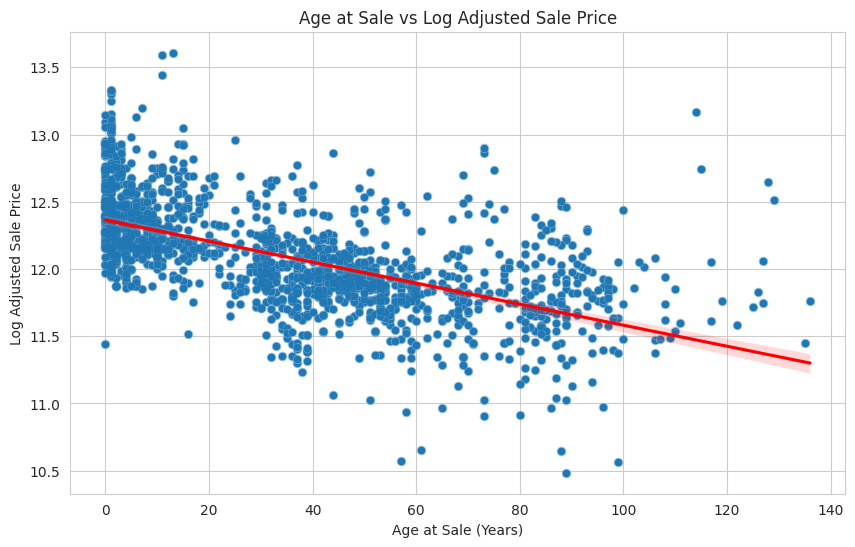

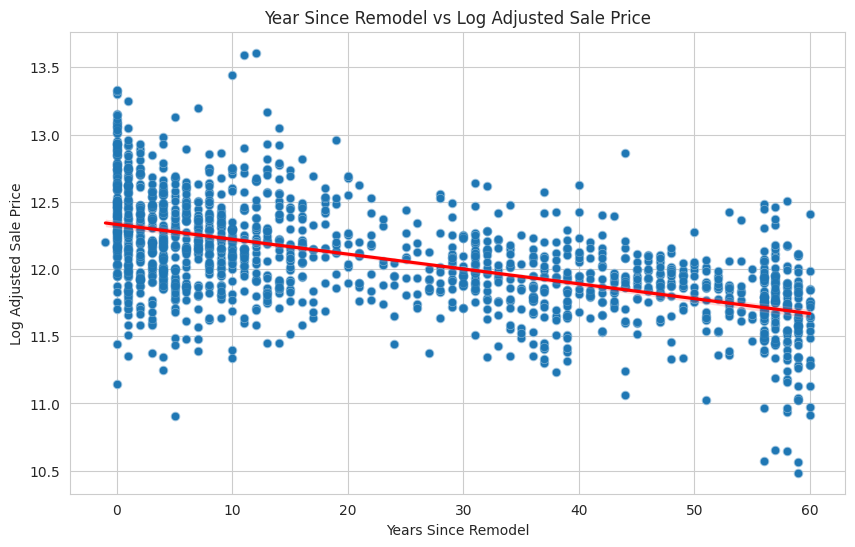

The correlation coefficient between Age at Sale and Log Adjusted Sale Price is: -0.588240725735612
The correlation coefficient between Year Since Remodel and Log Adjusted Sale Price is: -0.5668500808985186


In [ ]:
#getting the age of the property at the year its sold might provide helpful information
train_data['AgeAtSale'] = train_data['YrSold'] - train_data['YearBuilt']

#calculating how many years since the house have been remodel
train_data['YearSinceRemodel'] = train_data['YrSold'] - train_data['YearRemodAdd']

plt.figure(figsize=(10, 6))
sns.scatterplot(x=train_data['AgeAtSale'], y=train_data['LogAdjustedSalePrice'])
sns.regplot(x=train_data['AgeAtSale'], y=train_data['LogAdjustedSalePrice'], scatter_kws={'alpha':0.3},line_kws={"color": "red"})
plt.title('Age at Sale vs Log Adjusted Sale Price')
plt.xlabel('Age at Sale (Years)')
plt.ylabel('Log Adjusted Sale Price')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=train_data['YearSinceRemodel'], y=train_data['LogAdjustedSalePrice'])
sns.regplot(x=train_data['YearSinceRemodel'], y=train_data['LogAdjustedSalePrice'], scatter_kws={'alpha':0.3},line_kws={"color": "red"})
plt.title('Year Since Remodel vs Log Adjusted Sale Price')
plt.xlabel('Years Since Remodel')
plt.ylabel('Log Adjusted Sale Price')
plt.show()


#getting the correlation with log adjusted sale price
age_saleprice_correlation = train_data['AgeAtSale'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between Age at Sale and Log Adjusted Sale Price is: {age_saleprice_correlation}")

age_remodel_correlation = train_data['YearSinceRemodel'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between Year Since Remodel and Log Adjusted Sale Price is: {age_remodel_correlation}")


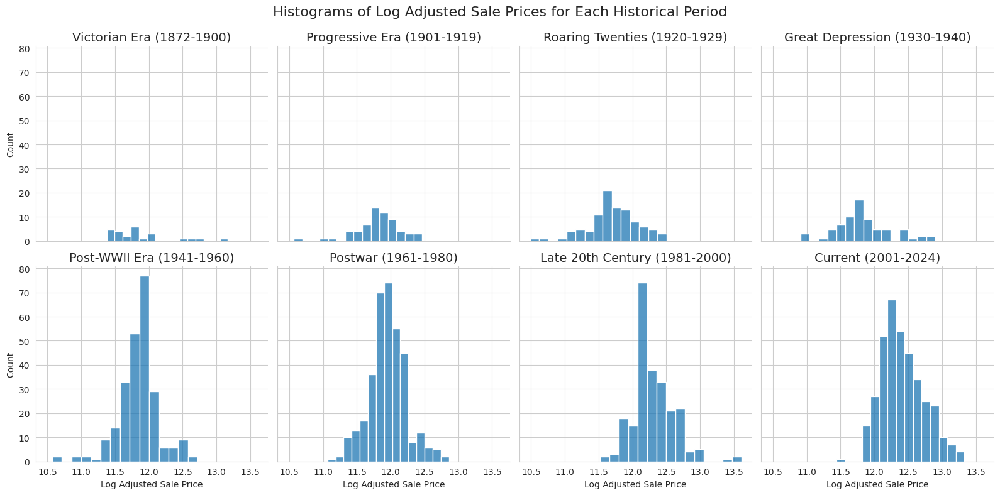

<ipython-input-45-e53f66d1cf51>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='HistoricalPeriod', y='LogAdjustedSalePrice', data=train_data, palette="coolwarm")


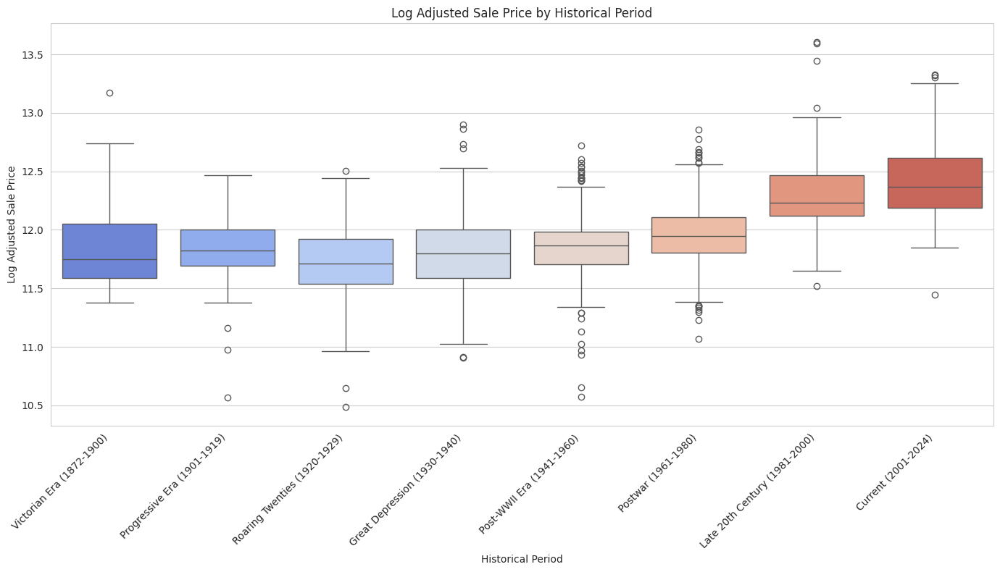

In [ ]:
# creating categorical binning based on time periods that can affact housing prices
bin_edges = [1872, 1901, 1920, 1930, 1941, 1961, 1981, 2001, 2011]

bin_labels = [
    'Victorian Era (1872-1900)',
    'Progressive Era (1901-1919)',
    'Roaring Twenties (1920-1929)',
    'Great Depression (1930-1940)',
    'Post-WWII Era (1941-1960)',
    'Postwar (1961-1980)',
    'Late 20th Century (1981-2000)',
    'Current (2001-2024)'
]

train_data['HistoricalPeriod'] = pd.cut(train_data['YearBuilt'], bins=bin_edges, labels=bin_labels, right=False, include_lowest=True)

g = sns.FacetGrid(train_data, col='HistoricalPeriod', col_wrap=4, height=4, aspect=1)
g.map(sns.histplot, 'LogAdjustedSalePrice', kde=False, bins=15)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Histograms of Log Adjusted Sale Prices for Each Historical Period', fontsize=16)
g.set_titles(col_template="{col_name}", size=14)
g.set_axis_labels('Log Adjusted Sale Price', 'Count')
plt.show()

plt.figure(figsize=(14, 8))
sns.boxplot(x='HistoricalPeriod', y='LogAdjustedSalePrice', data=train_data, palette="coolwarm")
plt.xticks(rotation=45, ha='right')
plt.title('Log Adjusted Sale Price by Historical Period')
plt.xlabel('Historical Period')
plt.ylabel('Log Adjusted Sale Price')
plt.tight_layout()
plt.show()

# took a look at housing prices through different time periods based on when it was built, but this doesnt really provide much
# information besides that housing prices increased over time which is already a given considering inflation.


In [ ]:
# assigning an ordinal number to each historical period based on their order
ordinal_mapping = {label: idx for idx, label in enumerate(bin_labels)}
train_data['HistoricalPeriodOrdinal'] = train_data['HistoricalPeriod'].map(ordinal_mapping)

correlation = train_data['HistoricalPeriodOrdinal'].corr(train_data['LogAdjustedSalePrice'])
print(f"Correlation between Historical Period and Log Adjusted Sale Price: {correlation}")

Correlation between Historical Period and Log Adjusted Sale Price: 0.5556122856808344


In [ ]:
# adding year built and year remodel together
train_data['YrBltAndRemod'] = train_data['YearBuilt'] + train_data['YearRemodAdd']
correlation = train_data['YrBltAndRemod'].corr(train_data['LogAdjustedSalePrice'])
print("Correlation coefficient of Year Built and Remodel:", correlation)


Correlation coefficient of Year Built and Remodel: 0.640141637097413


In [ ]:
# trying out other feature creation
train_data['Spaciousness'] = (train_data['1stFlrSF'] + train_data['2ndFlrSF']) / train_data['TotRmsAbvGrd']
spaciousness_correlation = train_data['Spaciousness'].corr(train_data['LogAdjustedSalePrice'])
print(f"Correlation between 'LogAdjustedSalePrice' and 'Spaciousness': {spaciousness_correlation}")


Correlation between 'LogAdjustedSalePrice' and 'Spaciousness': 0.5651051331693127


#### 3.2.2 Indicator Variables

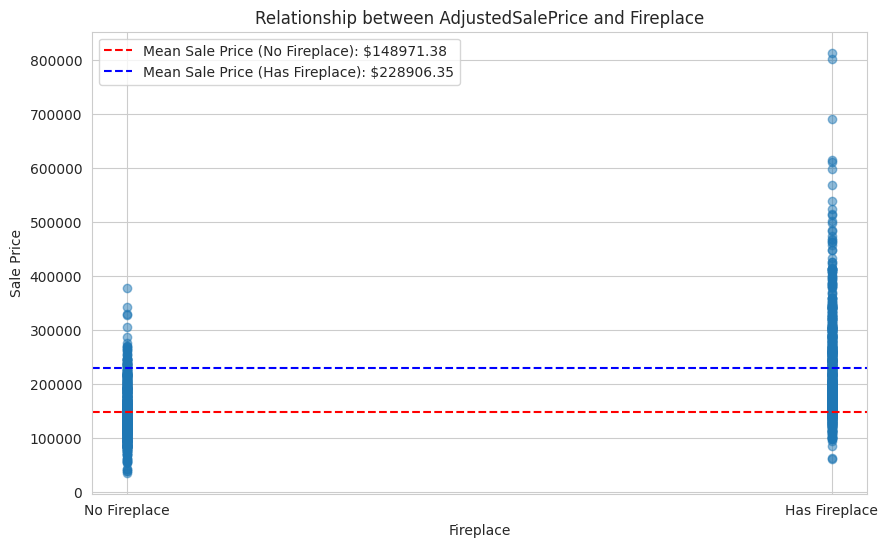

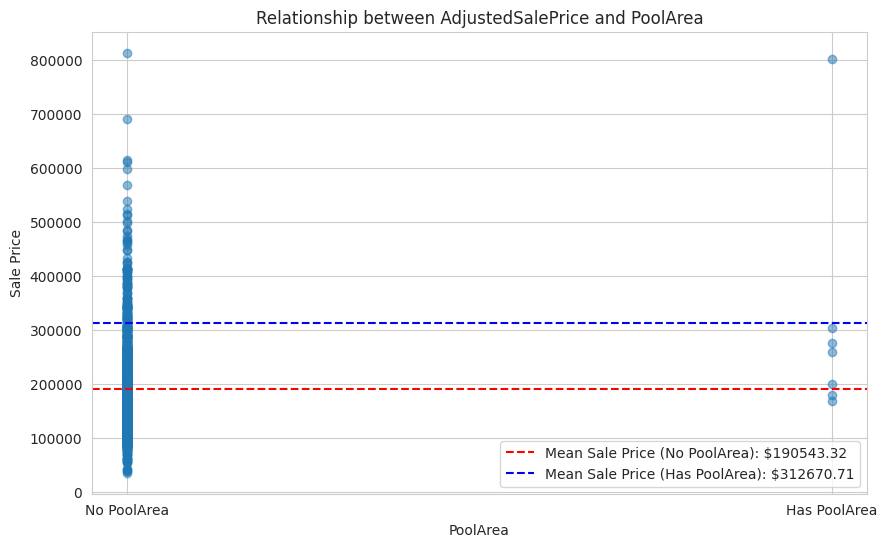

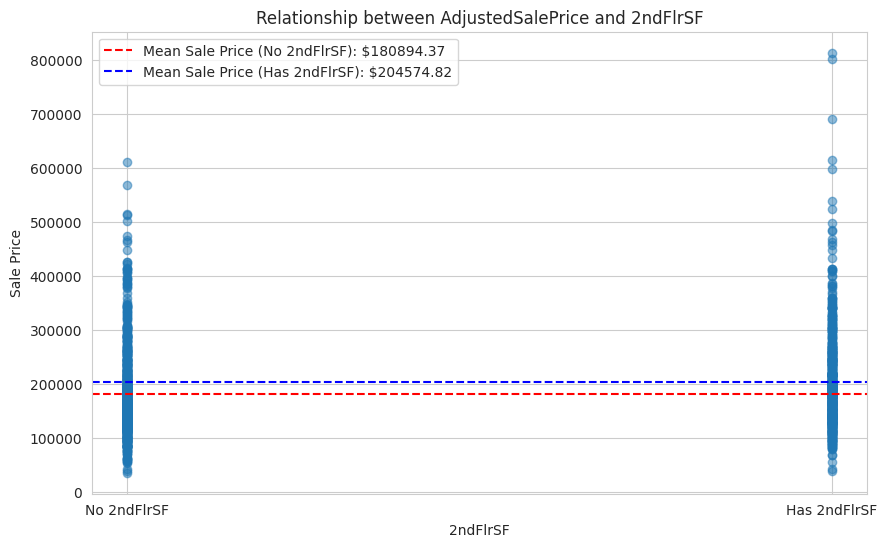

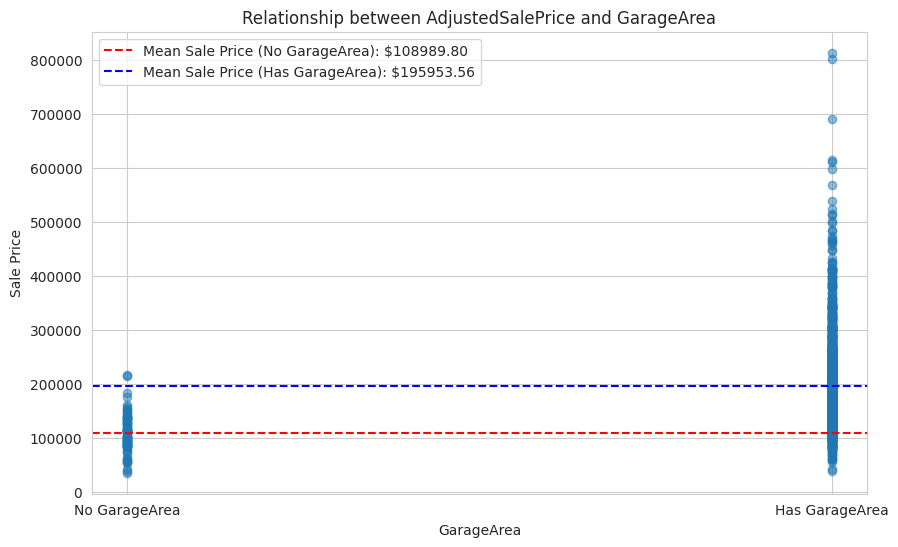

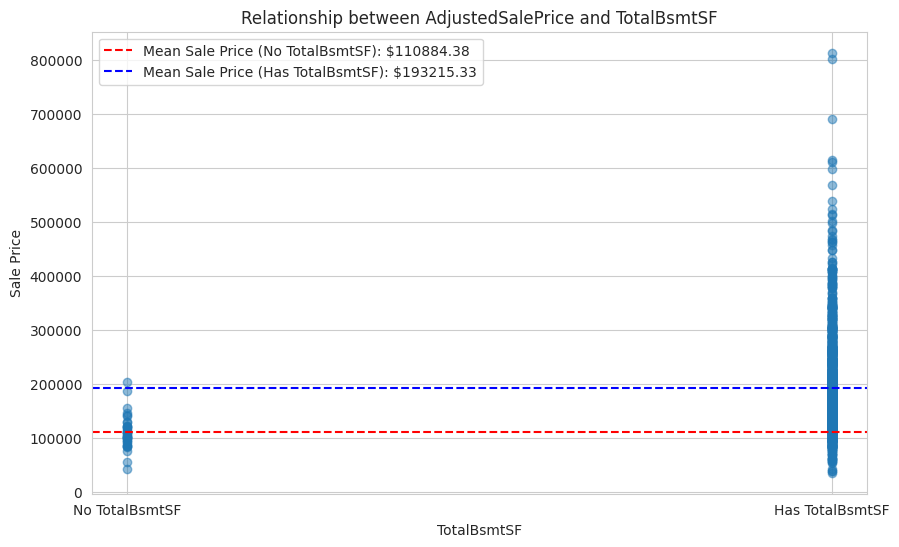

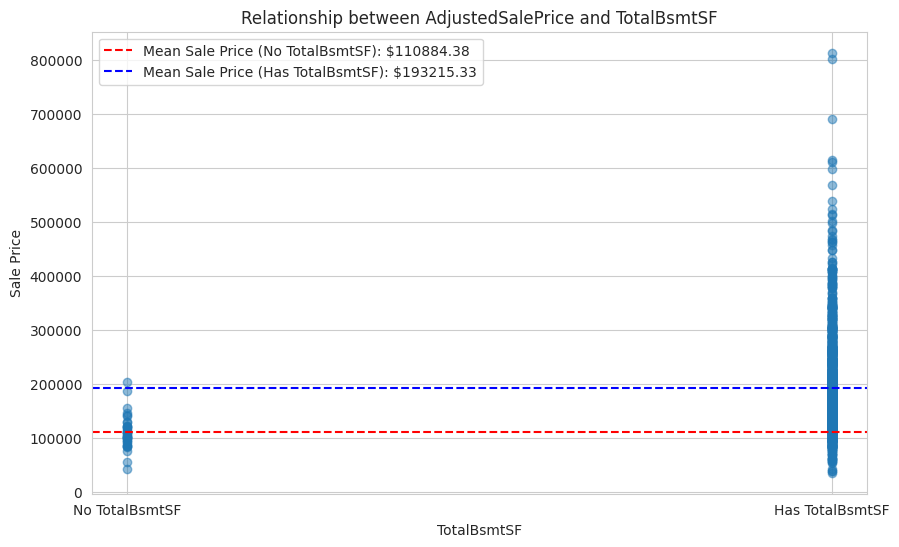

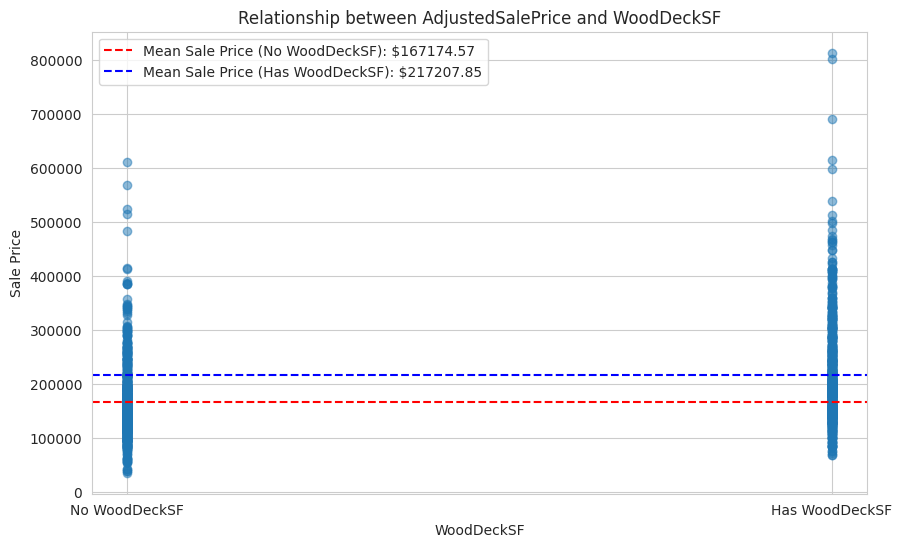

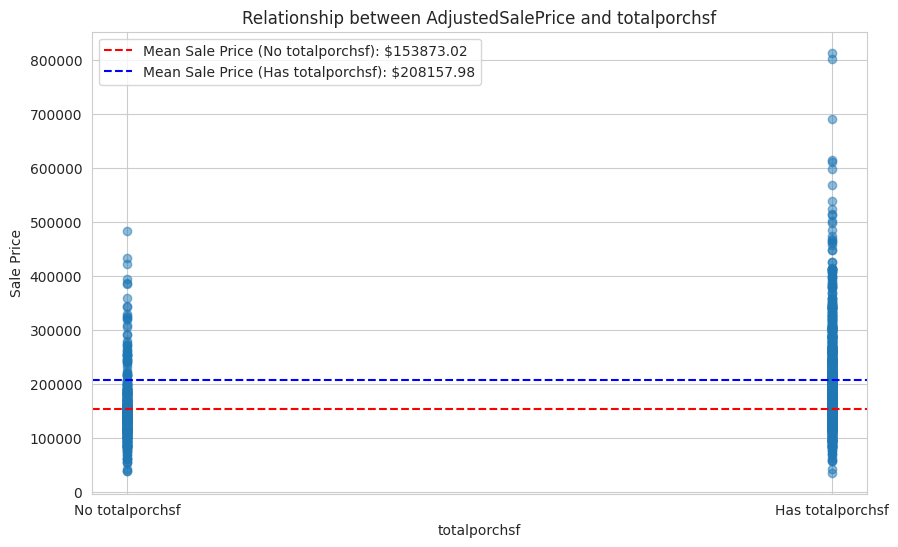

In [ ]:
# No correlation according to heatmap, transformed to binary results instead. There is a difference in mean values based on whether house has a feature or not

#clear differences in mean between each indicator

train_data['fireplaceindicator'] = train_data['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
train_data['poolindicator'] = train_data['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
train_data['2ndfloorindicator'] = train_data['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
train_data['garageindicator'] = train_data['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
train_data['basementindicator'] = train_data['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
train_data['porchindicator'] = train_data['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
train_data['basementindicator'] = train_data['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
train_data['wooddeckindicator'] = train_data['WoodDeckSF'].apply(lambda x: 1 if x > 0 else 0)
train_data['totalporchsf'] = train_data['Total_porch_sf'] = (train_data['OpenPorchSF'] + train_data['3SsnPorch'] +
                              train_data['EnclosedPorch'] + train_data['ScreenPorch'])
train_data['porchindicator'] = train_data['totalporchsf'].apply(lambda x: 1 if x > 0 else 0)

def plot_mean_sale_price_by_feature(train_data, feature_name, feature_indicator_col, target_col, figsize=(10, 6)):
    """
    Plot the relationship between the adjusted sale price and a binary feature indicator variable.

    Args:
        train_data: DataFrame containing features and outcome variables
        feature_name: Feature analyzed to see if having that specific feature has an impact on sale price
        feature_indicator_col: Column representing the binary indicator variable
        target_col: The name of the outcome variable
        figsize): The size of the figure
    """
    #Calculate mean lines
    mean_sale_price_no_feature = train_data[train_data[feature_indicator_col] == 0][target_col].mean()
    mean_sale_price_has_feature = train_data[train_data[feature_indicator_col] == 1][target_col].mean()

    fig, ax = plt.subplots(figsize=figsize)
    plt.scatter(train_data[feature_indicator_col], train_data[target_col], alpha=0.5)

    #Plot mean lines
    plt.axhline(y=mean_sale_price_no_feature, color='r', linestyle='--', label=f'Mean Sale Price (No {feature_name}): ${mean_sale_price_no_feature:.2f}')
    plt.axhline(y=mean_sale_price_has_feature, color='b', linestyle='--', label=f'Mean Sale Price (Has {feature_name}): ${mean_sale_price_has_feature:.2f}')

    plt.title(f"Relationship between AdjustedSalePrice and {feature_name}")
    plt.xlabel(feature_name)
    plt.xticks([0, 1], [f'No {feature_name}', f'Has {feature_name}'])
    plt.ylabel('Sale Price')
    plt.legend()
    plt.show()

# Plot differences between having a specific house feature and not:
plot_mean_sale_price_by_feature(train_data, 'Fireplace', 'fireplaceindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'PoolArea', 'poolindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, '2ndFlrSF', '2ndfloorindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'GarageArea', 'garageindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'TotalBsmtSF', 'basementindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'TotalBsmtSF', 'basementindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'WoodDeckSF', 'wooddeckindicator', 'AdjustedSalePrice')
plot_mean_sale_price_by_feature(train_data, 'totalporchsf', 'porchindicator', 'AdjustedSalePrice')

### 3.3 Categorical Feature

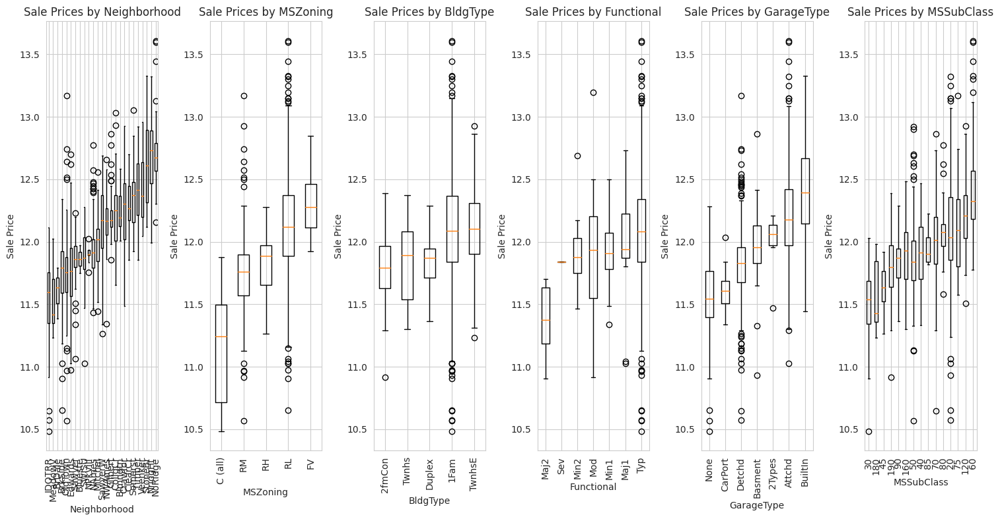

In [ ]:
# Out of 43 non-numeric columns, we choose some to convert into numeric columns based on intuition of impact to sale price

neighborhoods = train_data['Neighborhood']
mszoning_values = train_data['MSZoning']
bldgtype_values = train_data['BldgType']
functional_rating = train_data['Functional']
garage_values = train_data['GarageType']
sale_prices = train_data['LogAdjustedSalePrice']
mssubclass_values = train_data['MSSubClass']


# Neighborhood Plot
neighborhood_means = train_data.groupby('Neighborhood')['LogAdjustedSalePrice'].mean().sort_values()
sorted_neighborhoods = neighborhood_means.index

neighborhood_dict = {}
for neighborhood, price in zip(neighborhoods, sale_prices):
    if neighborhood not in neighborhood_dict:
        neighborhood_dict[neighborhood] = [price]
    else:
        neighborhood_dict[neighborhood].append(price)

data_for_boxplot_neighborhood = [neighborhood_dict[neighborhood] for neighborhood in sorted_neighborhoods]

# MSZoning Plot
mszoning_means = train_data.groupby('MSZoning')['LogAdjustedSalePrice'].mean().sort_values()
sorted_mszoning_values = mszoning_means.index  # Fix the variable name here

mszoning_dict = {}
for mszoning, price in zip(mszoning_values, sale_prices):
    if mszoning not in mszoning_dict:
        mszoning_dict[mszoning] = [price]
    else:
        mszoning_dict[mszoning].append(price)

data_for_boxplot_mszoning = [mszoning_dict[mszoning] for mszoning in sorted_mszoning_values]

# BldgType Plot
bldgtype_dict = {}
for bldgtype, price in zip(bldgtype_values, sale_prices):
    if bldgtype not in bldgtype_dict:
        bldgtype_dict[bldgtype] = [price]
    else:
        bldgtype_dict[bldgtype].append(price)

sorted_bldgtype_values = sorted(bldgtype_dict, key=lambda x: sum(bldgtype_dict[x]) / len(bldgtype_dict[x]))
data_for_boxplot_bldgtype = [bldgtype_dict[bldgtype] for bldgtype in sorted_bldgtype_values]

# Funcational Plot
functional_means = train_data.groupby('Functional')['LogAdjustedSalePrice'].mean().sort_values()
sorted_functional_values = functional_means.index

functional_dict = {}
for functional, price in zip(functional_rating, sale_prices):
    if functional not in functional_dict:
        functional_dict[functional] = [price]
    else:
        functional_dict[functional].append(price)

data_for_boxplot_functional = [functional_dict[functional] for functional in sorted_functional_values]

#GarageType Plot
train_data['GarageType'].fillna('No Garage', inplace=True)
garage_means = train_data.groupby('GarageType')['LogAdjustedSalePrice'].mean().sort_values()
sorted_garage = garage_means.index

garage_dict = {}
for garage, price in zip(garage_values, sale_prices):
    if garage not in garage_dict:
        garage_dict[garage] = [price]
    else:
        garage_dict[garage].append(price)

data_for_boxplot_garage = [garage_dict[garage] for garage in sorted_garage]

#mssubclass
mssubclass_means = train_data.groupby('MSSubClass')['LogAdjustedSalePrice'].mean().sort_values()
sorted_mssubclass = mssubclass_means.index

mssubclass_dict = {}
for mssubclass, price in zip(mssubclass_values, sale_prices):
    if mssubclass not in mssubclass_dict:
        mssubclass_dict[mssubclass] = [price]
    else:
        mssubclass_dict[mssubclass].append(price)

data_for_mssubclass = [mssubclass_dict[mssubclass] for mssubclass in sorted_mssubclass]


# Create Subplots in Figure

fig, axs = plt.subplots(nrows=1, ncols=6, figsize=(15, 8))

axs[0].boxplot(data_for_boxplot_neighborhood, labels=sorted_neighborhoods)
axs[0].set_xlabel('Neighborhood')
axs[0].set_ylabel('Sale Price')
axs[0].set_title('Sale Prices by Neighborhood')
axs[0].tick_params(axis='x', rotation=90)

axs[1].boxplot(data_for_boxplot_mszoning, labels=sorted_mszoning_values)
axs[1].set_xlabel('MSZoning')
axs[1].set_ylabel('Sale Price')
axs[1].set_title('Sale Prices by MSZoning')
axs[1].tick_params(axis='x', rotation=90)

axs[2].boxplot(data_for_boxplot_bldgtype, labels=sorted_bldgtype_values)
axs[2].set_xlabel('BldgType')
axs[2].set_ylabel('Sale Price')
axs[2].set_title('Sale Prices by BldgType')
axs[2].tick_params(axis='x', rotation=90)

axs[3].boxplot(data_for_boxplot_functional, labels=sorted_functional_values)
axs[3].set_xlabel('Functional')
axs[3].set_ylabel('Sale Price')
axs[3].set_title('Sale Prices by Functional')
axs[3].tick_params(axis='x', rotation=90)

axs[4].boxplot(data_for_boxplot_garage, labels=sorted_garage)
axs[4].set_xlabel('GarageType')
axs[4].set_ylabel('Sale Price')
axs[4].set_title('Sale Prices by GarageType')
axs[4].tick_params(axis='x', rotation=90)

axs[5].boxplot(data_for_mssubclass, labels=sorted_mssubclass)
axs[5].set_xlabel('MSSubClass')
axs[5].set_ylabel('Sale Price')
axs[5].set_title('Sale Prices by MSSubClass')
axs[5].tick_params(axis='x', rotation=90)


plt.tight_layout()
plt.show()

#### 3.3.1 Creating Features

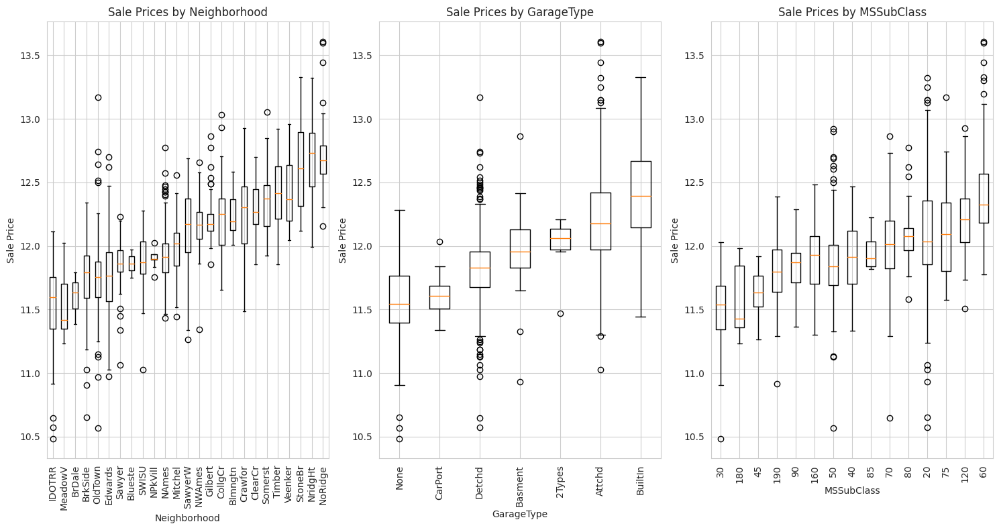

In [ ]:
# Narrowed down to Neighborhood, MSSubClass and Garage Type
neighborhoods = train_data['Neighborhood']
garage_values = train_data['GarageType']
sale_prices = train_data['LogAdjustedSalePrice']
mssubclass_values = train_data['MSSubClass']


# Neighborhood Plot
neighborhood_means = train_data.groupby('Neighborhood')['LogAdjustedSalePrice'].mean().sort_values()
sorted_neighborhoods = neighborhood_means.index

neighborhood_dict = {}
for neighborhood, price in zip(neighborhoods, sale_prices):
    if neighborhood not in neighborhood_dict:
        neighborhood_dict[neighborhood] = [price]
    else:
        neighborhood_dict[neighborhood].append(price)

data_for_boxplot_neighborhood = [neighborhood_dict[neighborhood] for neighborhood in sorted_neighborhoods]

#GarageType Plot
train_data['GarageType'].fillna('No Garage', inplace=True)
garage_means = train_data.groupby('GarageType')['LogAdjustedSalePrice'].mean().sort_values()
sorted_garage = garage_means.index

garage_dict = {}
for garage, price in zip(garage_values, sale_prices):
    if garage not in garage_dict:
        garage_dict[garage] = [price]
    else:
        garage_dict[garage].append(price)

data_for_boxplot_garage = [garage_dict[garage] for garage in sorted_garage]

#mssubclass
mssubclass_means = train_data.groupby('MSSubClass')['LogAdjustedSalePrice'].mean().sort_values()
sorted_mssubclass = mssubclass_means.index

mssubclass_dict = {}
for mssubclass, price in zip(mssubclass_values, sale_prices):
    if mssubclass not in mssubclass_dict:
        mssubclass_dict[mssubclass] = [price]
    else:
        mssubclass_dict[mssubclass].append(price)

data_for_mssubclass = [mssubclass_dict[mssubclass] for mssubclass in sorted_mssubclass]


# Create Subplots in Figure

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))

axs[0].boxplot(data_for_boxplot_neighborhood, labels=sorted_neighborhoods)
axs[0].set_xlabel('Neighborhood')
axs[0].set_ylabel('Sale Price')
axs[0].set_title('Sale Prices by Neighborhood')
axs[0].tick_params(axis='x', rotation=90)

axs[1].boxplot(data_for_boxplot_garage, labels=sorted_garage)
axs[1].set_xlabel('GarageType')
axs[1].set_ylabel('Sale Price')
axs[1].set_title('Sale Prices by GarageType')
axs[1].tick_params(axis='x', rotation=90)

axs[2].boxplot(data_for_mssubclass, labels=sorted_mssubclass)
axs[2].set_xlabel('MSSubClass')
axs[2].set_ylabel('Sale Price')
axs[2].set_title('Sale Prices by MSSubClass')
axs[2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
# update some categorical features to ordered numbers then combine existing categorical features intuitively
train_data = train_data.replace({"GarageCond" : {"None":0, "No" : 0, "Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "GarageQual" : {"None":0, "No" : 0, "Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                            "ExterCond" : {"Po" : 1, "Fa" : 2, "TA": 3, "Gd": 4, "Ex" : 5},
                       "ExterQual" : {"Po" : 1, "Fa" : 2, "TA": 3, "Gd": 4, "Ex" : 5},
                            "KitchenQual" : {"Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5}})


# Overall quality of the garage
train_data["GarageGrade"] = train_data["GarageQual"] * train_data["GarageCond"]
# Overall quality of the exterior
train_data["ExterGrade"] = train_data["ExterQual"] * train_data["ExterCond"]

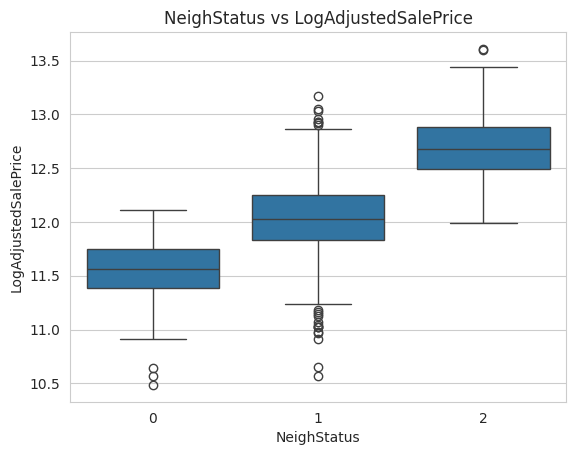

Correlation between NeighRich and Log Adjusted Sale Price: 0.56188652536096


In [ ]:
# Binning Neighborhoods based on the median sale price (poor, normal, rich)

rich = train_data['Neighborhood'].isin(['StoneBr', 'NridgHt', 'NoRidge'])
normal = ~train_data['Neighborhood'].isin(['MeadowV', 'IDOTRR', 'BrDale', 'StoneBr', 'NridgHt', 'NoRidge'])
poor = train_data['Neighborhood'].isin(['MeadowV', 'IDOTRR', 'BrDale'])

train_data['NeighStatus'] = None
train_data.loc[rich, 'NeighStatus'] = 2
train_data.loc[normal, 'NeighStatus'] = 1
train_data.loc[poor, 'NeighStatus'] = 0

train_data['NeighStatus'] = pd.to_numeric(train_data['NeighStatus'], errors='coerce')
sns.boxplot(x='NeighStatus', y='LogAdjustedSalePrice', data=train_data)
plt.title('NeighStatus vs LogAdjustedSalePrice')
plt.show()


correlation = train_data['NeighStatus'].corr(train_data['LogAdjustedSalePrice'])
print(f"Correlation between NeighRich and Log Adjusted Sale Price: {correlation}")

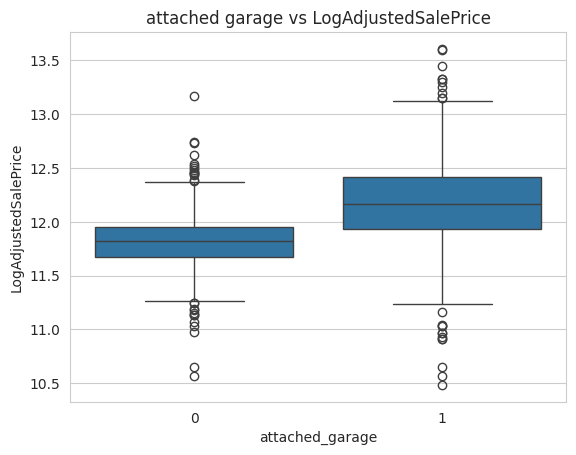

Correlation between 'LogAdjustedSalePrice' and 'attached_garage': 0.3981178201170646


In [ ]:
categories_to_group = ['No Garage', 'CarPort', 'Detchd']

train_data['attached_garage'] = train_data['GarageType'].apply(lambda x: 0 if x in categories_to_group else 1)

sns.boxplot(x='attached_garage', y='LogAdjustedSalePrice', data=train_data)
plt.title('attached garage vs LogAdjustedSalePrice')
plt.show()

correlation = train_data['LogAdjustedSalePrice'].corr(train_data['attached_garage'].astype('category').cat.codes)
print(f"Correlation between 'LogAdjustedSalePrice' and 'attached_garage': {correlation}")

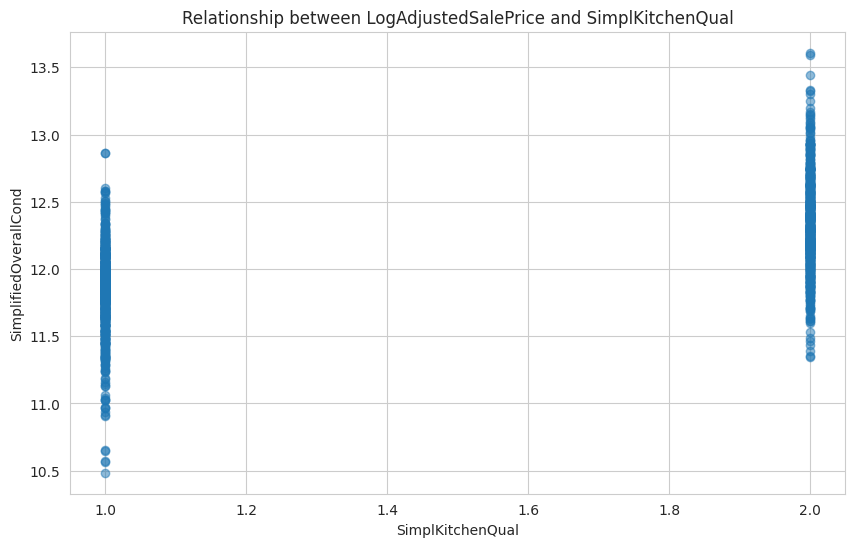

The correlation coefficient between LogAdjustedSalePrice and SimplKitchenQual: 0.6051


In [ ]:
train_data["SimplKitchenQual"] = train_data.KitchenQual.replace({1 : 1, # bad
                                                       2 : 1, 3 : 1, # average
                                                       4 : 2, 5 : 2 # good
                                                      })

fig, ax = plt.subplots(figsize=(10, 6))
plt.scatter(train_data['SimplKitchenQual'], train_data['LogAdjustedSalePrice'], alpha=0.5)
plt.title(f"Relationship between LogAdjustedSalePrice and SimplKitchenQual")
plt.xlabel("SimplKitchenQual")
plt.ylabel('SimplifiedOverallCond')
plt.show()

SimplKitchenQual_correlation = train_data['SimplKitchenQual'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between LogAdjustedSalePrice and SimplKitchenQual: {SimplKitchenQual_correlation:.4f}")

### 3.4 Correlation and Skewness

#### 3.4.1 Total Square Footage

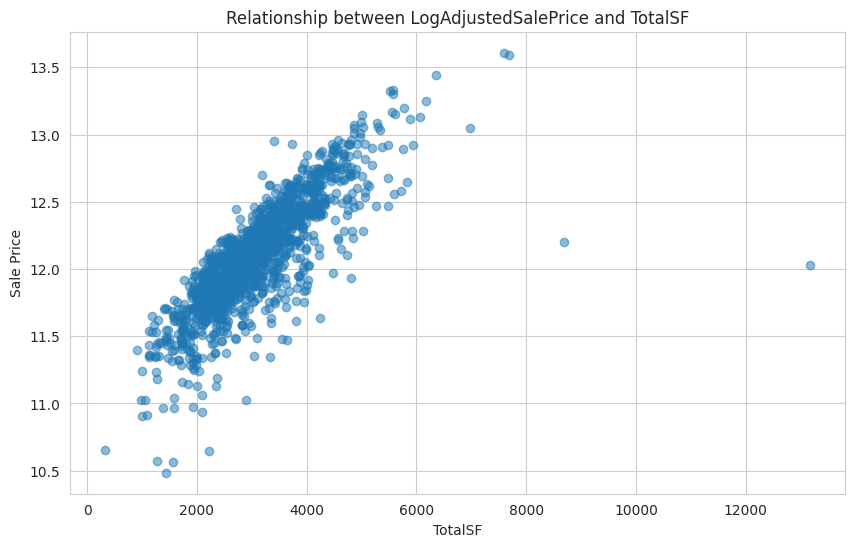

The skewness of the totalSF: 1.5111304650176458


In [ ]:
#Before Transformation

fig, ax = plt.subplots(figsize=(10, 6))
plt.scatter(train_data['TotalSF'], train_data['LogAdjustedSalePrice'], alpha=0.5)
plt.title(f"Relationship between LogAdjustedSalePrice and TotalSF")
plt.xlabel("TotalSF")
plt.ylabel('Sale Price')
plt.show()

skewness_totalSF = train_data['TotalSF'].skew()
print(f"The skewness of the totalSF: {skewness_totalSF}")

In [ ]:
# Drop Outliers
train_data.drop(train_data[(train_data['TotalSF']>6000) & (train_data['LogAdjustedSalePrice']<12.5)].index, inplace=True)

# Fix Skew
train_data["LogAdjustedTotalSF"] = np.log1p(train_data["TotalSF"])

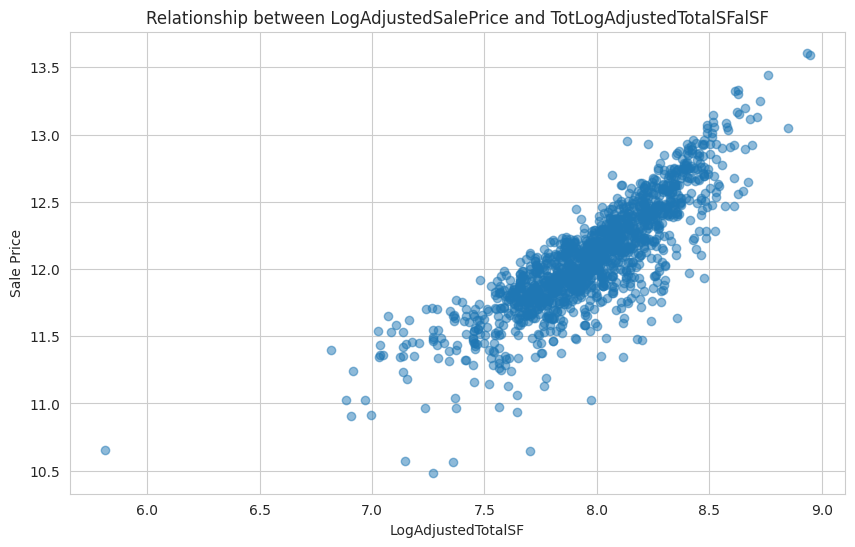

The correlation coefficient between log adjusted TotalSF and log adjusted sale price: 0.8408
The skewness of the Log Adjusted totalSF: -0.5368830697911998


In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.scatter(train_data['LogAdjustedTotalSF'], train_data['LogAdjustedSalePrice'], alpha=0.5)
plt.title(f"Relationship between LogAdjustedSalePrice and TotLogAdjustedTotalSFalSF")
plt.xlabel("LogAdjustedTotalSF")
plt.ylabel('Sale Price')
plt.show()

log_totalSF_correlation = train_data['LogAdjustedTotalSF'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between log adjusted TotalSF and log adjusted sale price: {log_totalSF_correlation:.4f}")

skewness_totalSF = train_data['LogAdjustedTotalSF'].skew()
print(f"The skewness of the Log Adjusted totalSF: {skewness_totalSF}")

#### 3.4.2 Total Bath

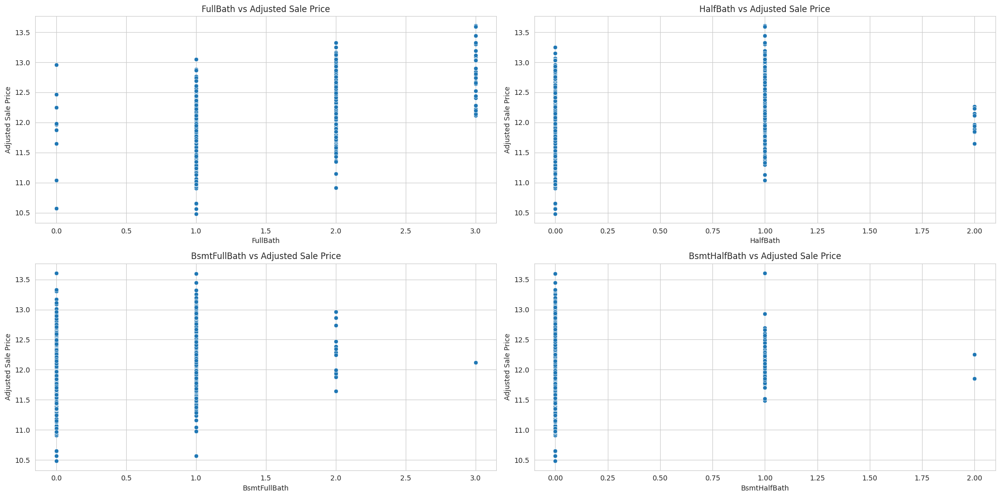

In [ ]:
# graph each bath variables

bath_variables = ['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']
plt.figure(figsize=(20, 10))

for i, feature in enumerate(bath_variables):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(x=train_data[feature], y=train_data['LogAdjustedSalePrice'])
    plt.title(f'{feature} vs Adjusted Sale Price')
    plt.xlabel(feature)
    plt.ylabel('Adjusted Sale Price')

plt.tight_layout()
plt.show()

# FullBath seems to have the most sensical relationship with Price

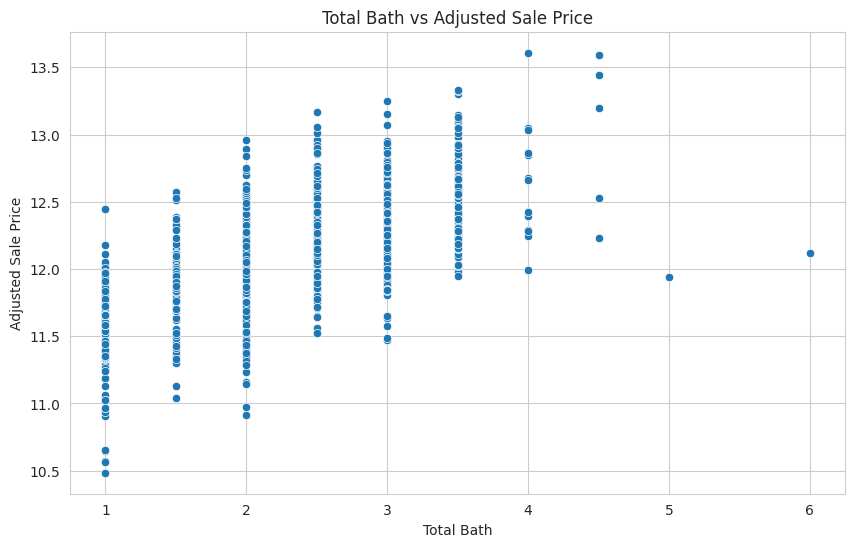

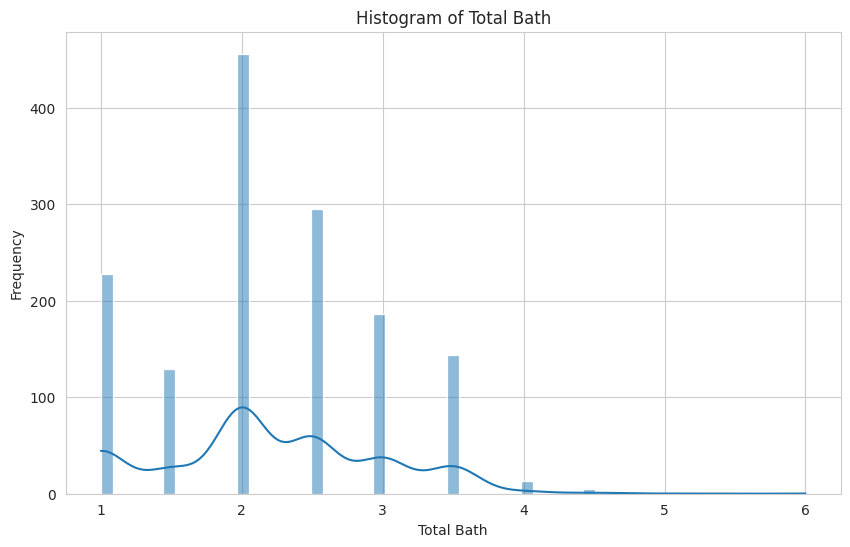

The correlation coefficient between total bath and log adjusted sale price: 0.6706
The skewness of the total porch sqft: 0.24668739850732258


In [ ]:
# graphing TotalBath with adjusted sale price

plt.figure(figsize = (10,6))
sns.scatterplot(x = train_data['TotalBath'], y = train_data['LogAdjustedSalePrice'])
plt.title('Total Bath vs Adjusted Sale Price')
plt.xlabel('Total Bath')
plt.ylabel('Adjusted Sale Price')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(train_data['TotalBath'], kde=True)
plt.title('Histogram of Total Bath')
plt.xlabel('Total Bath')
plt.ylabel('Frequency')
plt.show()

#looking at the correlation between totalporchsqft and adjusted sale price
totalbath_correlation = train_data['TotalBath'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between total bath and log adjusted sale price: {totalbath_correlation:.4f}")

#overall it seems that the correlation between total bath and adjusted sale price is relatively strong

skewness_totalbath = train_data['TotalBath'].skew()
print(f"The skewness of the total porch sqft: {skewness_totalbath}")

# skew is not bad
# not necessary to apply transformation. leave as is

#### 3.4.3 Total Porch Square Foot

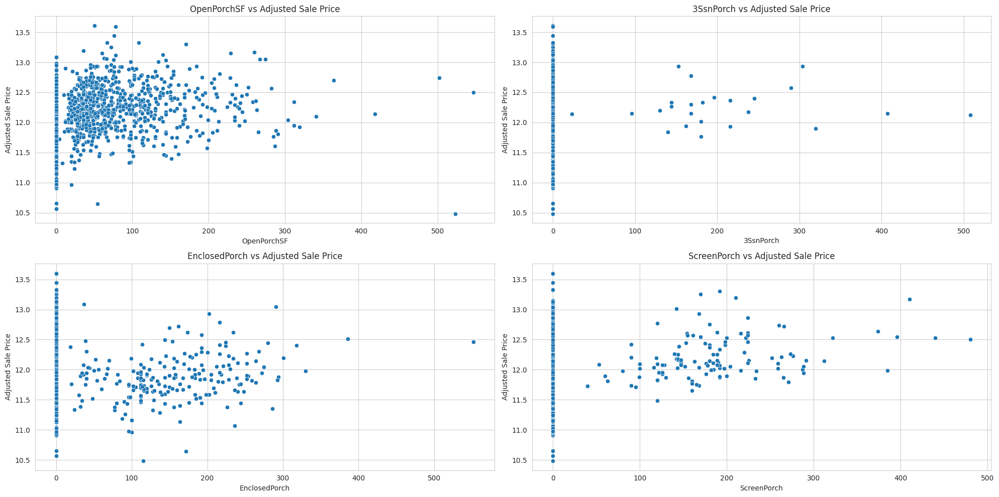

In [ ]:
# graphing each porch features
porch_features = ['OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'ScreenPorch']

plt.figure(figsize=(20, 10))

for i, feature in enumerate(porch_features):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(x=train_data[feature], y=train_data['LogAdjustedSalePrice'])
    plt.title(f'{feature} vs Adjusted Sale Price')
    plt.xlabel(feature)  # Corrected typo here
    plt.ylabel('Adjusted Sale Price')

plt.tight_layout()
plt.show()

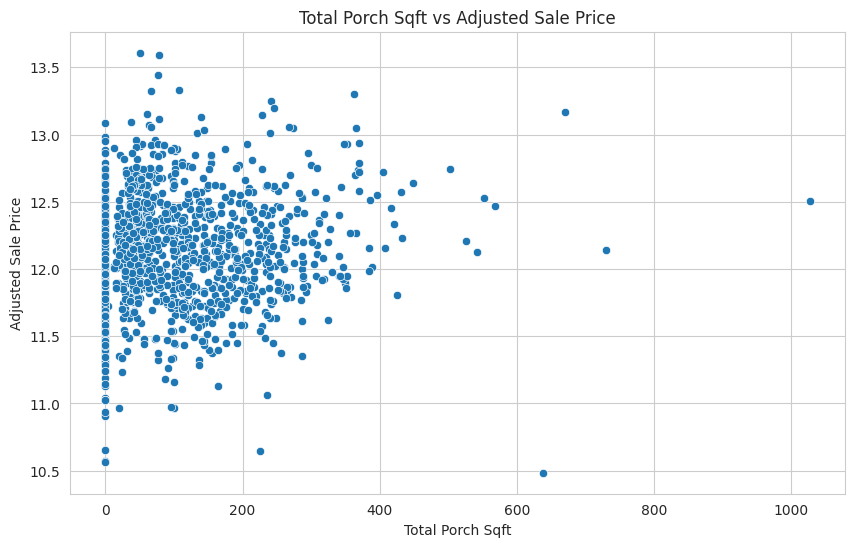

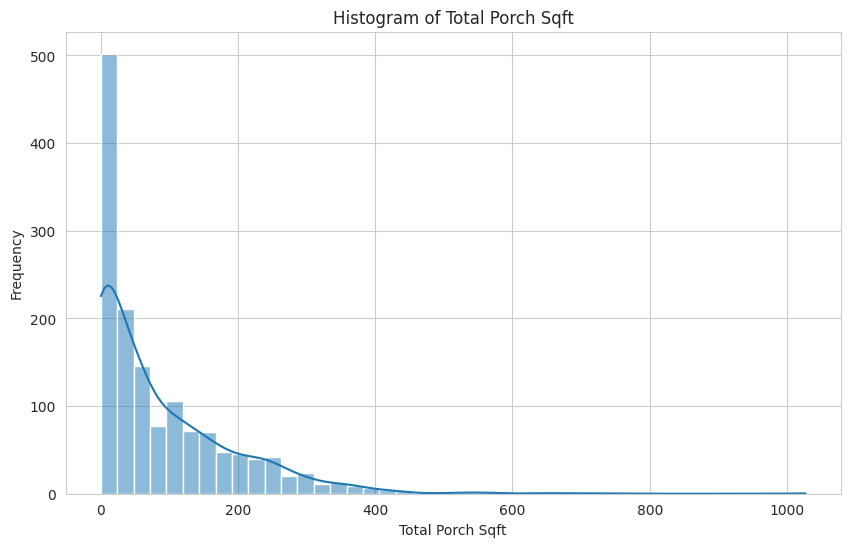

The correlation coefficient between total porch sqft and log adjusted sale price: 0.1969
The skewness of the total porch sqft: 2.011470860262991


In [ ]:
# graphing totalporchsf with adjusted sale price
plt.figure(figsize = (10,6))
sns.scatterplot(x = train_data['totalporchsf'], y = train_data['LogAdjustedSalePrice'])
plt.title('Total Porch Sqft vs Adjusted Sale Price')
plt.xlabel('Total Porch Sqft')
plt.ylabel('Adjusted Sale Price')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(train_data['totalporchsf'], kde=True)
plt.title('Histogram of Total Porch Sqft')
plt.xlabel('Total Porch Sqft')
plt.ylabel('Frequency')
plt.show()

#looking at the correlation between totalporchsqft and adjusted sale price
porch_correlation = train_data['totalporchsf'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between total porch sqft and log adjusted sale price: {porch_correlation:.4f}")

#overall it seems that the correlation between total porch and adjusted sale price is relatively weak

skewness_totalporchsf = train_data['totalporchsf'].skew()
print(f"The skewness of the total porch sqft: {skewness_totalporchsf}")

#there is a moderate but strong positive skew meaning that its not symmetrical and theres
# a significant tail that streches out to the rightside of the distribution.

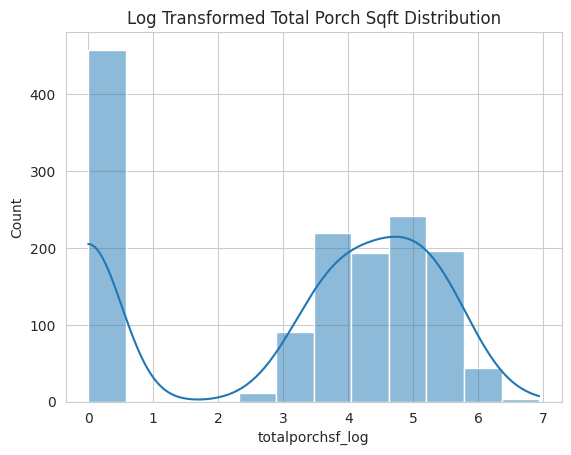

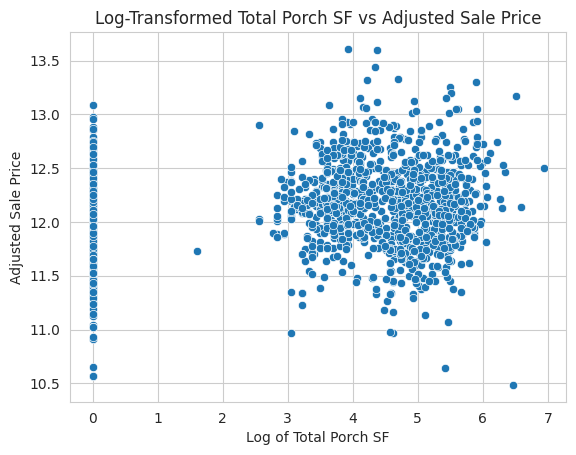

The correlation coefficient between log total porch sqft and log adjusted sale price: 0.3111
The skewness of log total porch sqft: -0.511890640902574


In [ ]:
# aplying a log transformation to help normalize the distribution of totalporchsf
# adding a small constant to handle zero before applying log transformation
train_data['totalporchsf_log'] = np.log(train_data['totalporchsf'] +1 )

sns.histplot(train_data['totalporchsf_log'], kde = True)
plt.title('Log Transformed Total Porch Sqft Distribution')
plt.show()

sns.scatterplot(x=train_data['totalporchsf_log'], y = train_data['LogAdjustedSalePrice'])
plt.title('Log-Transformed Total Porch SF vs Adjusted Sale Price')
plt.xlabel('Log of Total Porch SF')
plt.ylabel('Adjusted Sale Price')
plt.show()

log_porch_correlation = train_data['totalporchsf_log'].corr(train_data['LogAdjustedSalePrice'])
print(f"The correlation coefficient between log total porch sqft and log adjusted sale price: {log_porch_correlation:.4f}")

log_skewness_totalporchsf = train_data['totalporchsf_log'].skew()
print(f"The skewness of log total porch sqft: {log_skewness_totalporchsf}")

#### 3.4.4 Handeling Skewness

In [ ]:
numerical = train_data.dtypes[train_data.dtypes != "object"].index
train_data[numerical] = train_data[numerical].replace({'None': np.nan}).apply(pd.to_numeric, errors='coerce')
#train_data[numeric_feats] = train_data[numeric_feats].apply(pd.to_numeric, errors='coerce')

skew_features = train_data[numerical].apply(lambda x: skew(x)).sort_values(ascending=False)
#skew_features = train_data[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

high_skew = skew_features[(skew_features > 0.5) | (skew_features < -0.5)]
#skew_index = high_skew.index


print("There are {} numerical features with Skew > 0.5 :".format(skew_features.shape[0]))
skewness = pd.DataFrame({'Skew' :skew_features})

skewness

There are 69 numerical features with Skew > 0.5 :


,Skew
MiscVal,24.434913
PoolArea,15.932532
poolindicator,15.492067
LotArea,12.560986
3SsnPorch,10.286510
LowQualFinSF,8.995688
KitchenAbvGr,4.480268
BsmtFinSF2,4.247550
ScreenPorch,4.114690
BsmtHalfBath,4.095895


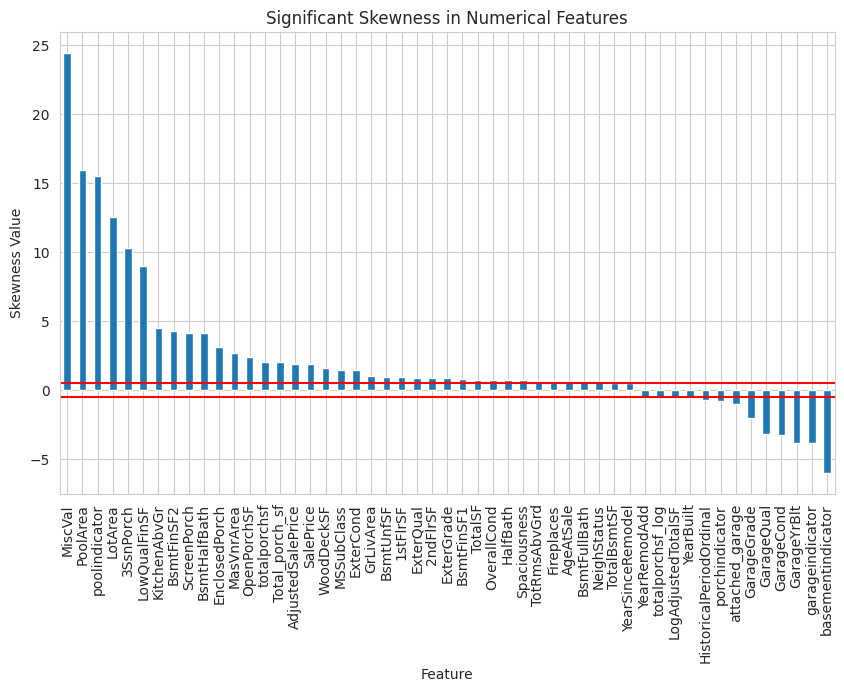

In [ ]:
significant_skewness = skewness[(skewness['Skew'] > 0.5) | (skewness['Skew'] < -0.5)]

plt.figure(figsize=(10, 6))
significant_skewness['Skew'].plot(kind='bar')
plt.title('Significant Skewness in Numerical Features')
plt.xlabel('Feature')
plt.ylabel('Skewness Value')
plt.axhline(y=0.5, color='r', linestyle='-')
plt.axhline(y=-0.5, color='r', linestyle='-')
plt.show()

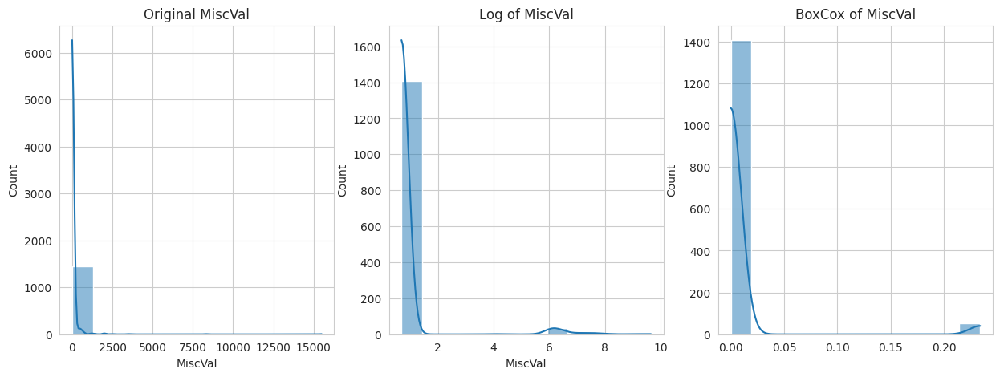

Skewness of 'MiscVal': Original 24.43, Log Transformed 5.20, BoxCox Transformed 5.01


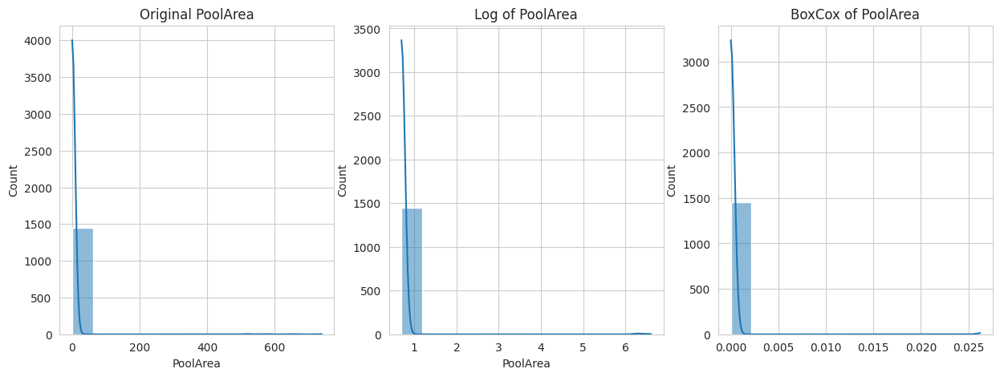

Skewness of 'PoolArea': Original 15.93, Log Transformed 15.50, BoxCox Transformed 15.49


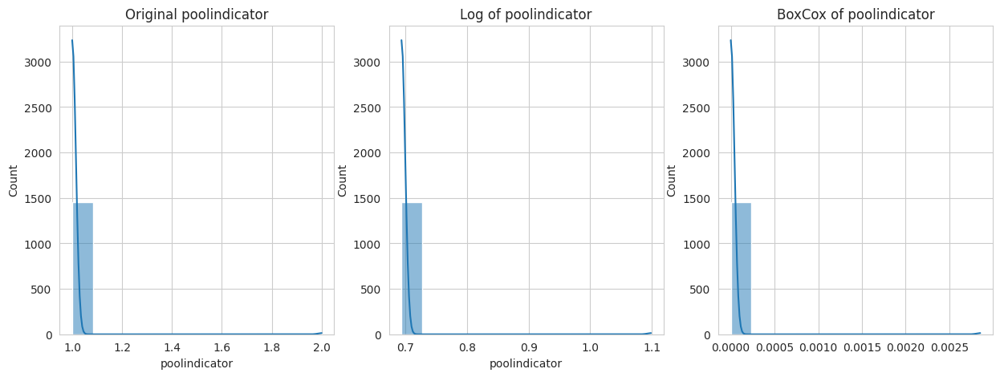

Skewness of 'poolindicator': Original 15.49, Log Transformed 15.49, BoxCox Transformed 15.49


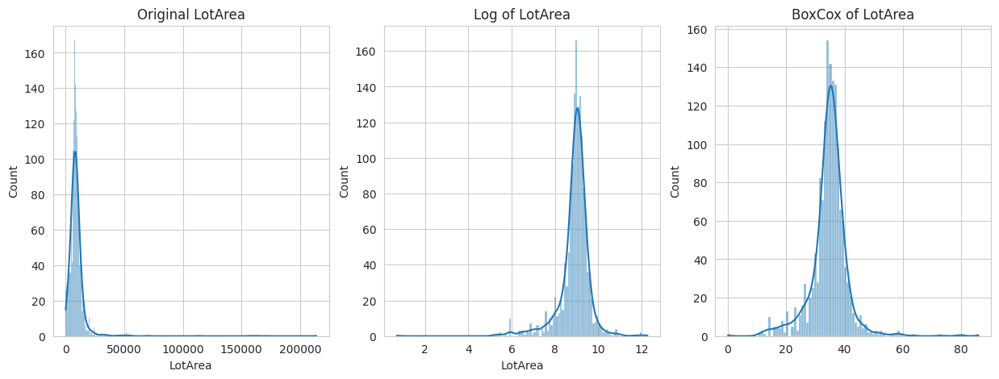

Skewness of 'LotArea': Original 12.56, Log Transformed -2.27, BoxCox Transformed 0.44


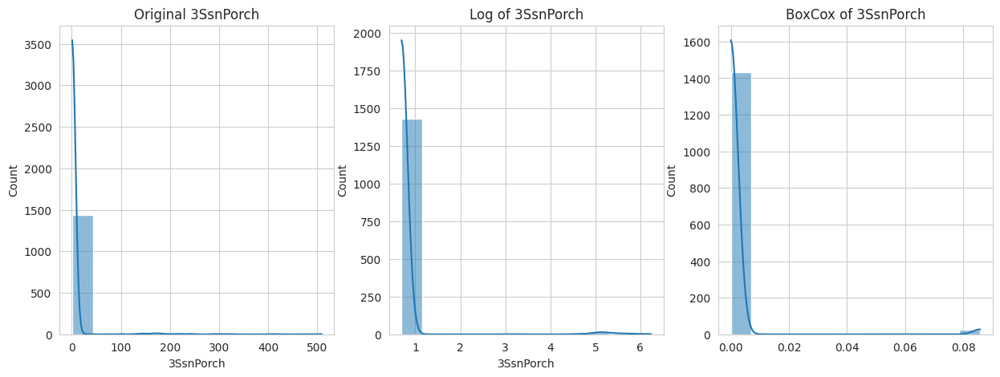

Skewness of '3SsnPorch': Original 10.29, Log Transformed 7.75, BoxCox Transformed 7.60


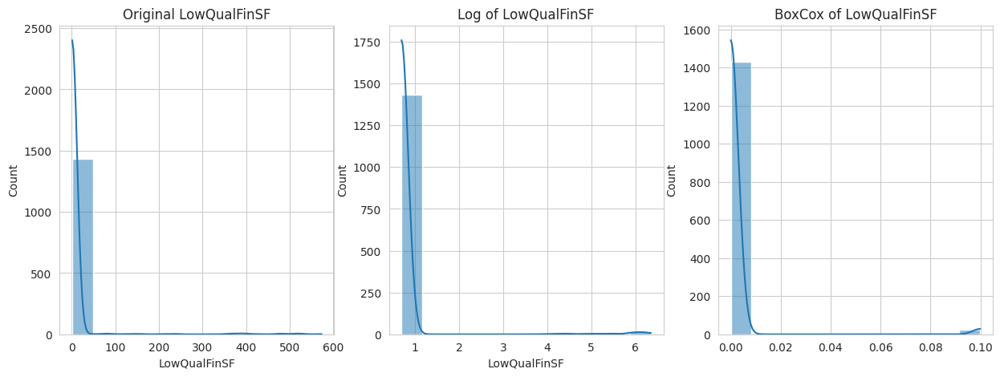

Skewness of 'LowQualFinSF': Original 9.00, Log Transformed 7.49, BoxCox Transformed 7.29


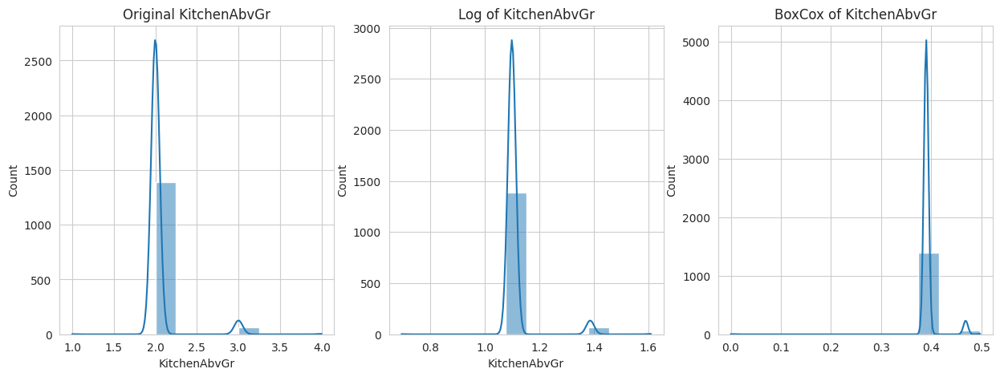

Skewness of 'KitchenAbvGr': Original 4.48, Log Transformed 4.13, BoxCox Transformed -2.80


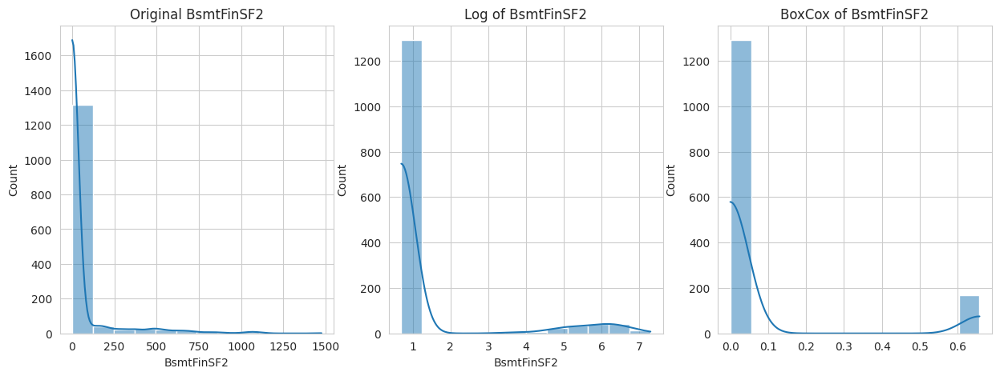

Skewness of 'BsmtFinSF2': Original 4.25, Log Transformed 2.54, BoxCox Transformed 2.42


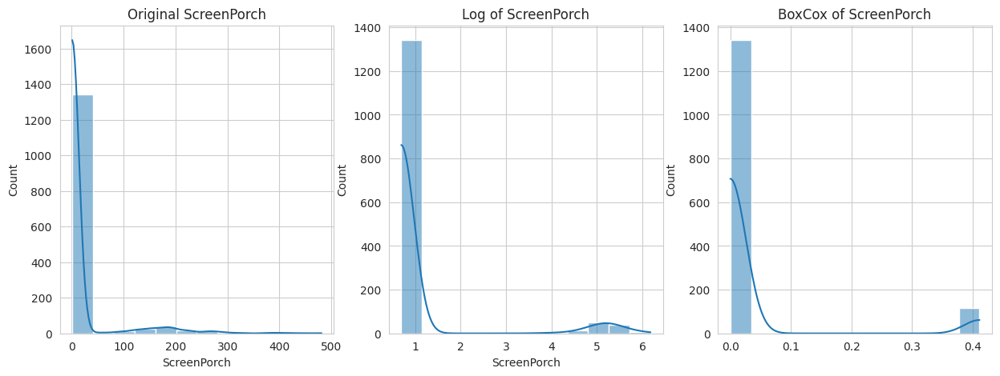

Skewness of 'ScreenPorch': Original 4.11, Log Transformed 3.16, BoxCox Transformed 3.11


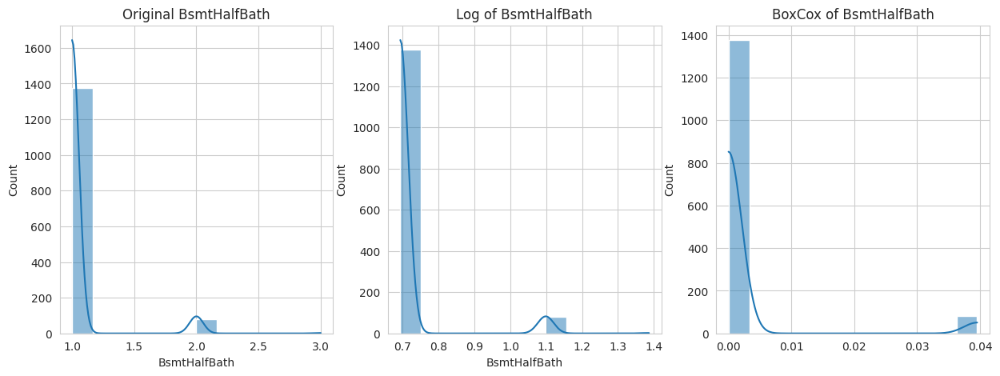

Skewness of 'BsmtHalfBath': Original 4.10, Log Transformed 3.97, BoxCox Transformed 3.85


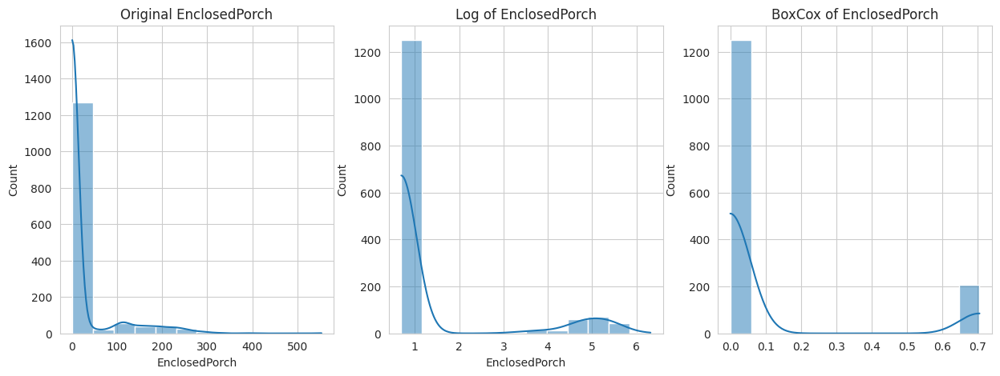

Skewness of 'EnclosedPorch': Original 3.08, Log Transformed 2.13, BoxCox Transformed 2.04


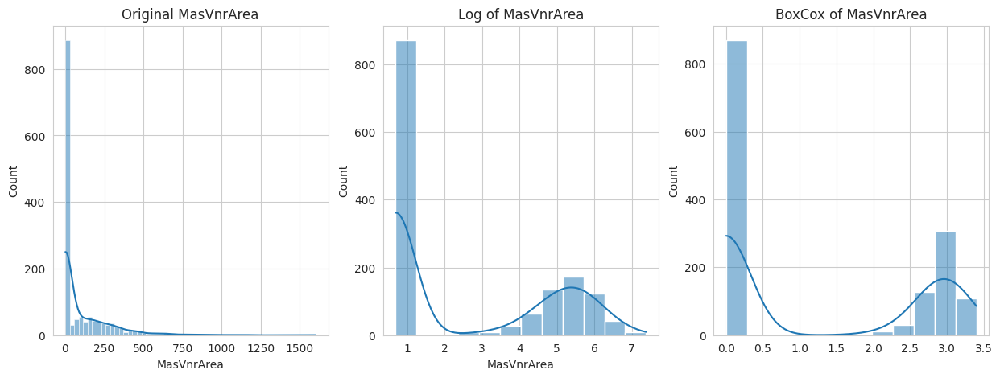

Skewness of 'MasVnrArea': Original 2.69, Log Transformed 0.54, BoxCox Transformed 0.43


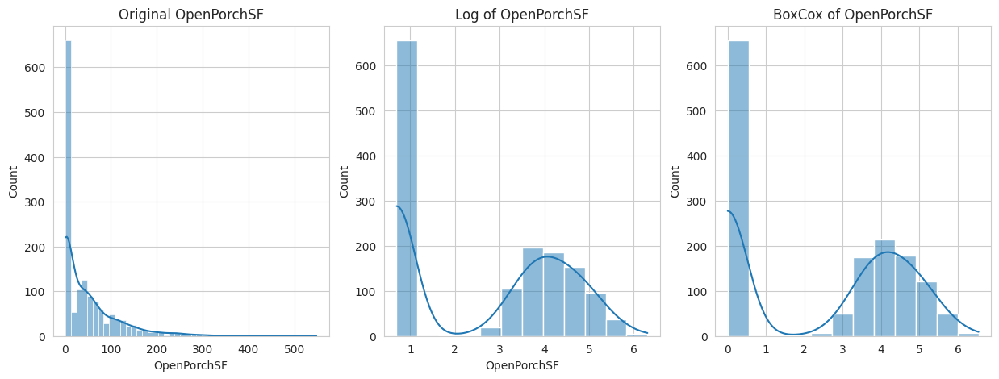

Skewness of 'OpenPorchSF': Original 2.34, Log Transformed 0.04, BoxCox Transformed -0.01


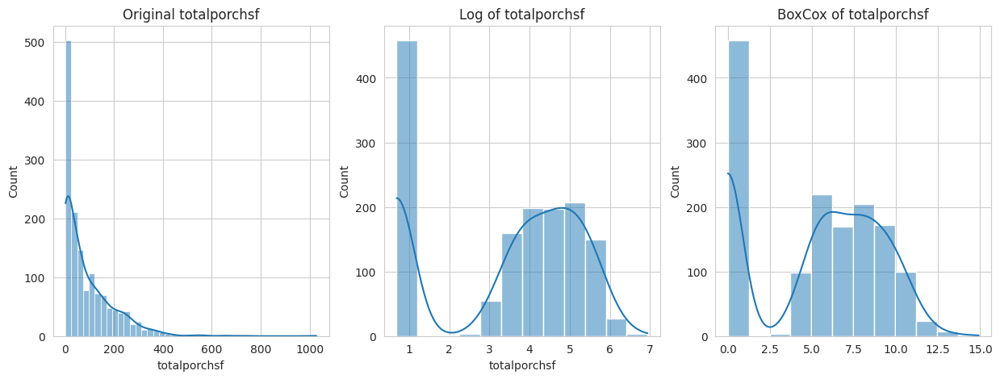

Skewness of 'totalporchsf': Original 2.01, Log Transformed -0.43, BoxCox Transformed -0.22


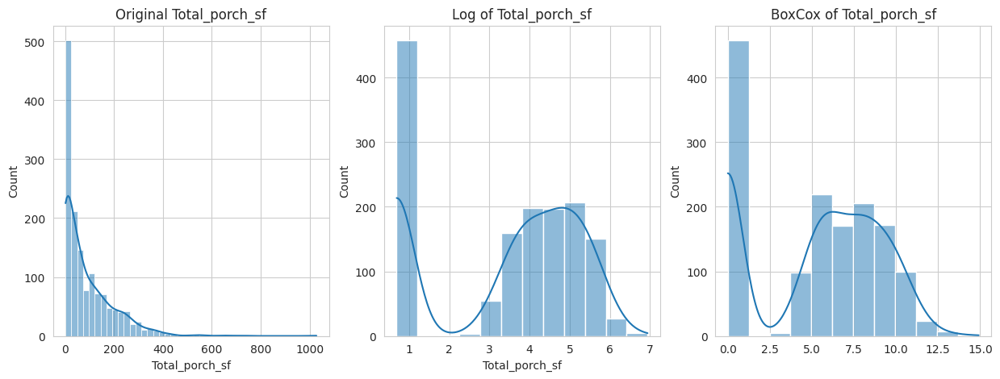

Skewness of 'Total_porch_sf': Original 2.01, Log Transformed -0.43, BoxCox Transformed -0.22


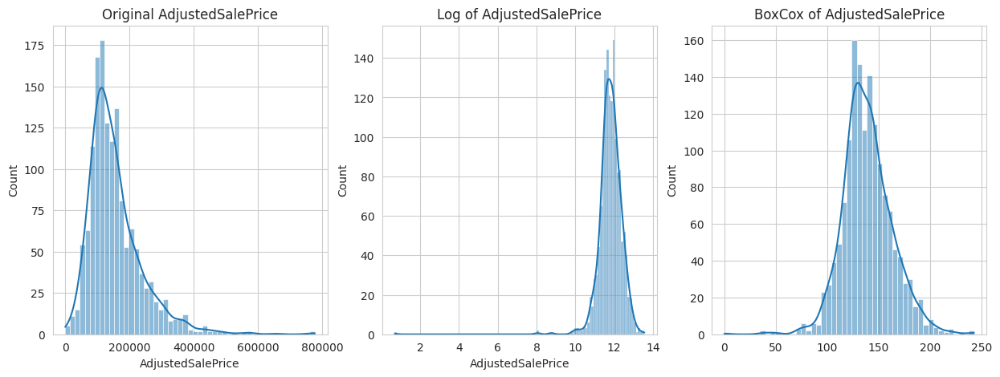

Skewness of 'AdjustedSalePrice': Original 1.89, Log Transformed -4.67, BoxCox Transformed 0.16


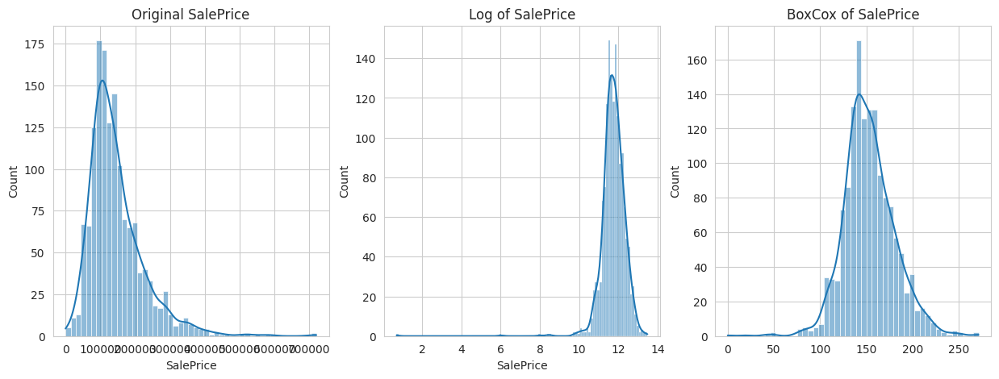

Skewness of 'SalePrice': Original 1.88, Log Transformed -4.76, BoxCox Transformed 0.18


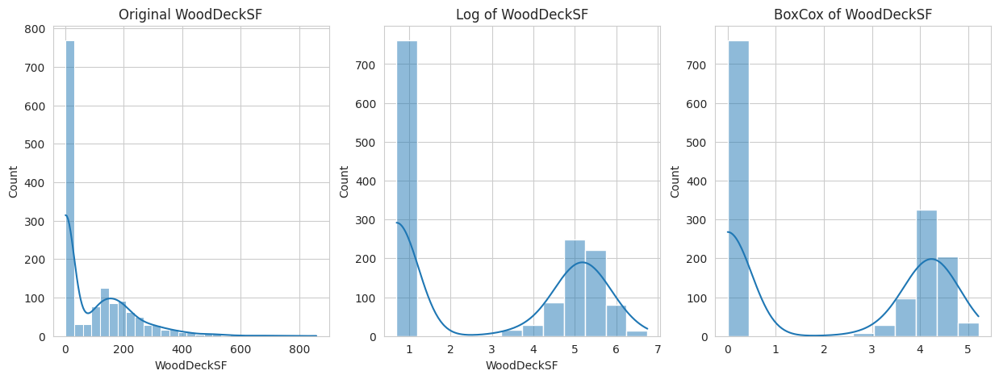

Skewness of 'WoodDeckSF': Original 1.54, Log Transformed 0.18, BoxCox Transformed 0.13


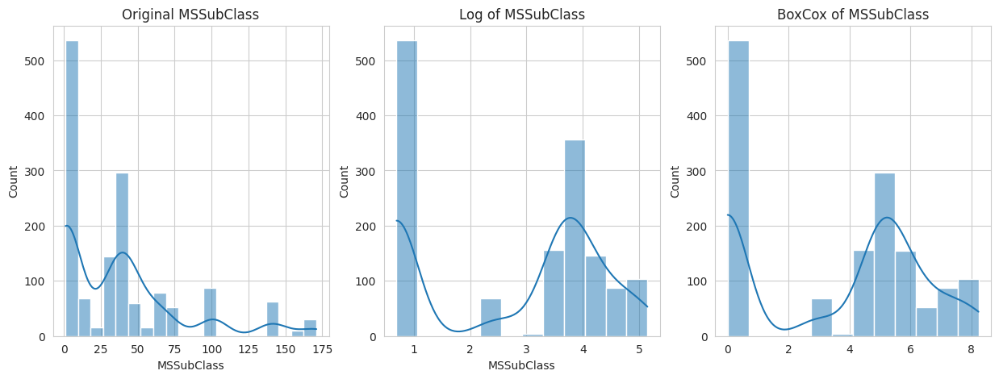

Skewness of 'MSSubClass': Original 1.41, Log Transformed -0.27, BoxCox Transformed -0.18


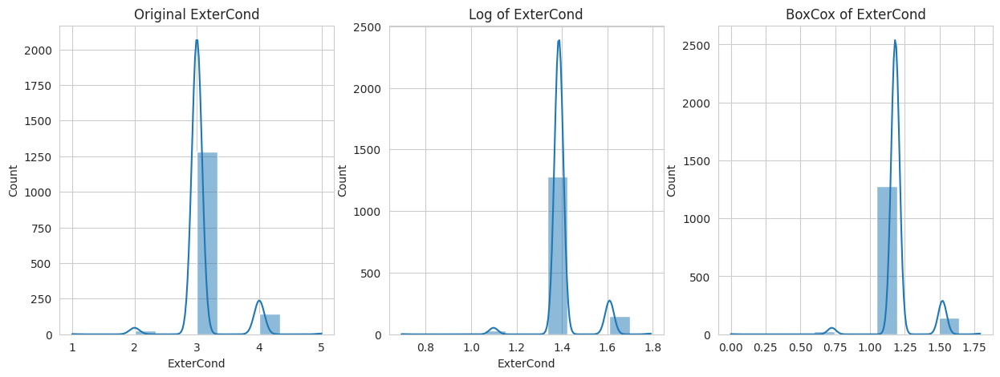

Skewness of 'ExterCond': Original 1.39, Log Transformed 0.35, BoxCox Transformed 0.05


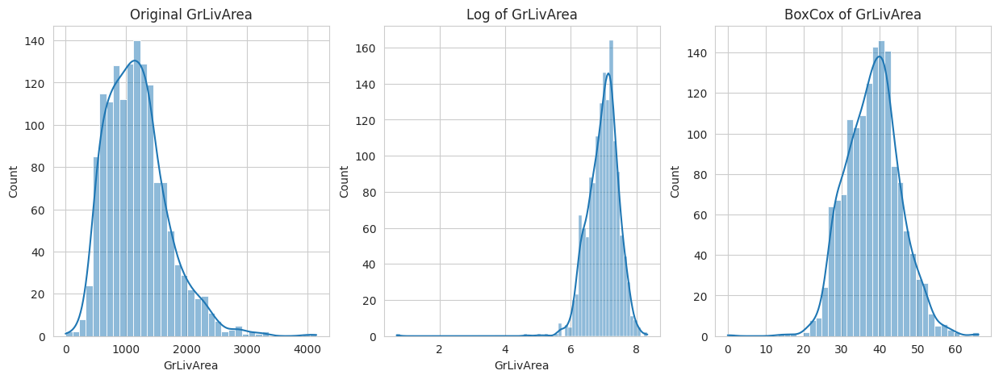

Skewness of 'GrLivArea': Original 1.01, Log Transformed -1.92, BoxCox Transformed 0.06


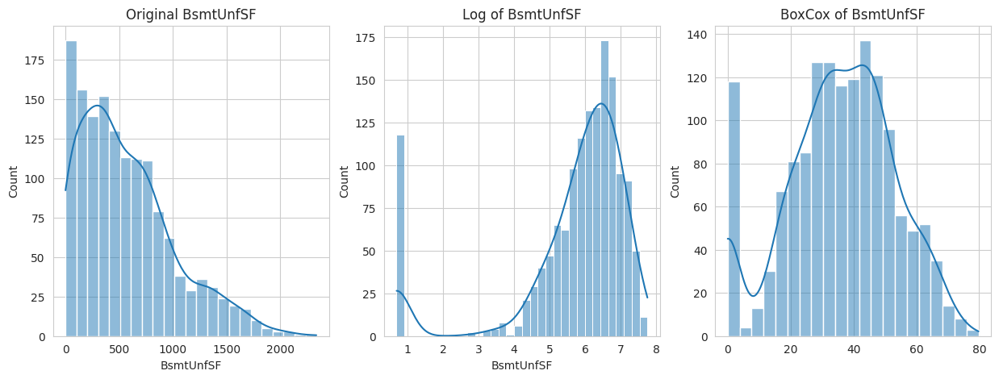

Skewness of 'BsmtUnfSF': Original 0.92, Log Transformed -2.02, BoxCox Transformed -0.27


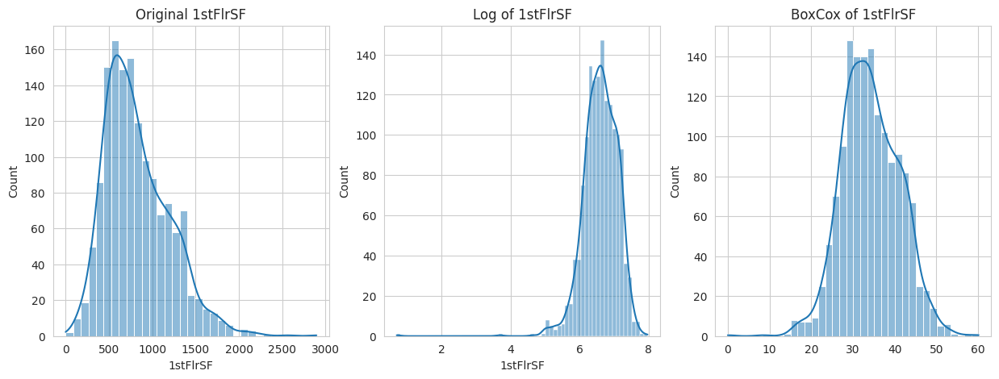

Skewness of '1stFlrSF': Original 0.89, Log Transformed -1.61, BoxCox Transformed 0.05


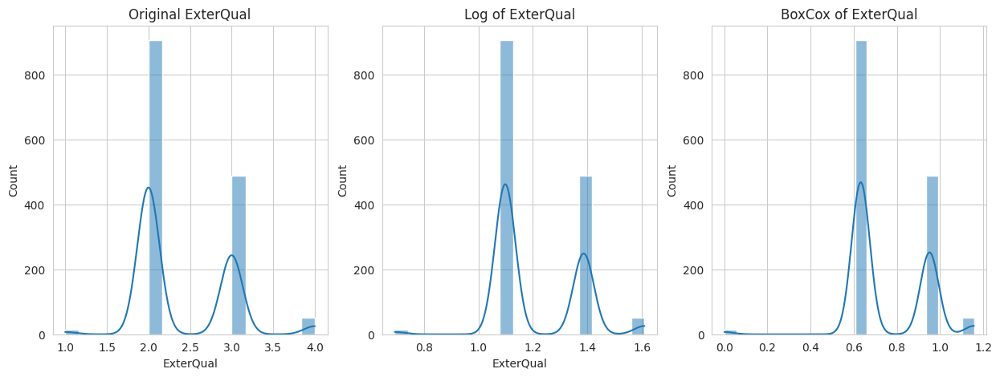

Skewness of 'ExterQual': Original 0.82, Log Transformed 0.46, BoxCox Transformed -0.02


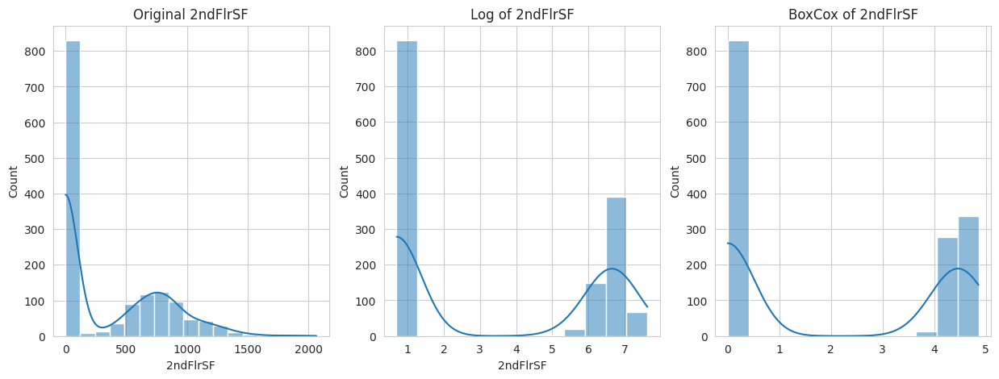

Skewness of '2ndFlrSF': Original 0.81, Log Transformed 0.30, BoxCox Transformed 0.28


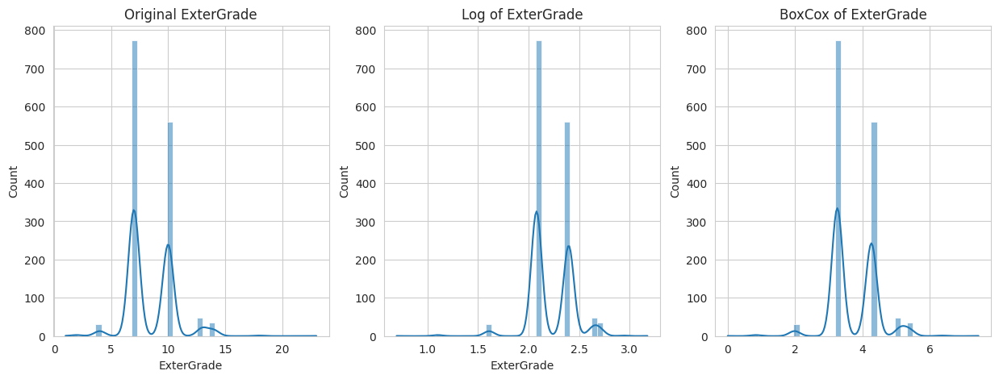

Skewness of 'ExterGrade': Original 0.81, Log Transformed -0.54, BoxCox Transformed 0.10


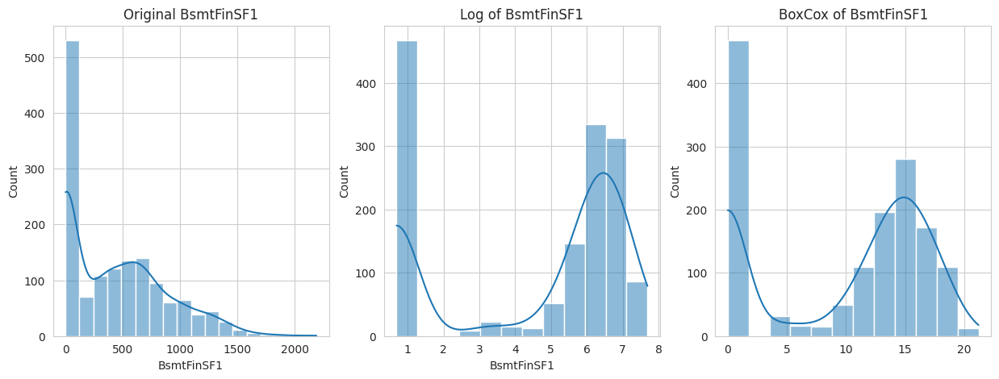

Skewness of 'BsmtFinSF1': Original 0.76, Log Transformed -0.59, BoxCox Transformed -0.42


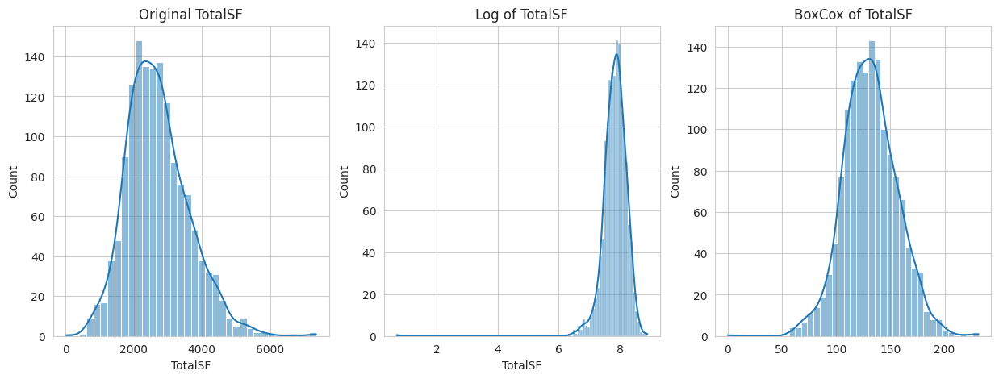

Skewness of 'TotalSF': Original 0.70, Log Transformed -4.33, BoxCox Transformed 0.08


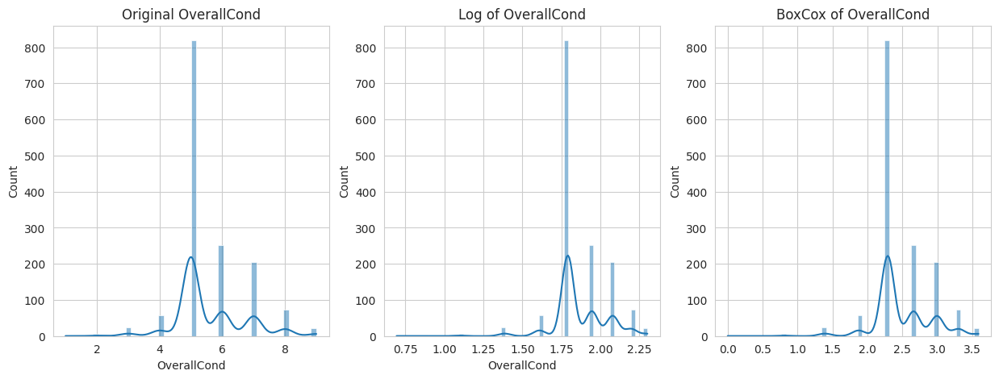

Skewness of 'OverallCond': Original 0.69, Log Transformed -0.26, BoxCox Transformed 0.07


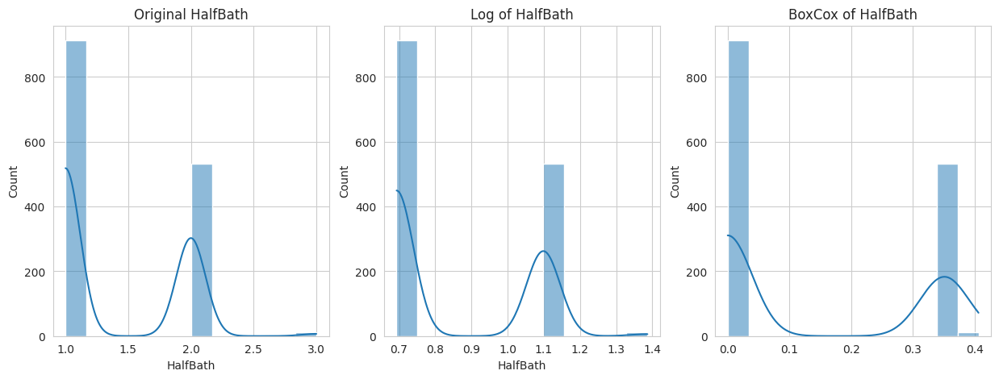

Skewness of 'HalfBath': Original 0.68, Log Transformed 0.59, BoxCox Transformed 0.52


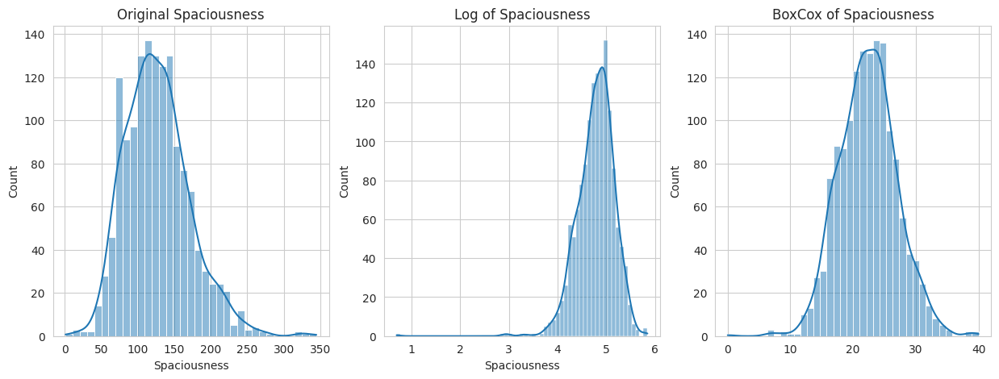

Skewness of 'Spaciousness': Original 0.67, Log Transformed -1.37, BoxCox Transformed 0.06


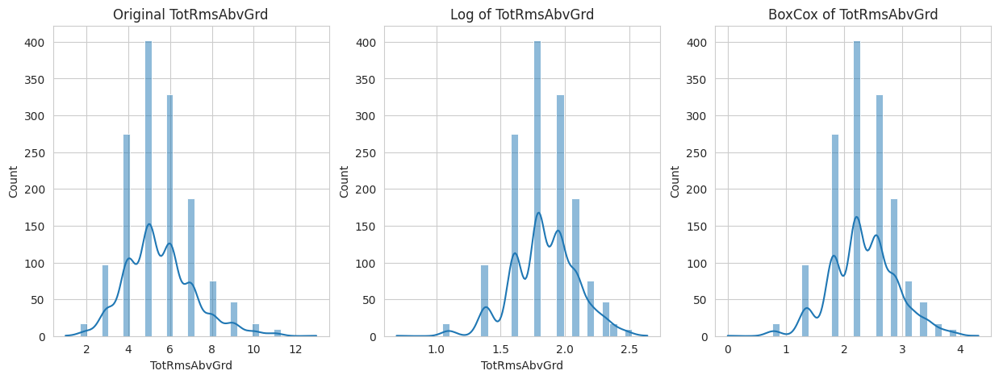

Skewness of 'TotRmsAbvGrd': Original 0.66, Log Transformed -0.20, BoxCox Transformed 0.02


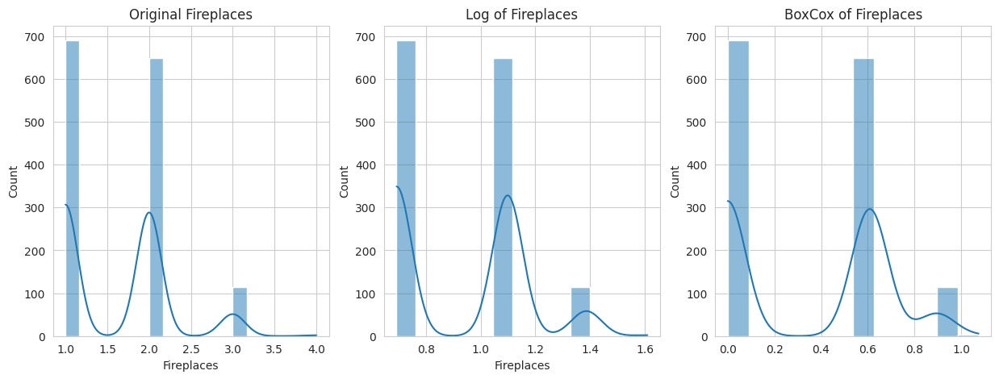

Skewness of 'Fireplaces': Original 0.63, Log Transformed 0.30, BoxCox Transformed 0.08


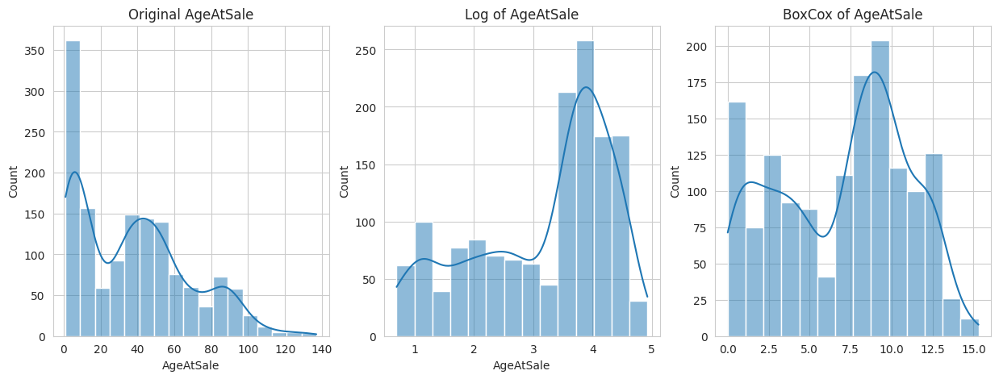

Skewness of 'AgeAtSale': Original 0.61, Log Transformed -0.69, BoxCox Transformed -0.23


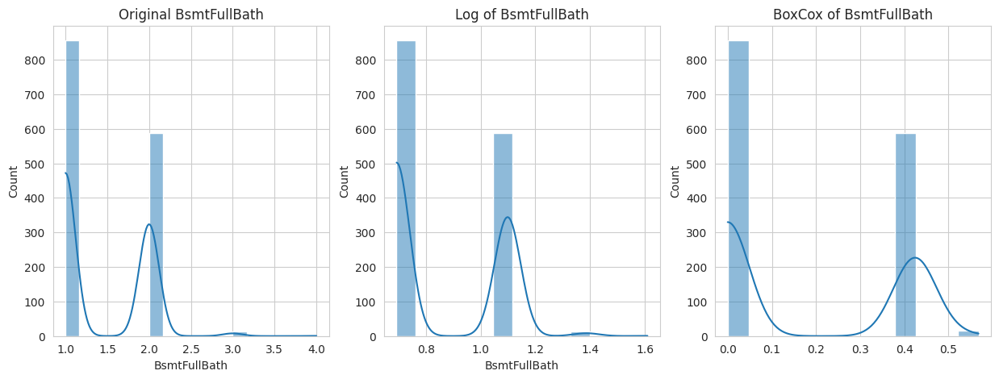

Skewness of 'BsmtFullBath': Original 0.59, Log Transformed 0.46, BoxCox Transformed 0.36


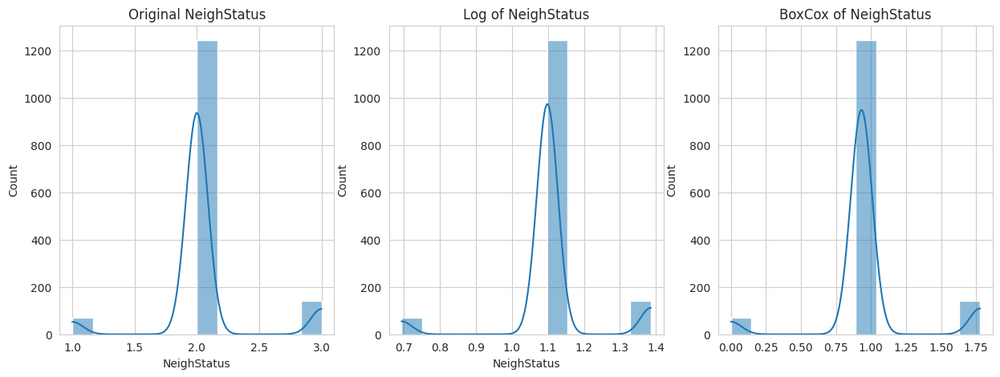

Skewness of 'NeighStatus': Original 0.52, Log Transformed -0.64, BoxCox Transformed 0.21


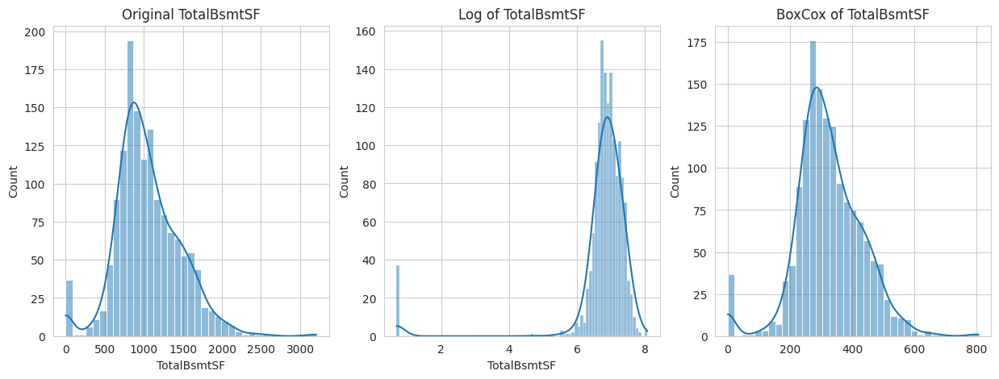

Skewness of 'TotalBsmtSF': Original 0.51, Log Transformed -5.00, BoxCox Transformed -0.03


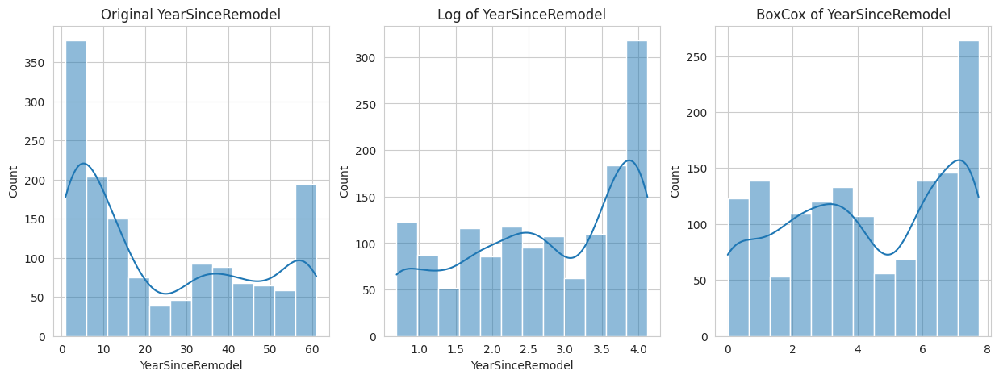

Skewness of 'YearSinceRemodel': Original 0.50, Log Transformed -0.38, BoxCox Transformed -0.16


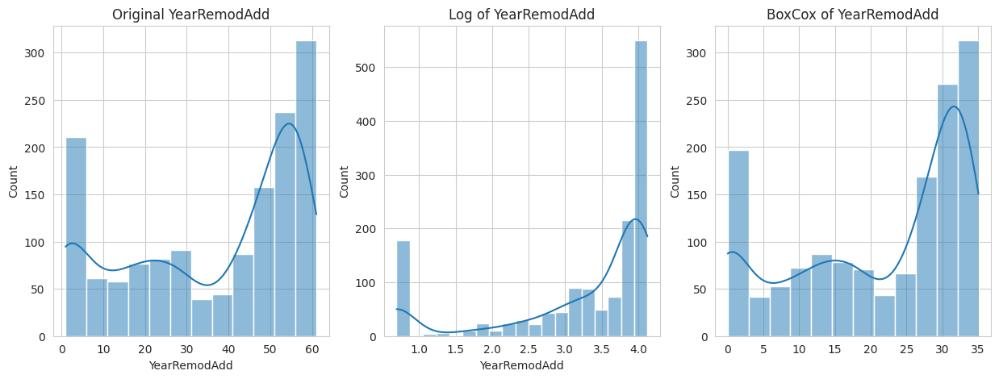

Skewness of 'YearRemodAdd': Original -0.50, Log Transformed -1.41, BoxCox Transformed -0.63


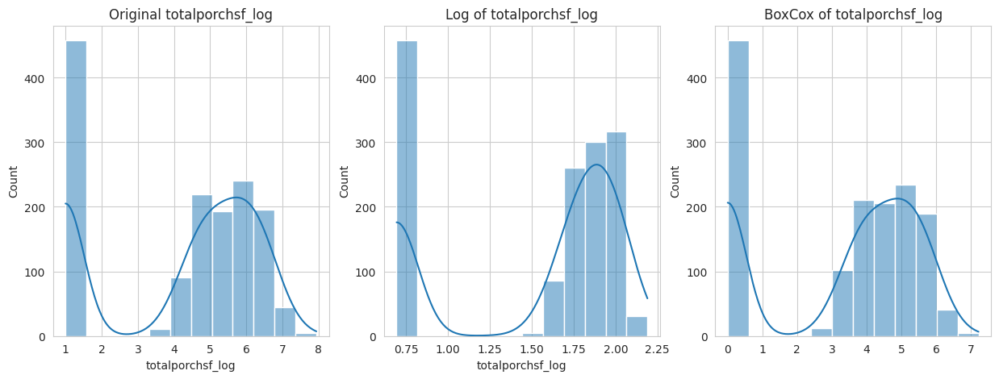

Skewness of 'totalporchsf_log': Original -0.51, Log Transformed -0.69, BoxCox Transformed -0.50


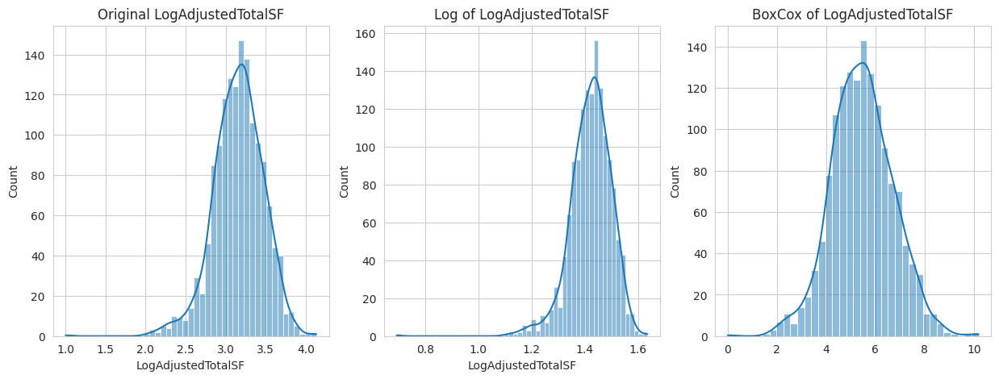

Skewness of 'LogAdjustedTotalSF': Original -0.54, Log Transformed -1.13, BoxCox Transformed 0.04


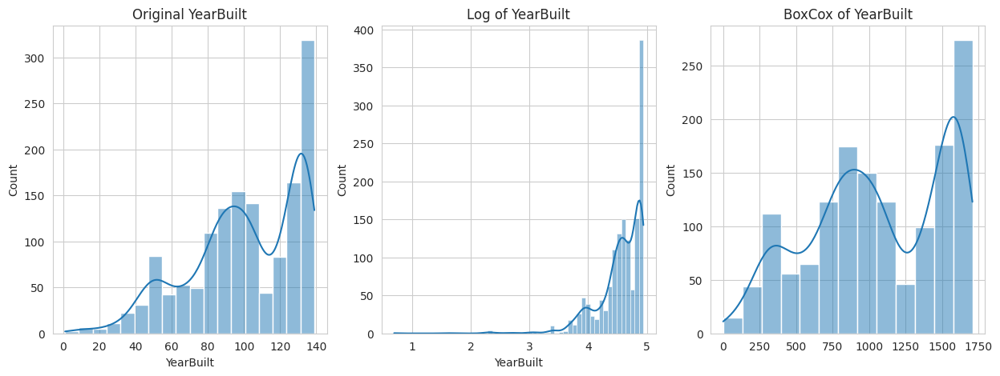

Skewness of 'YearBuilt': Original -0.61, Log Transformed -2.37, BoxCox Transformed -0.27


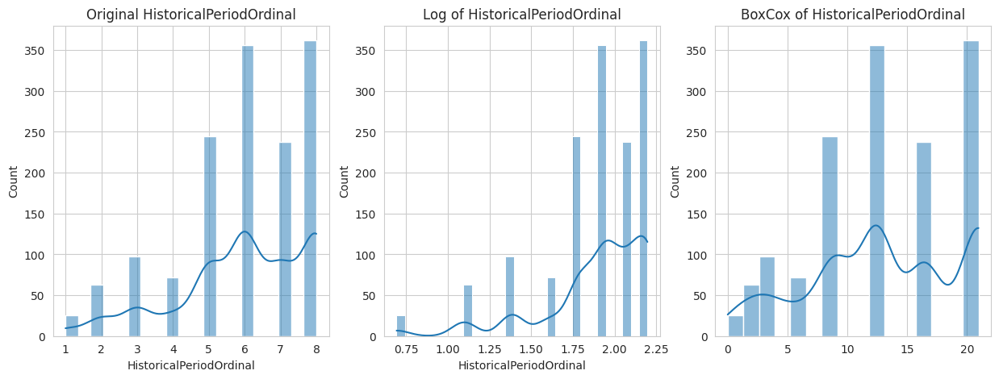

Skewness of 'HistoricalPeriodOrdinal': Original -0.77, Log Transformed -1.58, BoxCox Transformed -0.27


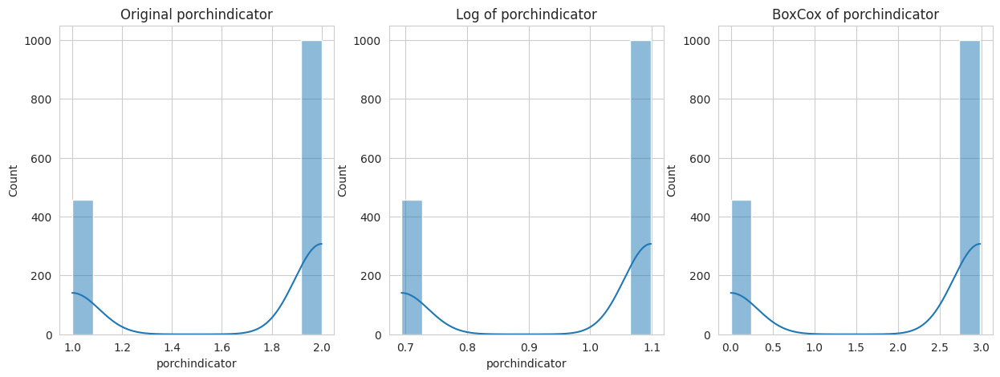

Skewness of 'porchindicator': Original -0.80, Log Transformed -0.80, BoxCox Transformed -0.80


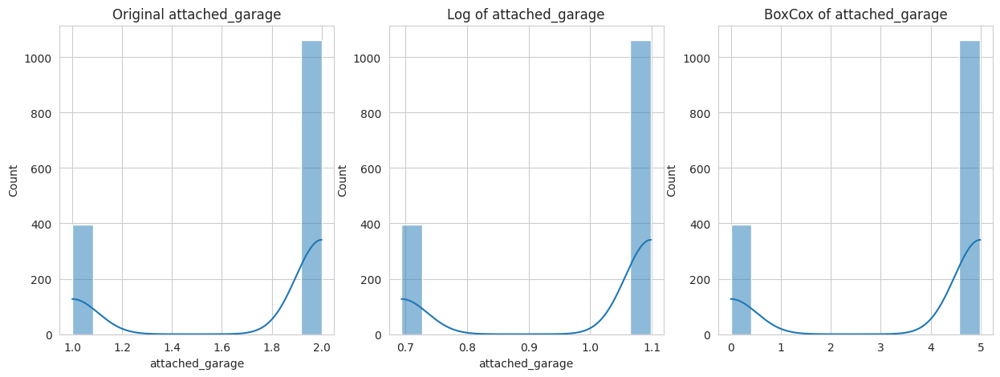

Skewness of 'attached_garage': Original -1.03, Log Transformed -1.03, BoxCox Transformed -1.03


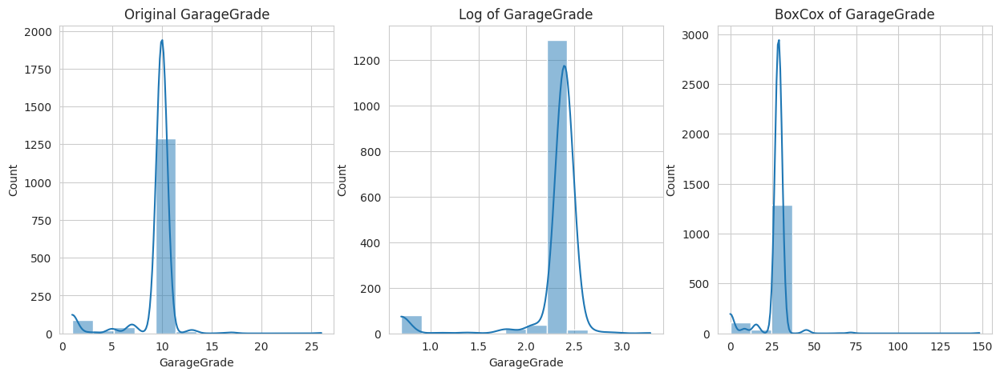

Skewness of 'GarageGrade': Original -2.09, Log Transformed -3.39, BoxCox Transformed 1.97


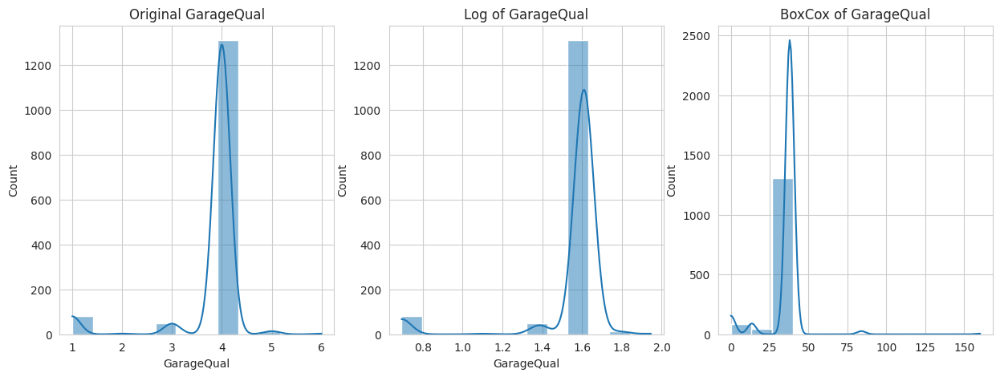

Skewness of 'GarageQual': Original -3.22, Log Transformed -3.55, BoxCox Transformed 1.18


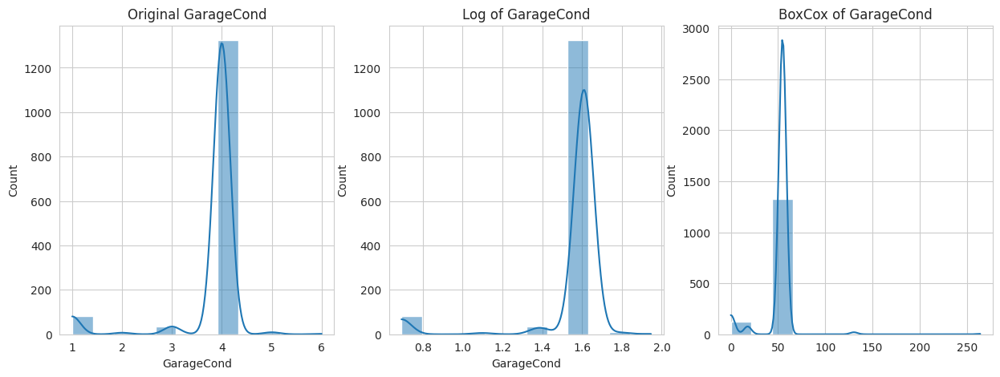

Skewness of 'GarageCond': Original -3.33, Log Transformed -3.57, BoxCox Transformed 1.43


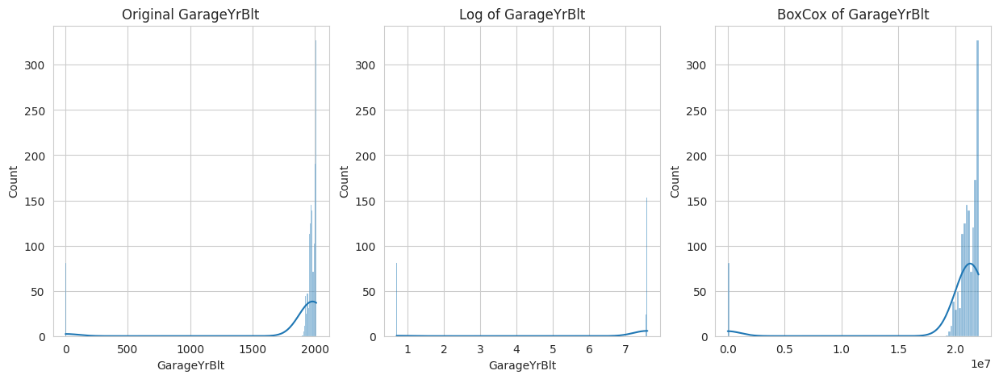

Skewness of 'GarageYrBlt': Original -3.86, Log Transformed -3.88, BoxCox Transformed -3.78


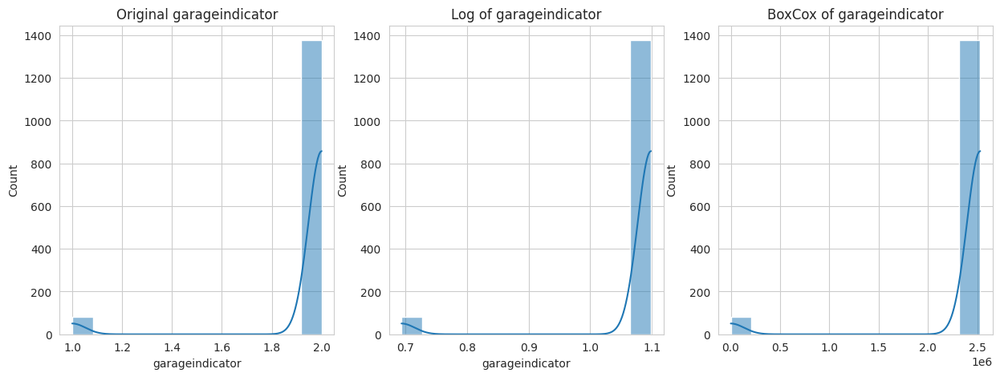

Skewness of 'garageindicator': Original -3.88, Log Transformed -3.88, BoxCox Transformed -3.88


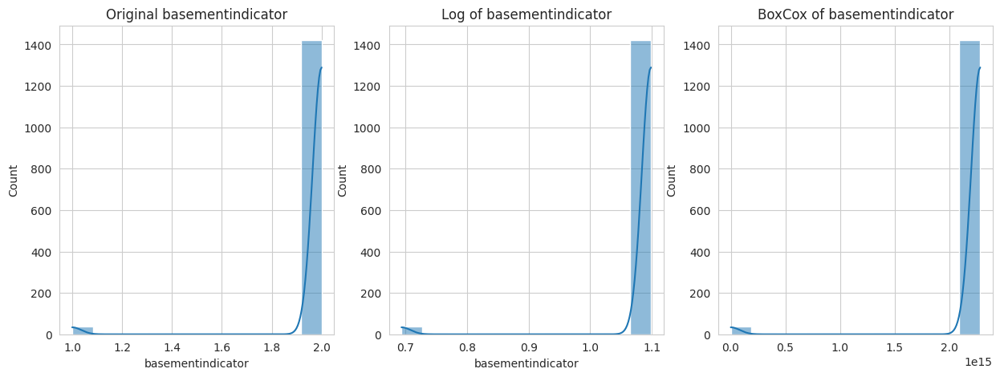

Skewness of 'basementindicator': Original -6.04, Log Transformed -6.04, BoxCox Transformed -6.04


In [ ]:
from scipy.stats import boxcox_normmax, boxcox
skewed_features = high_skew.index

for feature in skewed_features:
    # ensure non-negative values
    train_data[feature] += 1 - train_data[feature].min()

    # finding the lambda for box-cox transformation
    fitted_lambda = boxcox_normmax(train_data[feature].dropna(), method='mle')

    # apply the Box-Cox transformation
    boxcox_transformed = boxcox(train_data[feature], lmbda=fitted_lambda)
    boxcox_skewness = skew(boxcox_transformed)

    # visual comparison of distributions
    plt.figure(figsize=(15, 5))

    # plot original distribution
    plt.subplot(1, 3, 1)
    sns.histplot(train_data[feature], kde=True)
    plt.title(f'Original {feature}')

    # plot log-transformed distribution
    plt.subplot(1, 3, 2)
    sns.histplot(np.log1p(train_data[feature]), kde=True)
    plt.title(f'Log of {feature}')

    # plot box cox transformed distribution
    plt.subplot(1, 3, 3)
    sns.histplot(boxcox_transformed, kde=True)
    plt.title(f'BoxCox of {feature}')

    plt.show()

    # print out the skewness values
    print(f"Skewness of '{feature}': Original {skew(train_data[feature]):.2f}, Log Transformed {skew(np.log1p(train_data[feature])):.2f}, BoxCox Transformed {boxcox_skewness:.2f}")

In [ ]:
from scipy.stats import boxcox
# updating dataframe to include box-cox transformed features with improved skewness
# decided to select features with original skewness that is greater than 0.5 with box cox tranformation decressing skewness when applied
update_feature = ['MiscVal', 'LotArea', '3SsnPorch', 'LowQualFinSF','KitchenAbvGr','BsmtFinSF2','ScreenPorch',
                  'BsmtHalfBath','EnclosedPorch','MasVnrArea','OpenPorchSF','totalporchsf','WoodDeckSF','MSSubClass',
                  'ExterCond','GrLivArea','BsmtUnfSF','1stFlrSF','ExterQual','2ndFlrSF','ExterGrade',
                  'BsmtFinSF1','TotalSF','OverallCond','HalfBath','Spaciousness','TotRmsAbvGrd','Fireplaces','AgeAtSale',
                  'BsmtFullBath','NeighStatus','TotalBsmtSF','YearBuilt','HistoricalPeriodOrdinal','GarageGrade','GarageQual',
                  'GarageCond','GarageYrBlt']

lambdas = {}

for feature in update_feature:
    # Calculate the lambda using boxcox_normmax
    # Again, create a temporary variable to ensure the data is positive
    temp_data = train_data[feature] + (1 - train_data[feature].min())

    # Save the lambda value for the feature
    lambdas[feature] = boxcox_normmax(temp_data.dropna(), method='mle')

    # Now apply the Box-Cox transformation using the lambda
    train_data[f'{feature}_BoxCox'] = boxcox(temp_data, lmbda=lambdas[feature])

<ipython-input-67-271f7f557b44>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_data[f'{feature}_BoxCox'] = boxcox(temp_data, lmbda=lambdas[feature])
<ipython-input-67-271f7f557b44>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_data[f'{feature}_BoxCox'] = boxcox(temp_data, lmbda=lambdas[feature])
<ipython-input-67-271f7f557b44>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

# 4. Feature Selection

### 4.1 Anova for Categorical Values

#### 4.1.1 Anova for Categorical Values

In [ ]:
# getting categorical_features
filtered_cat_feat = [column for column in train_data.columns if train_data[column].dtype == 'object' ]

# apply one hot encoding to the filtered categorical column
# setting dummy_na to true to handel NaN values by treating them as a seperate category
encoded_categorical_feature = pd.get_dummies(train_data, columns = filtered_cat_feat, dummy_na = True)
encoded_categorical_feature

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtFinSF1,...,SaleType_Oth,SaleType_WD,SaleType_nan,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_nan
0,41,7151,7,5,132,54,197.0,3,3,707,...,False,True,False,False,False,False,False,True,False,False
1,1,8301,6,8,105,27,1.0,2,3,979,...,False,True,False,False,False,False,False,True,False,False
2,41,9951,7,5,130,53,163.0,3,3,487,...,False,True,False,False,False,False,False,True,False,False
3,51,8251,7,5,44,21,1.0,2,3,217,...,False,True,False,True,False,False,False,False,False,False
4,41,12961,8,5,129,51,351.0,3,3,656,...,False,True,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,41,6618,6,5,128,51,1.0,2,3,1,...,False,True,False,False,False,False,False,True,False,False
1456,1,11876,6,6,107,39,120.0,2,3,791,...,False,True,False,False,False,False,False,True,False,False
1457,51,7743,7,9,70,57,1.0,4,4,276,...,False,True,False,False,False,False,False,True,False,False
1458,1,8418,5,6,79,47,1.0,2,3,50,...,False,True,False,False,False,False,False,True,False,False


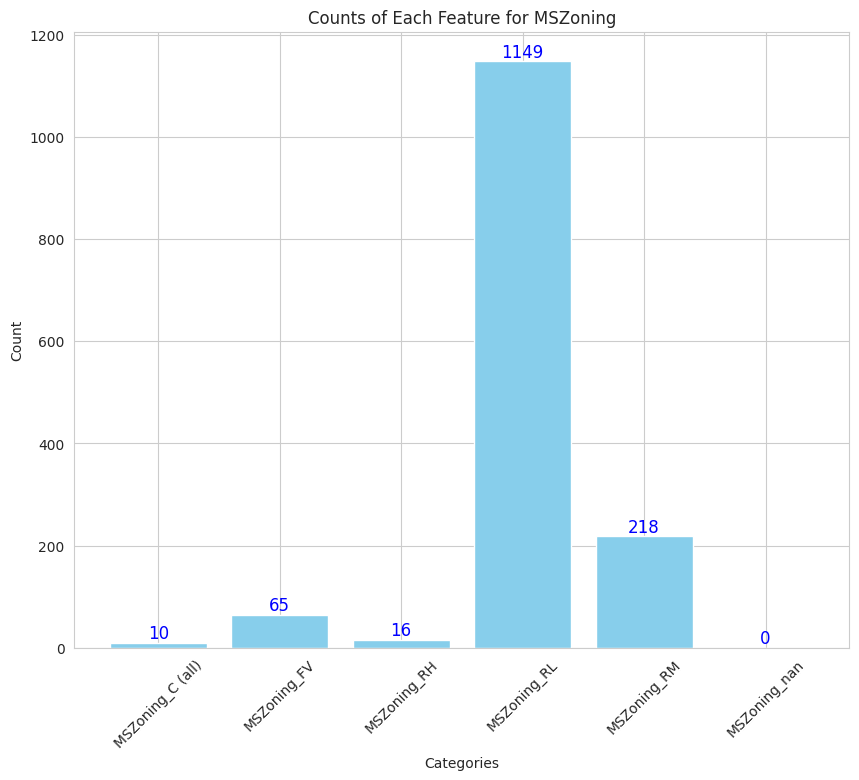

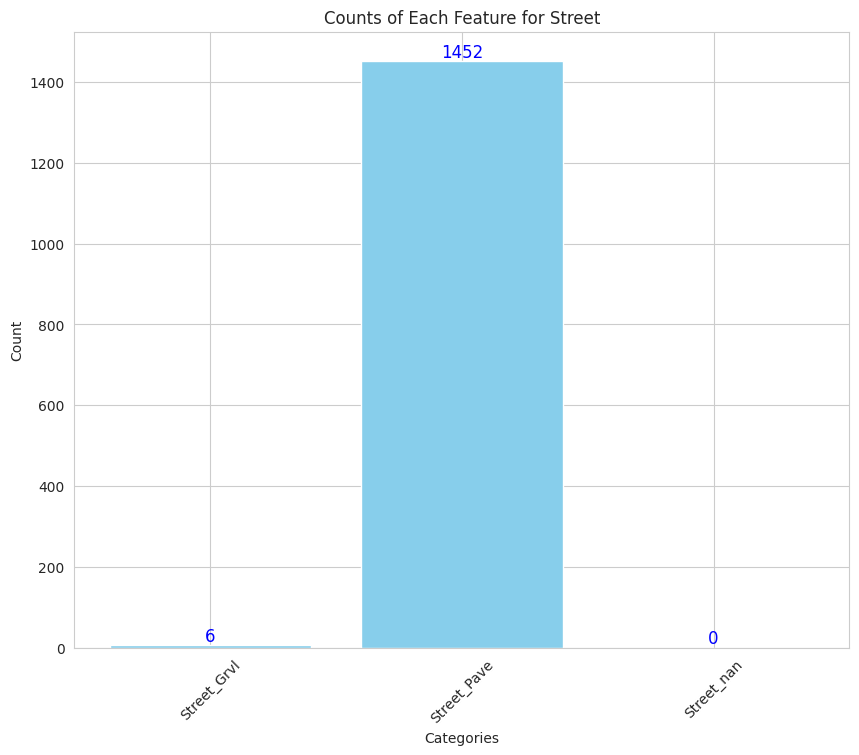

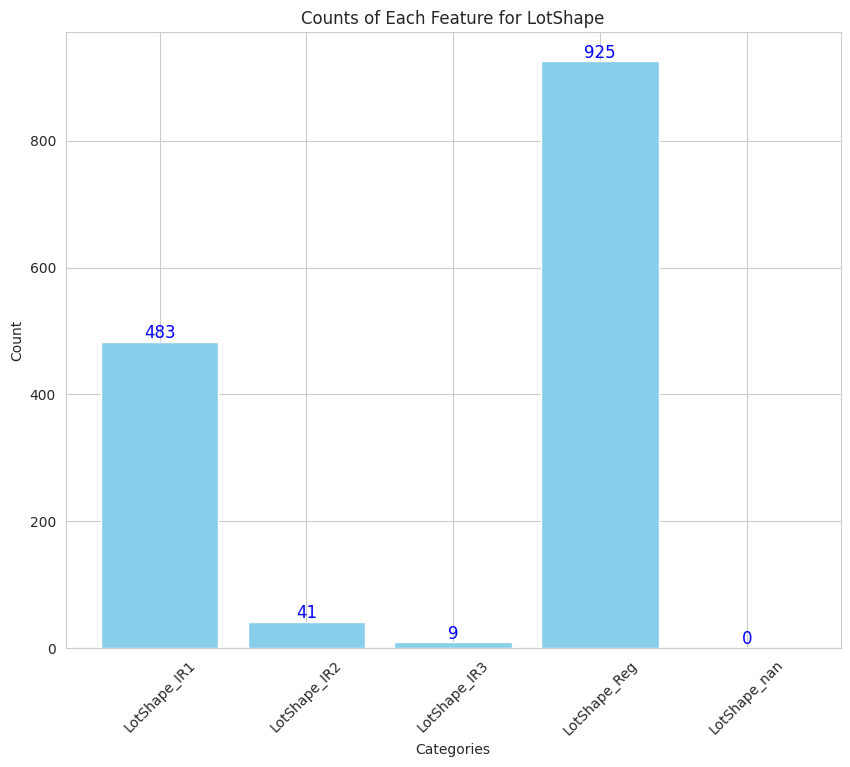

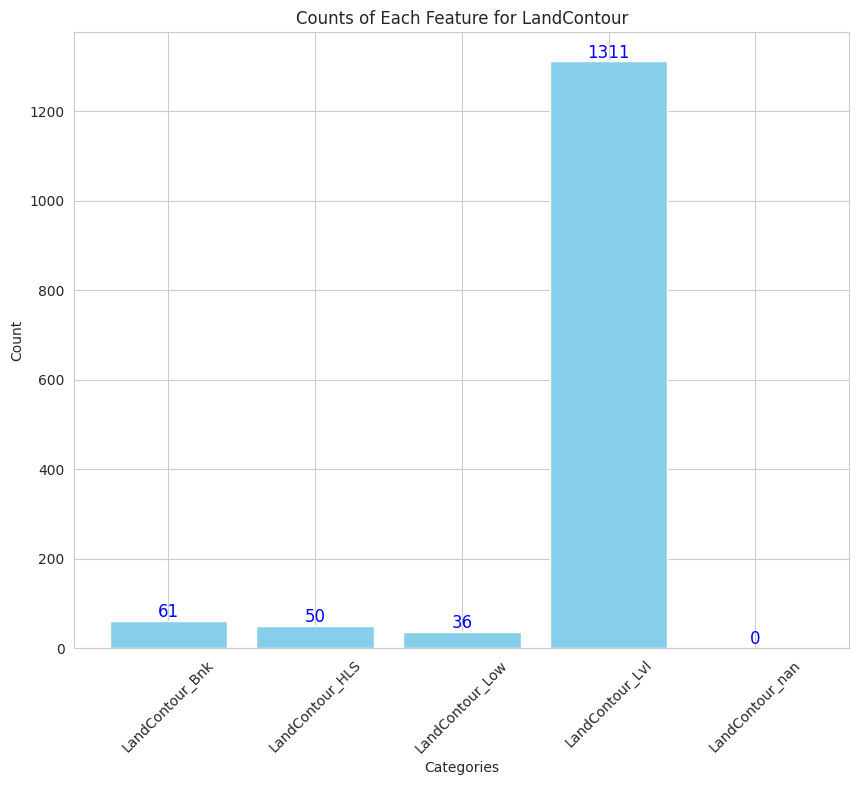

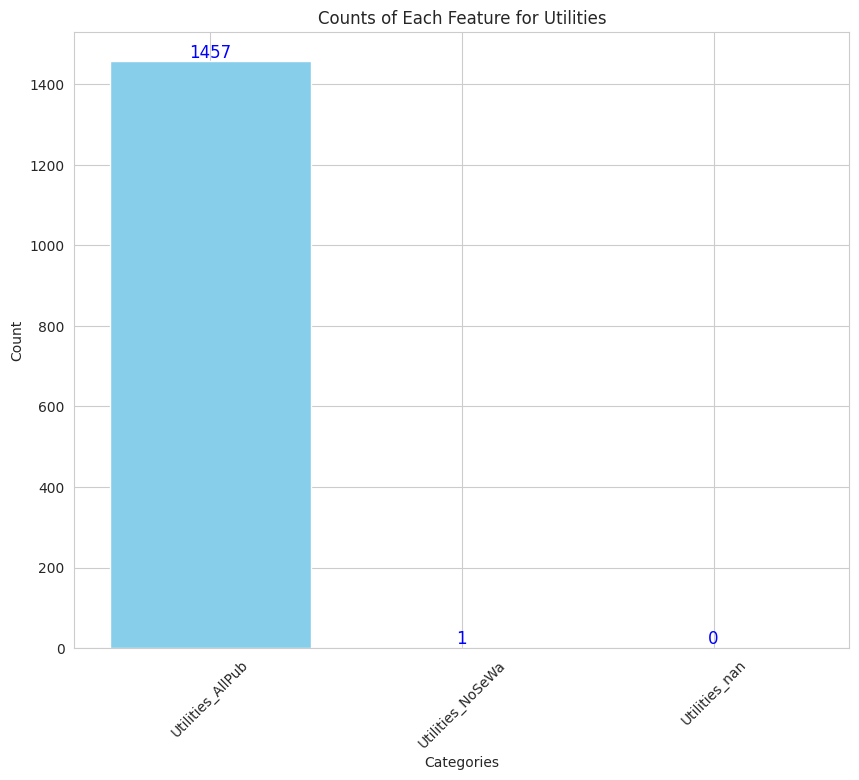

...

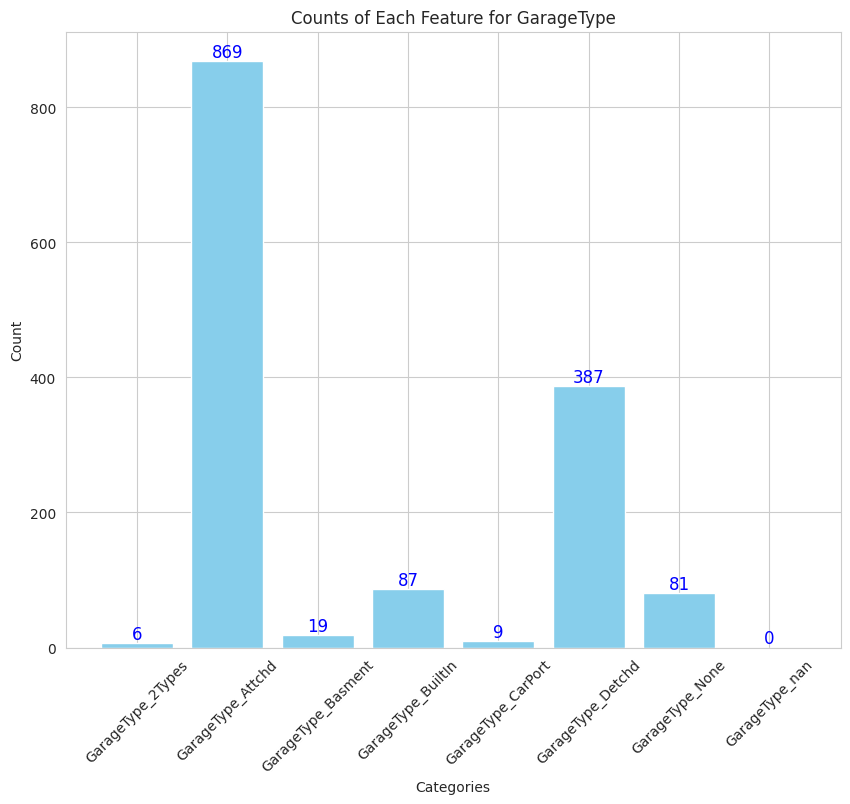

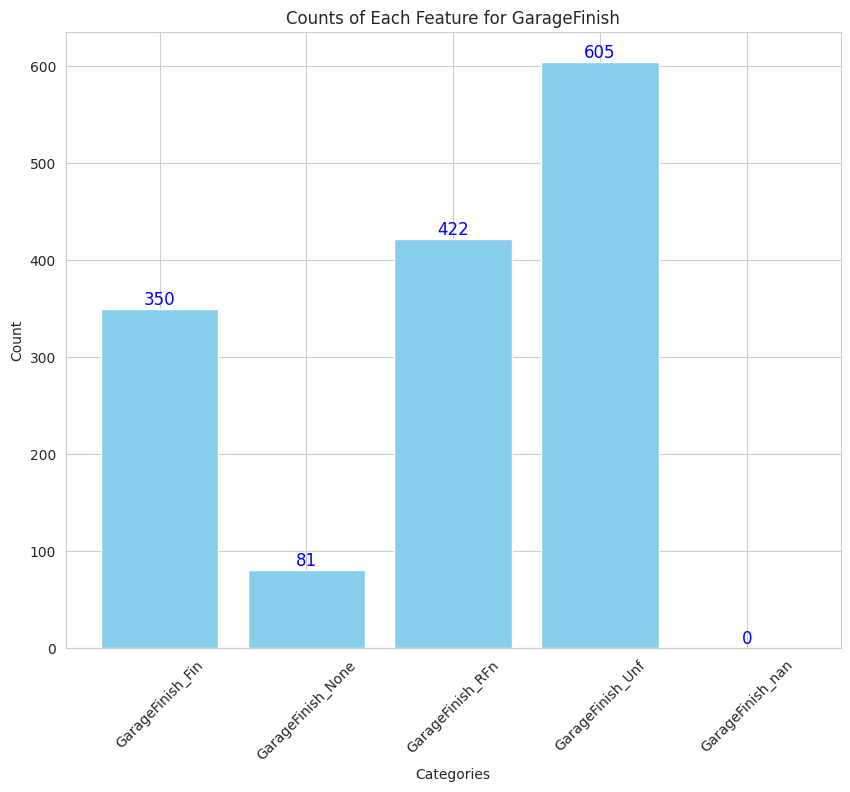

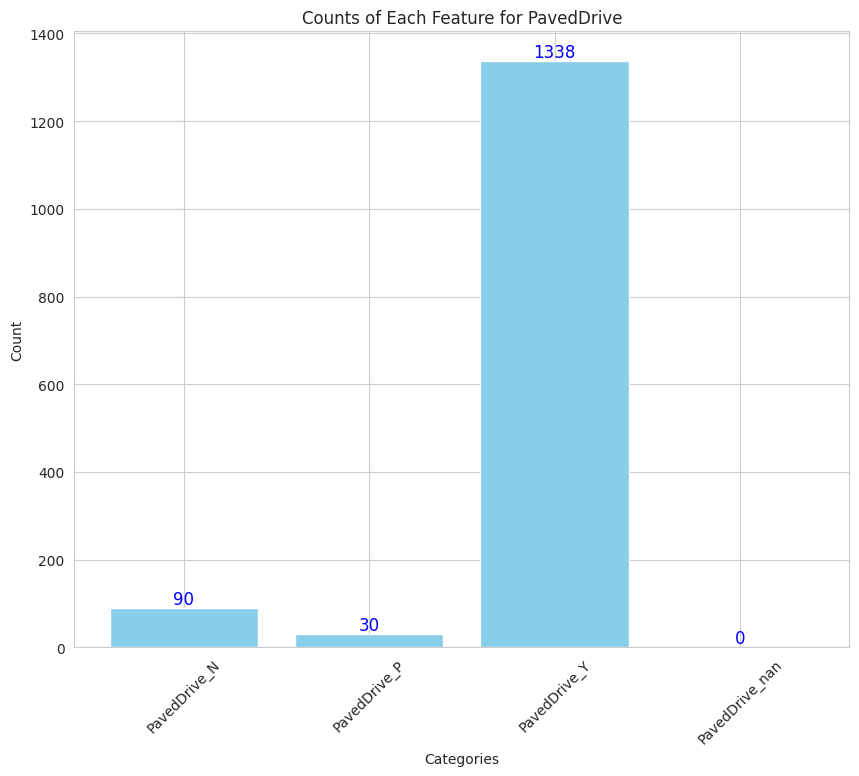

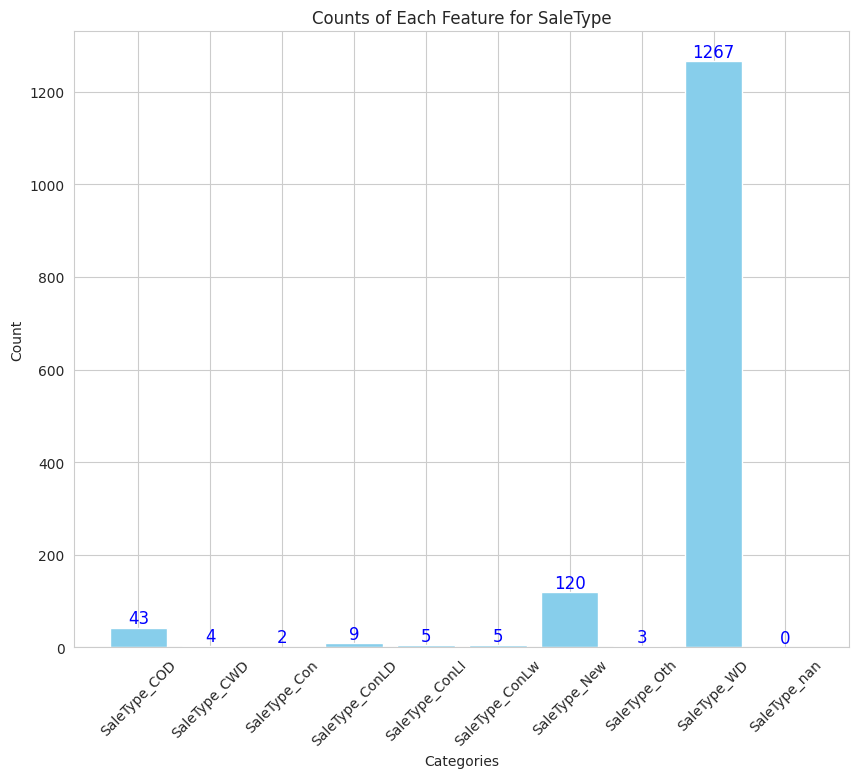

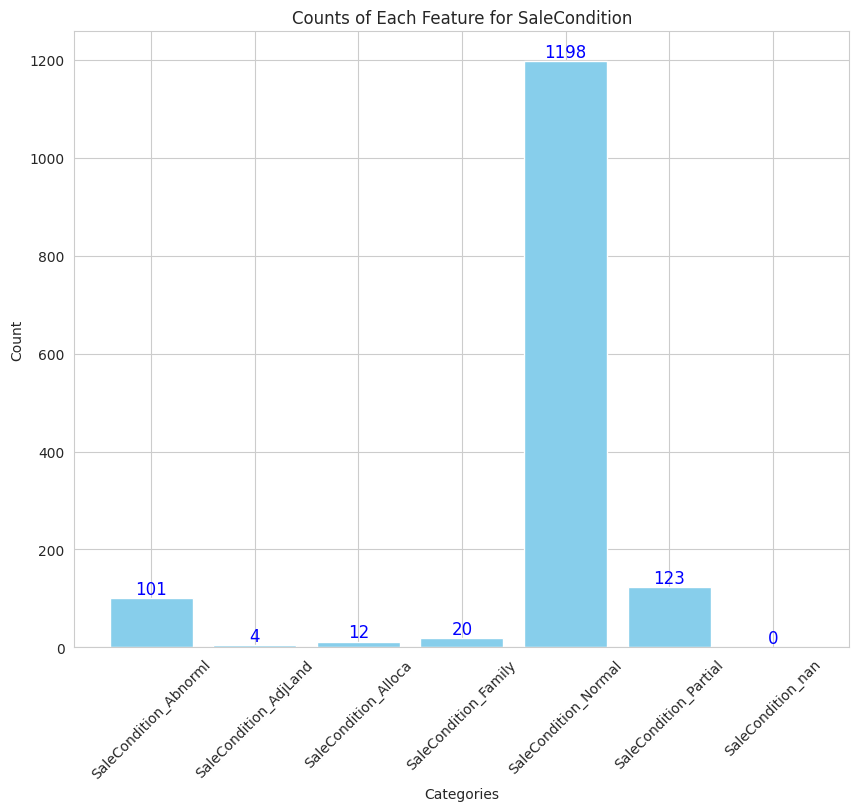

In [ ]:
# count of each feature using the one-hot encoding

for original_column in filtered_cat_feat:
  #get only one hot encoded values
  one_hot_columns = [col for col in encoded_categorical_feature.columns if col.startswith(original_column)]
  count_category = encoded_categorical_feature[one_hot_columns].sum()

  plt.figure(figsize=(10,8))
  bars = plt.bar(count_category.index, count_category.values, color = 'skyblue', edgecolor = 'white')
  plt.bar_label(bars, fontsize = 12, color = 'blue')
  plt.title(f'Counts of Each Feature for {original_column}')
  plt.ylabel('Count')
  plt.xlabel('Categories')
  plt.xticks(rotation = 45)
  plt.show()

In [ ]:
# using Anova to determine if there is a statstically significant difference
#between the mean of the adjusted sale price and categorical features
from statsmodels.formula.api import ols
import statsmodels.api as sm


for feature in filtered_cat_feat:
  # constructing an OLS model
  model = ols(f'LogAdjustedSalePrice ~ C({feature})', data = train_data).fit()
  # create an anova table
  anova_table = sm.stats.anova_lm(model, typ = 2)
  print(f'Anova table for {feature}:\n', anova_table, '\n')

Anova table for MSZoning:
                  sum_sq      df          F        PR(>F)
C(MSZoning)   40.837974     4.0  76.098742  1.234829e-58
Residual     194.936129  1453.0        NaN           NaN 

Anova table for Street:
                sum_sq      df         F   PR(>F)
C(Street)    0.821851     1.0  5.093014  0.02417
Residual   234.952252  1456.0       NaN      NaN 

Anova table for LotShape:
                  sum_sq      df          F        PR(>F)
C(LotShape)   20.889189     3.0  47.114957  4.669161e-29
Residual     214.884914  1454.0        NaN           NaN 

Anova table for LandContour:
                     sum_sq      df          F        PR(>F)
C(LandContour)    6.159650     3.0  13.001694  2.210372e-08
Residual        229.614453  1454.0        NaN           NaN 

Anova table for Utilities:
                   sum_sq      df         F    PR(>F)
C(Utilities)    0.049254     1.0  0.304227  0.581329
Residual      235.724849  1456.0       NaN       NaN 

Anova table for LotConfig

In [ ]:
summary_list = []

for feature in filtered_cat_feat:
    # constructing an OLS model
    model = ols(f'LogAdjustedSalePrice ~ C({feature})', data=train_data).fit()
    # create an anova table
    anova_table = sm.stats.anova_lm(model, typ=2)

    # getting the f and p value from the anova table
    f_value = anova_table["F"][0]
    p_value = anova_table["PR(>F)"][0]

    # adding to summary list
    summary_list.append({'Feature': feature, 'F-Value': f_value, 'P-Value': p_value})

summary_df = pd.DataFrame(summary_list)
summary_df


,Feature,F-Value,P-Value
0,MSZoning,76.098742,1.234829e-58
1,Street,5.093014,2.417014e-02
2,LotShape,47.114957,4.669161e-29
3,LandContour,13.001694,2.210372e-08
4,Utilities,0.304227,5.813294e-01
5,LotConfig,8.530655,8.380427e-07
6,LandSlope,1.085227,3.380982e-01
7,Neighborhood,78.399605,1.616372e-240
8,Condition1,7.926469,1.728983e-10
9,Condition2,2.799403,6.762196e-03


### 4.2 Correlation Relative to Target

In [ ]:
# Find most important features relative to target
numeric_columns = train_data.select_dtypes(include=[np.number])

pd.set_option('display.max_rows', None)
print("Find most important features relative to target")
corr = numeric_columns.corr()
corr.sort_values(["LogAdjustedSalePrice"], ascending = False, inplace = True)
print(corr.LogAdjustedSalePrice)

Find most important features relative to target
LogAdjustedSalePrice              1.000000
AdjustedSalePrice                 0.947544
SalePrice                         0.944722
TotalSF_BoxCox                    0.851542
TotalSF                           0.849607
LogAdjustedTotalSF                0.840805
OverallQual                       0.818350
GrLivArea_BoxCox                  0.736371
GrLivArea                         0.723535
GarageCars                        0.679843
ExterQual                         0.678366
TotalBath                         0.670644
ExterQual_BoxCox                  0.668312
KitchenQual                       0.665502
GarageArea                        0.654176
TotalBsmtSF                       0.644660
YrBltAndRemod                     0.640743
TotalBsmtSF_BoxCox                0.635397
1stFlrSF                          0.617600
1stFlrSF_BoxCox                   0.616655
YearBuilt_BoxCox                  0.609641
SimplKitchenQual                  0.605441
FullBa

In [ ]:
# creating a clean data frame that doesnt contain duplicate variables such as original variable and any transformed variable
train_data2 = train_data.copy()

# initialize a list to keep track of the original columns that have box cox transformation
columns_to_drop = []

# iterate over the columns and check if a Box-Cox version exists
for feature in train_data2.columns:
    if feature.endswith('_BoxCox'):
        original_feature = feature.replace('_BoxCox', '')
        # add the original column name to the list of columns to drop
        columns_to_drop.append(original_feature)

# drop the original columns from the new DataFrame
train_data2.drop(columns=columns_to_drop, inplace=True)
print(train_data2.shape)

(1458, 102)


In [ ]:
#features to drop:
# 1. SalePrice and AdjustedSalePrice - droping these features because we are using log adjusted sale price
# 2. HistoricalPeriod - created an ordinal variable that contains numerical values that present the historical period
# 3. Total_porch_sf - droping this because there is a log transformed variable called totalporchsf_log
# 4. Total_sqr_footage_BoxCox - droping this as theres a log tranforned variable called LogAdjustedTotalSF
# 5. totalporchsf_BoxCox - dont need box cox transformed because theres a log transformed variable
drop_columns = ['SalePrice', 'AdjustedSalePrice','HistoricalPeriod','Total_porch_sf',
                'totalporchsf_BoxCox']

train_data2.drop(columns=drop_columns, axis=1, inplace=True)
print(train_data2.shape)

(1458, 97)


In [ ]:
# selecting features that have 0.5 correlation and creating a clean data frame with those focused variables

numeric_columns2 = train_data2.select_dtypes(include=[np.number])

# rerunning correlation:
pd.set_option('display.max_rows', None)
print("Find most important features relative to target")
corr = numeric_columns2.corr()
corr.sort_values(["LogAdjustedSalePrice"], ascending = False, inplace = True)
print(corr.LogAdjustedSalePrice)

Find most important features relative to target
LogAdjustedSalePrice              1.000000
TotalSF_BoxCox                    0.851542
LogAdjustedTotalSF                0.840805
OverallQual                       0.818350
GrLivArea_BoxCox                  0.736371
GarageCars                        0.679843
TotalBath                         0.670644
ExterQual_BoxCox                  0.668312
KitchenQual                       0.665502
GarageArea                        0.654176
YrBltAndRemod                     0.640743
TotalBsmtSF_BoxCox                0.635397
1stFlrSF_BoxCox                   0.616655
YearBuilt_BoxCox                  0.609641
SimplKitchenQual                  0.605441
FullBath                          0.593635
ExterGrade_BoxCox                 0.590980
HistoricalPeriodOrdinal_BoxCox    0.590174
Spaciousness_BoxCox               0.582557
YearRemodAdd                      0.559445
NeighStatus_BoxCox                0.558985
TotRmsAbvGrd_BoxCox               0.541620
Firepl

In [ ]:
# selecting features that have 0.5 correlation and creating a clean data frame with those focused variables
corr = numeric_columns2.corr()

# find the columns where the correlation with LogAdjustedSalePrice is greater than 0.5
high_corr_features = corr.index[corr["LogAdjustedSalePrice"].abs() > 0.5].tolist()

# create a new DataFrame with only those columns
train_data3 = train_data2[high_corr_features]
train_data3.columns

Index(['OverallQual', 'YearRemodAdd', 'FullBath', 'KitchenQual', 'GarageCars',
       'GarageArea', 'LogAdjustedSalePrice', 'TotalBath', 'YearSinceRemodel',
       'YrBltAndRemod', 'fireplaceindicator', 'SimplKitchenQual',
       'LogAdjustedTotalSF', 'GrLivArea_BoxCox', '1stFlrSF_BoxCox',
       'ExterQual_BoxCox', 'ExterGrade_BoxCox', 'TotalSF_BoxCox',
       'Spaciousness_BoxCox', 'TotRmsAbvGrd_BoxCox', 'Fireplaces_BoxCox',
       'AgeAtSale_BoxCox', 'NeighStatus_BoxCox', 'TotalBsmtSF_BoxCox',
       'YearBuilt_BoxCox', 'HistoricalPeriodOrdinal_BoxCox'],
      dtype='object')

### 4.3 Feature Selection Finalized

<ipython-input-77-7b183e41c3db>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_visualized["LogAdjustedSalePrice"] = train_data["LogAdjustedSalePrice"]


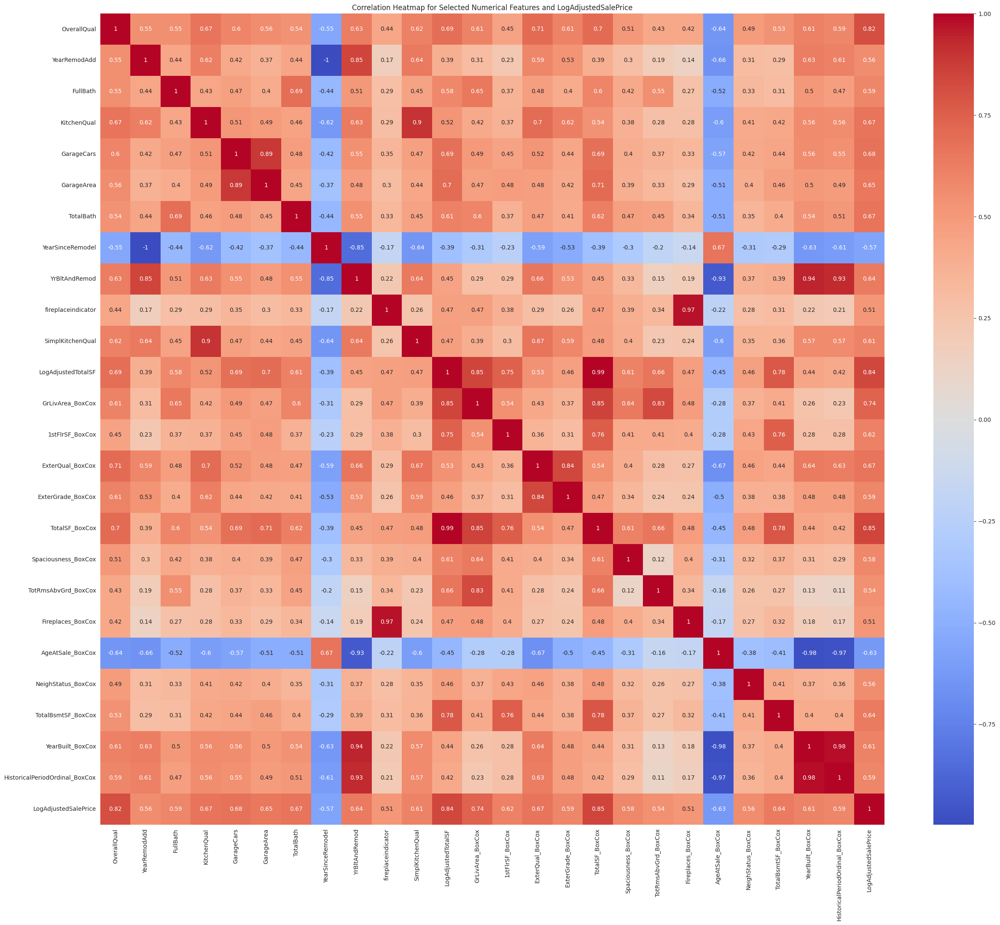

In [ ]:
train_data_visualized = train_data3
train_data_visualized["LogAdjustedSalePrice"] = train_data["LogAdjustedSalePrice"]

# Move the LogAdjustedSalePrice column to the last position
train_data_visualized = train_data_visualized[[col for col in train_data_visualized.columns if col != 'LogAdjustedSalePrice'] + ['LogAdjustedSalePrice']]
corr_matrix = train_data_visualized.corr()

# Create a heatmap to visualize correlations between features and outcome variable as well as features to other features
plt.figure(figsize=(30, 25))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap for Selected Numerical Features and LogAdjustedSalePrice')
plt.show()

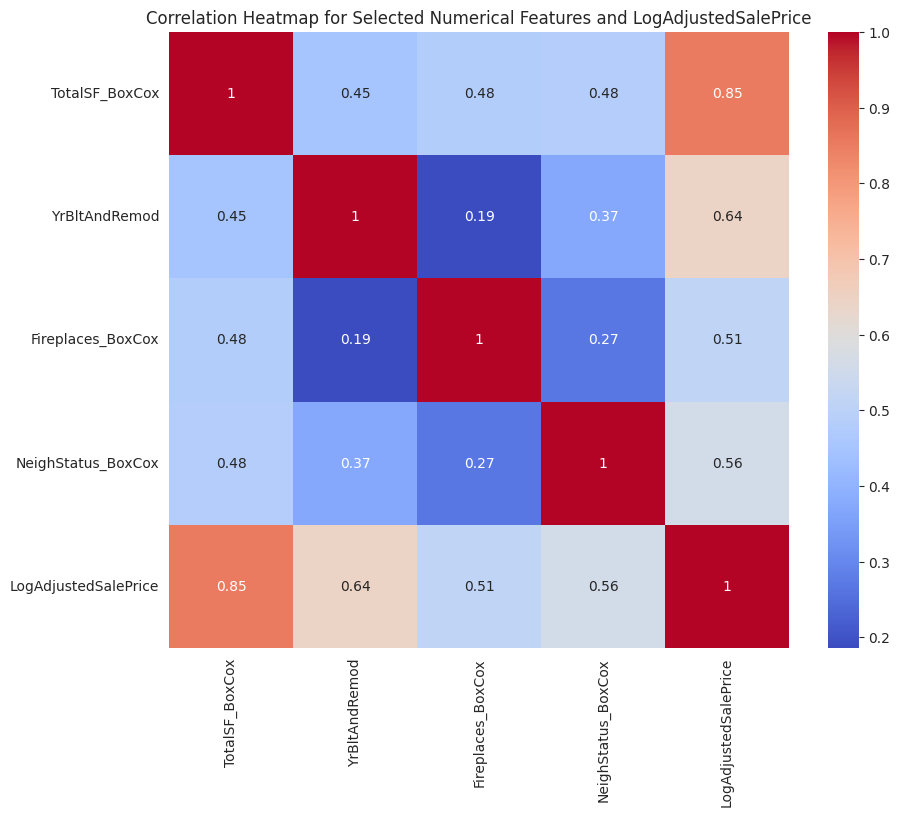

In [ ]:
# Want to maintain independence in final model so dropping features that are highly correlated with one another and keep the one that has the highest correaltion (>0.5) with logadjustedsaleprice
train_data4 = train_data3[["TotalSF_BoxCox","YrBltAndRemod","Fireplaces_BoxCox","NeighStatus_BoxCox"]]
train_data4_with_logadjustedsaleprice = train_data3[["TotalSF_BoxCox","YrBltAndRemod","Fireplaces_BoxCox","NeighStatus_BoxCox","LogAdjustedSalePrice"]]
corr_matrix_final = train_data4_with_logadjustedsaleprice.corr()

# Create a heatmap to visualize correlations between features and outcome variable a` well features to other features
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_final, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap for Selected Numerical Features and LogAdjustedSalePrice')
plt.show()

### 4.5 Scaling/ Normalizing

In [ ]:
# applying normalization based on train_data2 thats has one hot encoding
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

#re-name encoded_categorical_feature to train_data2 for consistency
train_data2 = encoded_categorical_feature

#applying standardization to train_data2
categorical_feats = encoded_categorical_feature.dtypes[encoded_categorical_feature.dtypes != "object"].index
train_data_standardized = scaler.fit_transform(train_data2[categorical_feats])
train_data_standardized = pd.DataFrame(train_data_standardized, columns=categorical_feats)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


In [ ]:
# applying standardization to train_data4
scaler = StandardScaler()
scaled_train_data4 = scaler.fit_transform(train_data4)
scaled_train_data4_df = pd.DataFrame(scaled_train_data4, columns=train_data4.columns)

# 5. Modeling

### 5.1 Inital Modeling

In [ ]:
# baseline model

# Calculate baseline model: median price
baseline_model = train_data4_with_logadjustedsaleprice['LogAdjustedSalePrice'].median()
print("Baseline model: ", baseline_model)

train_data4_with_logadjustedsaleprice_target = train_data4_with_logadjustedsaleprice["LogAdjustedSalePrice"]

# Compute the RMSE of the baseline model
rmse_baseline_train = np.sqrt(mean_squared_error(train_data4_with_logadjustedsaleprice_target, [baseline_model] * len(train_data4_with_logadjustedsaleprice_target)))
print("RMSE baseline: ", rmse_baseline_train)

Baseline model:  12.053658348808433
RMSE baseline:  0.40286495039549364


### 5.2 Linear Regression

In [ ]:
import tensorflow as tf

from sklearn.linear_model import LinearRegression

#  Split the dataset into training and validation
np.random.seed(0)
shuffled_train_data4 = np.random.permutation(range(len(train_data4_with_logadjustedsaleprice)))

train_dataset4 = train_data4_with_logadjustedsaleprice[:730]
valid_dataset4 = train_data4_with_logadjustedsaleprice[730:]

train_dataset4_features = train_dataset4.drop(columns=["LogAdjustedSalePrice"])
train_dataset4_target = train_dataset4["LogAdjustedSalePrice"]
valid_dataset4_features = valid_dataset4.drop(columns=["LogAdjustedSalePrice"])
valid_dataset4_target = valid_dataset4["LogAdjustedSalePrice"]

print("{} examples in training, {} examples in validation.".format(
    len(train_dataset4), len(valid_dataset4)))

# Train linear regression model
linear_regression_model = LinearRegression()
linear_regression_model.fit(train_dataset4_features, train_dataset4_target)

# Predict on training and validation sets
train_predictions_linear = linear_regression_model.predict(train_dataset4_features)
valid_predictions_linear = linear_regression_model.predict(valid_dataset4_features)

# Compute RMSE for linear regression model
rmse_train_linear = np.sqrt(mean_squared_error(train_dataset4_target, train_predictions_linear))
rmse_valid_linear = np.sqrt(mean_squared_error(valid_dataset4_target, valid_predictions_linear))

print("Linear Regression RMSE train:", rmse_train_linear)
print("Linear Regression RMSE valid:", rmse_valid_linear)


730 examples in training, 728 examples in validation.
Linear Regression RMSE train: 0.16753458327241277
Linear Regression RMSE valid: 0.1569598005656134


### 5.3 Random Forest

In [ ]:
tfdf.keras.get_all_models()

[tensorflow_decision_forests.keras.RandomForestModel,
 tensorflow_decision_forests.keras.GradientBoostedTreesModel,
 tensorflow_decision_forests.keras.CartModel,
 tensorflow_decision_forests.keras.DistributedGradientBoostedTreesModel]

In [ ]:
# Convert Pandas DataFrame to TensorFlow dataset
train_dataset4_tf = tfdf.keras.pd_dataframe_to_tf_dataset(train_dataset4, label= "LogAdjustedSalePrice", task=tfdf.keras.Task.REGRESSION)
valid_dataset4_tf = tfdf.keras.pd_dataframe_to_tf_dataset(valid_dataset4, label="LogAdjustedSalePrice", task=tfdf.keras.Task.REGRESSION)

# Create and compile the RandomForestModel for all features
rf_dataset4 = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.REGRESSION)
rf_dataset4.compile(metrics=["rmse"])

# Fit the model on the TensorFlow dataset
rf_dataset4.fit(train_dataset4_tf)

# Compute RMSE
train_predictions_dataset4 = rf_dataset4.predict(train_dataset4_tf)
valid_predictions_dataset4 = rf_dataset4.predict(valid_dataset4_tf)

rmse_train_dataset4 = np.sqrt(mean_squared_error(train_dataset4_target, train_predictions_dataset4))
rmse_valid_dataset4 = np.sqrt(mean_squared_error(valid_dataset4_target, valid_predictions_dataset4))

print("RF RMSE train:", rmse_train_dataset4)
print("RF RMSE valid:", rmse_valid_dataset4)

Use /tmp/tmpfazqmwku as temporary training directory
Reading training dataset...
Training dataset read in 0:00:09.690377. Found 730 examples.
Training model...
Model trained in 0:00:00.637596
Compiling model...
Model compiled.
1/1 [==============================] - 0s 106ms/step
RF RMSE train: 0.1251592616402514
RF RMSE valid: 0.16668242567470118


### 5.4 Decision Trees

In [ ]:
train_data2 = train_data2.drop(['HistoricalPeriodOrdinal', 'HistoricalPeriod'], axis =1)

In [ ]:
# training Decision Tree with all features
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error

# separate features and target
X = train_data2.drop(columns=["LogAdjustedSalePrice"])
Y = train_data2["LogAdjustedSalePrice"]

# split the dataset into training and validation
X_train, X_validate, Y_train, Y_validate = train_test_split(X,Y, test_size = 0.2, random_state = 0)

# initalize the decision tree regression model
decision_tree_model = DecisionTreeRegressor(random_state=0, max_depth = 5)

# train model
decision_tree_model.fit(X_train, Y_train)

# predict on training set
train_predict_price = decision_tree_model.predict(X_train)

# calculate mse and rmse for training set
decision_tree_train_mse = mean_squared_error(Y_train, train_predict_price)
print('Mean Squared Error on Training Set:', decision_tree_train_mse)

decision_tree_train_rmse = np.sqrt(decision_tree_train_mse)
print('RMSE on Training Set:', decision_tree_train_rmse)

# predict validation set
predict_price = decision_tree_model.predict(X_validate)
decision_tree_validation_mse = mean_squared_error(Y_validate, predict_price)
print('Mean Squared Error on Validation Set:', decision_tree_validation_mse)

decision_tree_validation_rmse = np.sqrt(decision_tree_validation_mse)
print('RMSE on Validation Set:', decision_tree_validation_rmse)



Mean Squared Error on Training Set: 0.0003869221517750922
RMSE on Training Set: 0.019670336849558327
Mean Squared Error on Validation Set: 0.0005489938025396087
RMSE on Validation Set: 0.023430616776764727


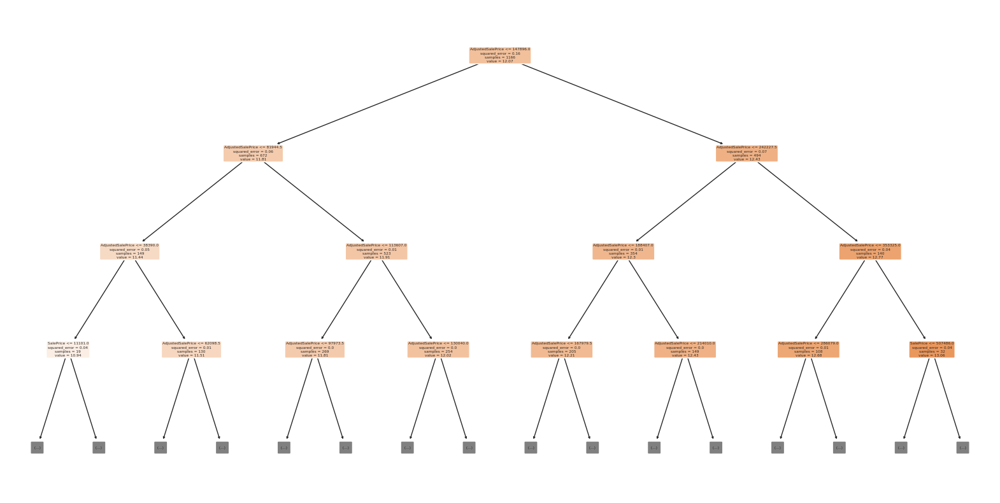

In [ ]:
# visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(decision_tree_model,
          filled=True,
          feature_names=X_train.columns,
          rounded=True,
          proportion=False,
          precision=2,
          max_depth=3)
plt.show()

In [ ]:
# training Decision Tree based on selected feature using train_data4

# define target variable
focused_y = train_data2["LogAdjustedSalePrice"]

# selecting the focused columns from the features DataFrame
focused_x = train_data4

# split the dataset into training and validation
X_train_1, X_validate_1, Y_train_1, Y_validate_1 = train_test_split(focused_x, focused_y, test_size=0.2, random_state=0)

# initialize the decision tree regression model
decision_tree_model_1 = DecisionTreeRegressor(random_state=0,
                                              max_depth = 6,
                                              min_samples_split=2,
                                              min_samples_leaf=2)


# train the model
decision_tree_model_1.fit(X_train_1, Y_train_1)

# predict on training data
train_predict_price = decision_tree_model_1.predict(X_train_1)
mse_train_1 = mean_squared_error(Y_train_1, train_predict_price)
print('Mean Squared Error on Training Set:', mse_train_1)

rmse_train_1 = np.sqrt(mse_train_1)
print('RMSE on Training Set:', rmse_train_1)


# predict on validation data
predict_price = decision_tree_model_1.predict(X_validate_1)
mse_1 = mean_squared_error(Y_validate_1, predict_price)
print('Mean Squared Error on Validation Set:', mse_1)

rmse_1 = np.sqrt(mse_1)

print('RMSE on Validation Set:', rmse_1)




Mean Squared Error on Training Set: 0.0221278537439896
RMSE on Training Set: 0.1487543402526111
Mean Squared Error on Validation Set: 0.02831051312276577
RMSE on Validation Set: 0.16825728252520236


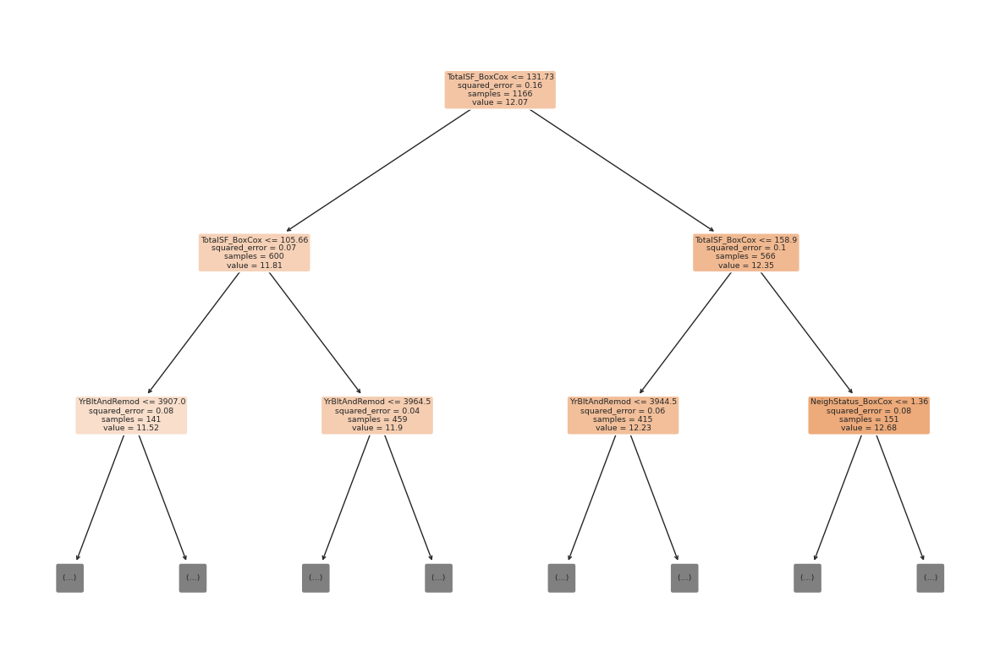

In [ ]:
plt.figure(figsize=(15,10))
plot_tree(decision_tree_model_1,
          filled=True,
          feature_names=focused_x.columns,
          rounded=True,
          proportion=False,
          precision=2,
          max_depth=2)
plt.show()


### 5.5 Neural Network

In [ ]:
train_data_standardized = train_data_standardized.drop(['HistoricalPeriod'], axis =1)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

# separate features and target from the standardized data
X = train_data_standardized.drop(columns=["LogAdjustedSalePrice"])
Y = train_data_standardized["LogAdjustedSalePrice"]

# split the standardized dataset into training and validation
X_train, X_validate, Y_train, Y_validate = train_test_split(X, Y, test_size=0.2, random_state=0)

# setting up neural network architecture
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='linear'))

# setting learning rate
learning_rate = 0.001
adam_optimizer = Adam(learning_rate=learning_rate)

# complie model
model.compile(optimizer=adam_optimizer, loss='mean_squared_error', metrics=['mae'])

# train the model
history = model.fit(X_train, Y_train, validation_data=(X_validate, Y_validate),
                    epochs=100, batch_size=32)

# predict on training set
train_predicted_prices = model.predict(X_train)
mse_train = mean_squared_error(Y_train, train_predicted_prices.flatten())
rmse_train = np.sqrt(mse_train)

# performance metrics for training set
print('Mean Squared Error on Training Set:', mse_train)
print('Root Mean Squared Error on Training Set:', rmse_train)

# prediction on validation set
predicted_prices = model.predict(X_validate)

# calculate the MSE and RMSE
mse = mean_squared_error(Y_validate, predicted_prices.flatten())
rmse = np.sqrt(mse)

# print performance metrics for validation set
print('Mean Squared Error on Validation Set:', mse)
print('Root Mean Squared Error on Validation Set:', rmse)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 2.1691 - mae: 1.0881 - val_loss: 0.3592 - val_mae: 0.4499
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1586 - mae: 0.7865 - val_loss: 0.4032 - val_mae: 0.4838
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0339 - mae: 0.7481 - val_loss: 0.3601 - val_mae: 0.4606
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7757 - mae: 0.6525 - val_loss: 0.3564 - val_mae: 0.4531
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6455 - mae: 0.5942 - val_loss: 0.3812 - val_mae: 0.4619
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5816 - mae: 0.5565 - val_loss: 0.3317 - val_mae: 0.4368
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5496 - mae: 0.5293 - val_loss: 0.2797 - val_mae: 0.3951
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5377 - mae: 0.4957 - val_loss: 0.2805 - val_mae: 0.3945
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5365 - mae: 0.

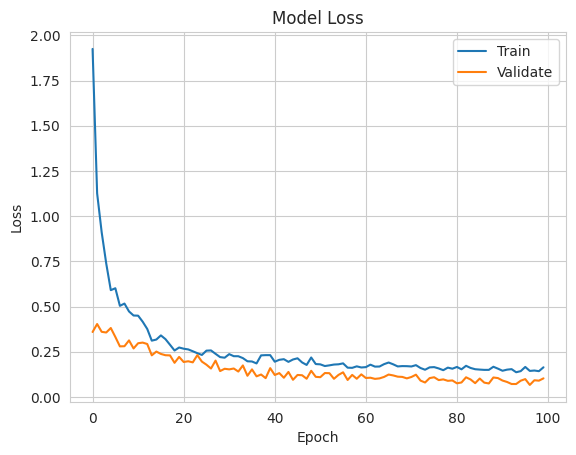

In [ ]:
# plotting training and validation metrics

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validate'], loc='upper right')
plt.show()

In [ ]:
pip install keras


Training with learning rate: 0.1, activation function: relu, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


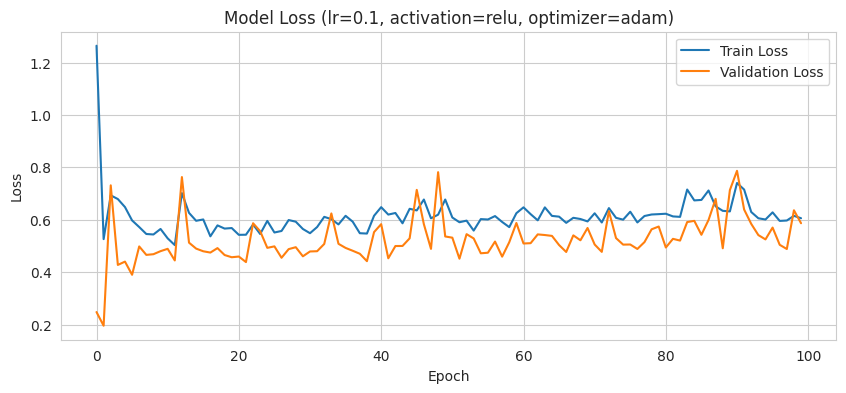


Training with learning rate: 0.1, activation function: relu, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


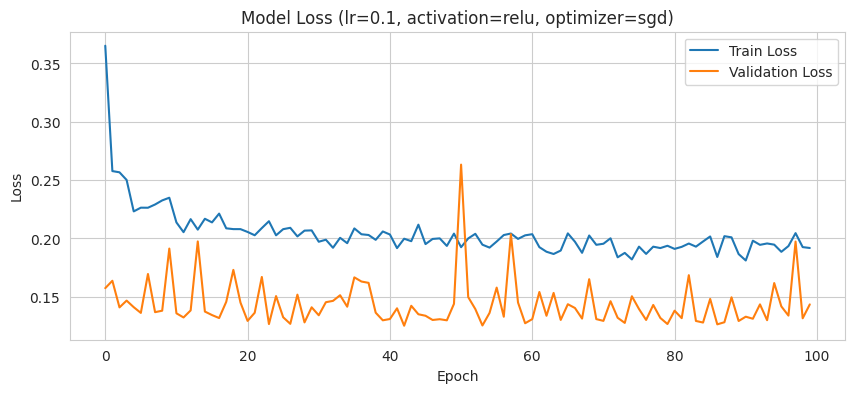


Training with learning rate: 0.1, activation function: tanh, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


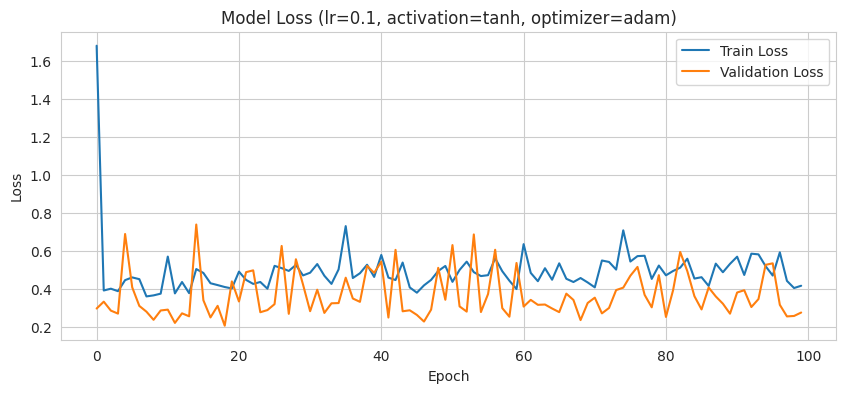


Training with learning rate: 0.1, activation function: tanh, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


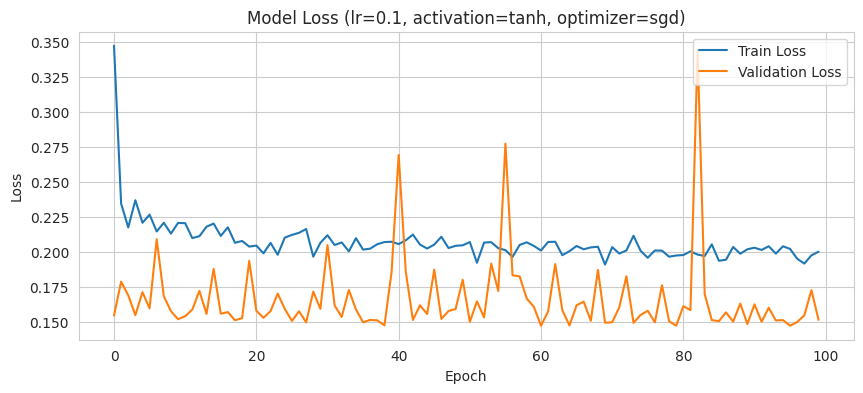


Training with learning rate: 0.01, activation function: relu, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


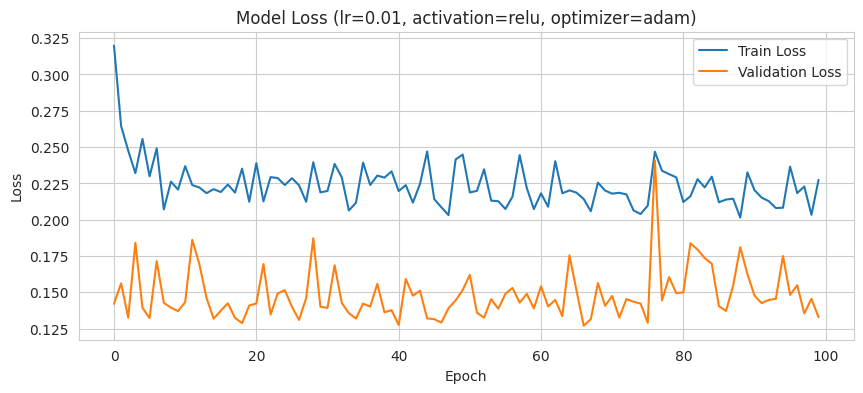


Training with learning rate: 0.01, activation function: relu, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


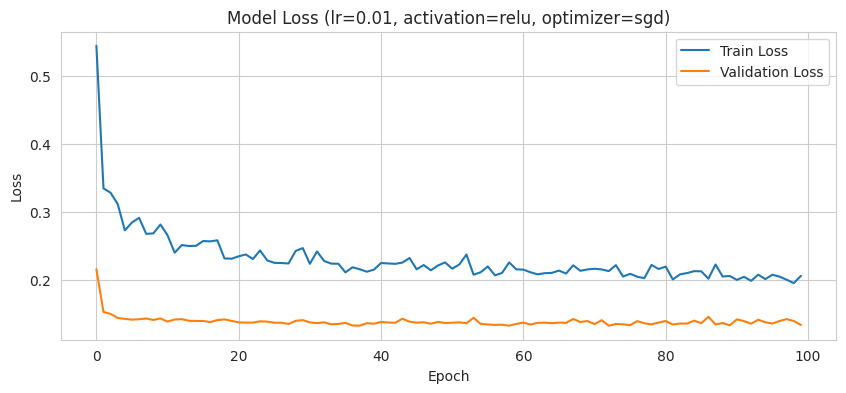


Training with learning rate: 0.01, activation function: tanh, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  


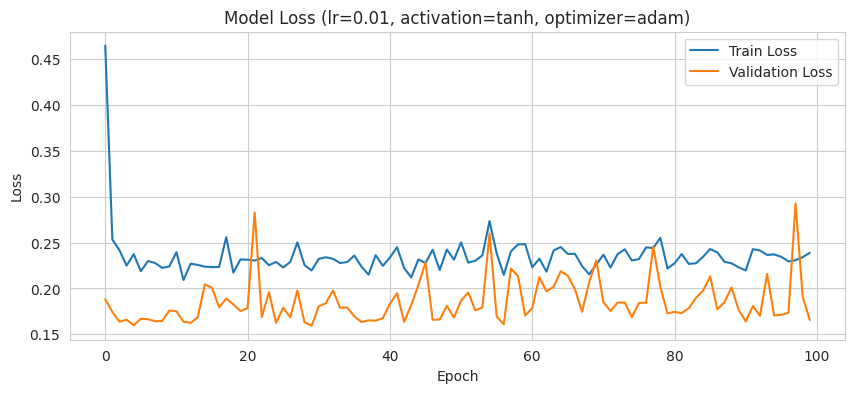


Training with learning rate: 0.01, activation function: tanh, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


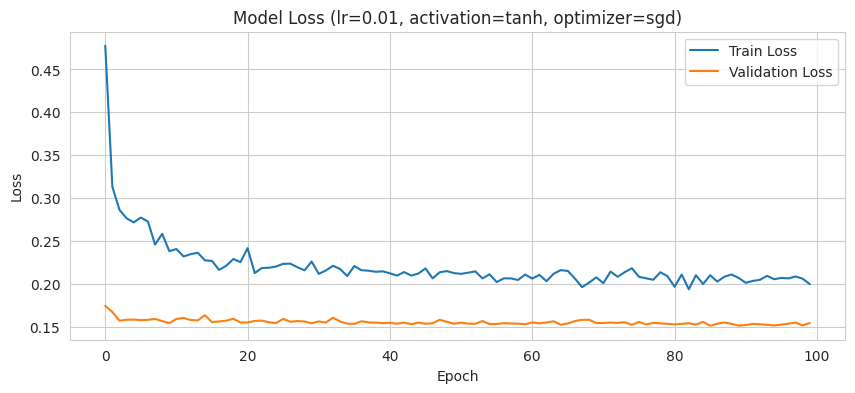


Training with learning rate: 0.001, activation function: relu, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


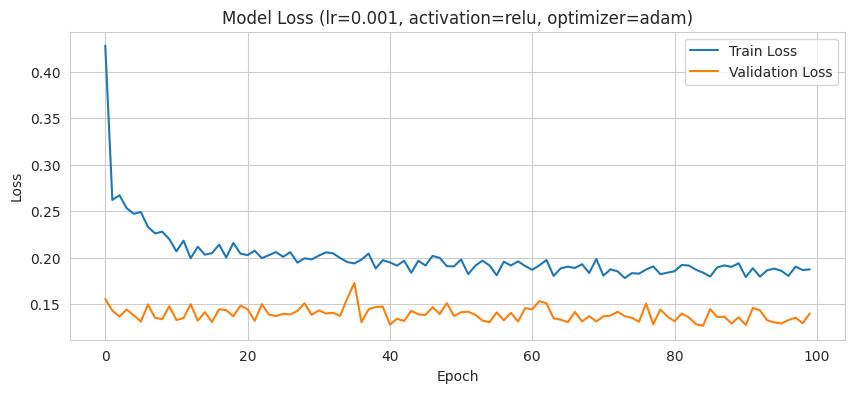


Training with learning rate: 0.001, activation function: relu, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


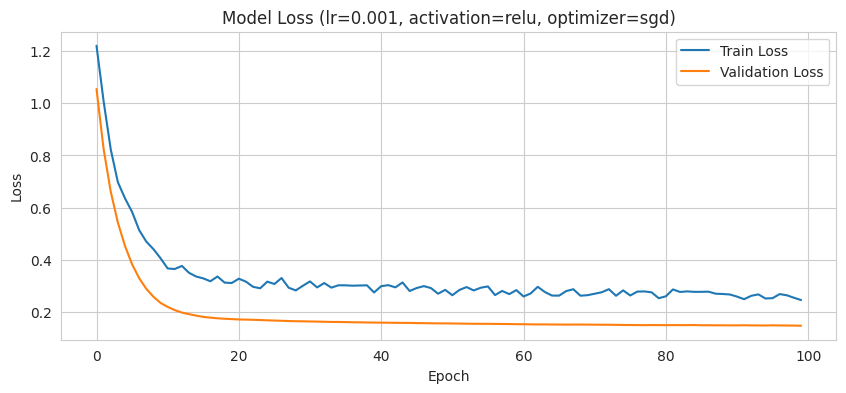


Training with learning rate: 0.001, activation function: tanh, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


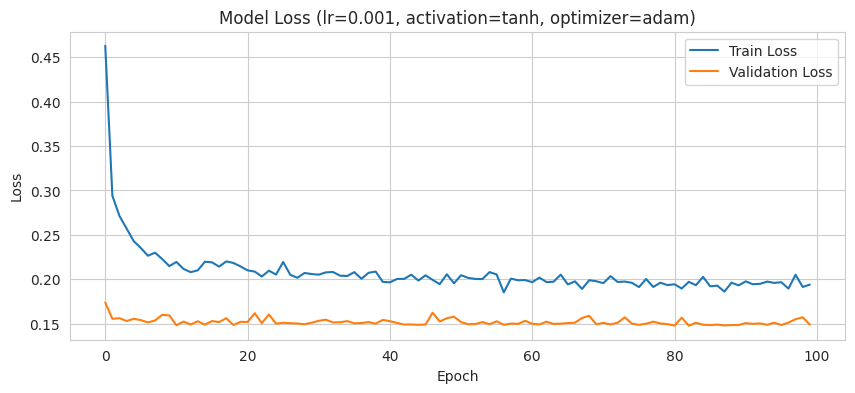


Training with learning rate: 0.001, activation function: tanh, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


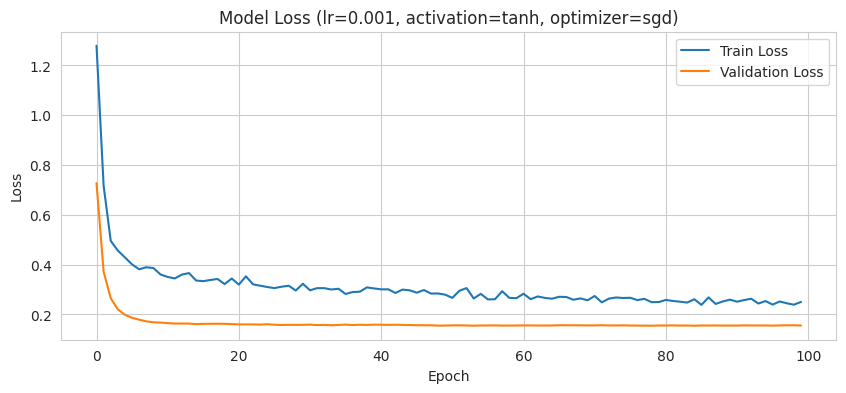


Training with learning rate: 0.0001, activation function: relu, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


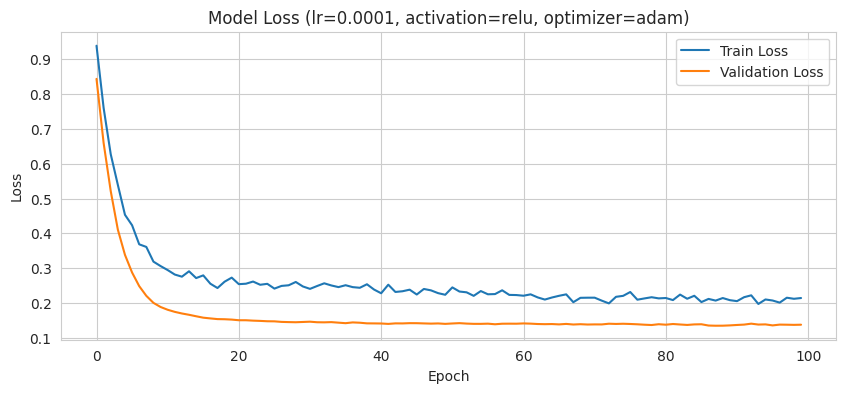


Training with learning rate: 0.0001, activation function: relu, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


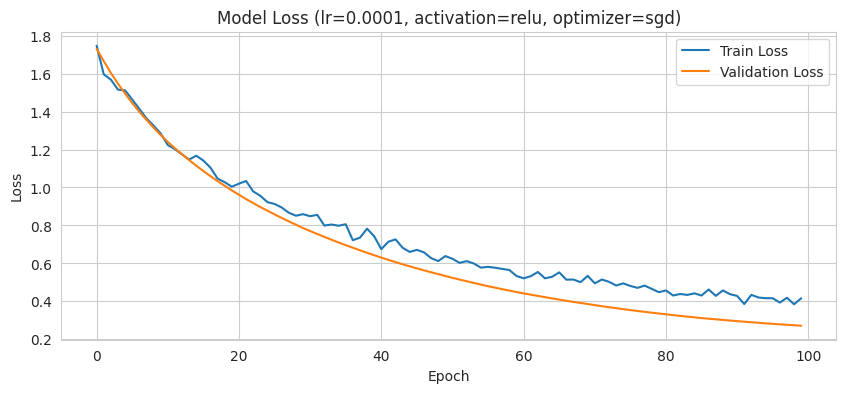


Training with learning rate: 0.0001, activation function: tanh, optimizer: adam


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


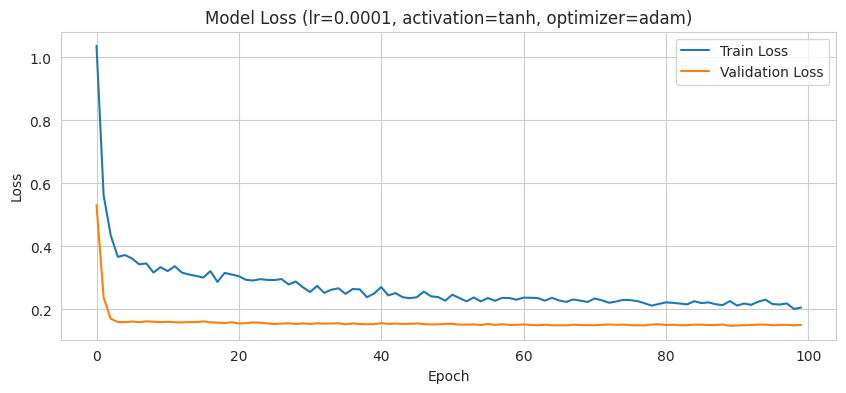


Training with learning rate: 0.0001, activation function: tanh, optimizer: sgd


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


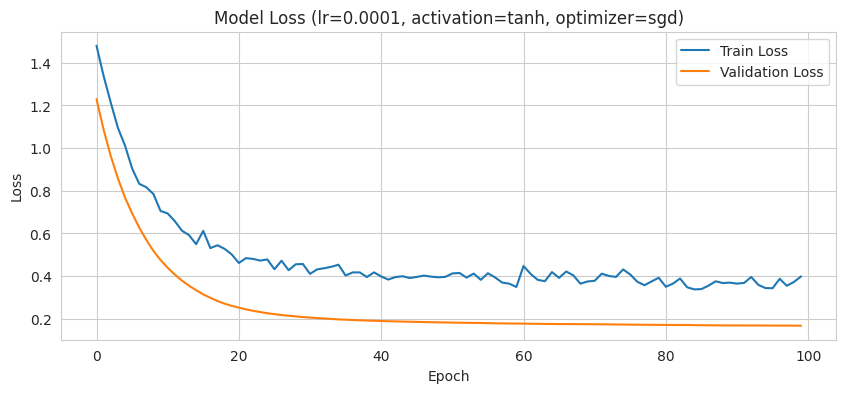

|   Learning Rate | Activation Function   | Optimizer   |   Training RMSE |   Validation RMSE |
|----------------:|:----------------------|:------------|----------------:|------------------:|
|          0.01   | relu                  | adam        |        0.39173  |          0.364566 |
|          0.01   | relu                  | sgd         |        0.401443 |          0.364734 |
|          0.0001 | relu                  | adam        |        0.410082 |          0.371013 |
|          0.001  | relu                  | adam        |        0.404959 |          0.374302 |
|          0.1    | relu                  | sgd         |        0.407743 |          0.378823 |
|          0.001  | relu                  | sgd         |        0.413011 |          0.383007 |
|          0.001  | tanh                  | adam        |        0.416767 |          0.385841 |
|          0.0001 | tanh                  | adam        |        0.417679 |          0.388151 |
|          0.1    | tanh                

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X2 = scaled_train_data4_df
Y2 = train_data_standardized["LogAdjustedSalePrice"]


# split the standardized dataset into training and validation
X_train2, X_validate2, Y_train2, Y_validate2 = train_test_split(X2, Y2, test_size=0.2, random_state=0)

# define the grid of hyperparameters to experiment with
learning_rates = [0.1, 0.01, 0.001, 0.0001]
activation_functions = ['relu', 'tanh']
optimizers = {'adam': Adam, 'sgd': SGD}

# storing experiment result in a list
experiment_results = []

# loop over different combinations of hyperparameters
for lr in learning_rates:
    for activation in activation_functions:
        for opt_name, opt_constructor in optimizers.items():
            print(f"\nTraining with learning rate: {lr}, activation function: {activation}, optimizer: {opt_name}")

            # building the model
            model = Sequential()
            model.add(Dense(100, activation=activation, input_shape=(X_train2.shape[1],)))
            model.add(Dropout(0.4))
            model.add(Dense(50, activation=activation))
            model.add(Dropout(0.3))
            model.add(Dense(1, activation='linear'))

            # initialize the optimizer
            optimizer = opt_constructor(learning_rate=lr)

            # complie the model based on the current hyperparameters
            model.compile(optimizer=optimizer, loss='mean_squared_error')

            # training the model
            history = model.fit(X_train2, Y_train2, validation_data=(X_validate2, Y_validate2),
                                epochs=100, batch_size=32, verbose=0)

            # predict on training and validation sets
            train_predictions = model.predict(X_train2)
            val_predictions = model.predict(X_validate2)

            # compute RMSE for the training and validation sets
            train_rmse = np.sqrt(mean_squared_error(Y_train2, train_predictions.flatten()))
            val_rmse = np.sqrt(mean_squared_error(Y_validate2, val_predictions.flatten()))

            # adding the result to experiment result list
            experiment_results.append({
                'Learning Rate': lr,
                'Activation Function': activation,
                'Optimizer': opt_name,
                'Training RMSE': train_rmse,
                'Validation RMSE': val_rmse
            })

            plt.figure(figsize=(10, 4))
            plt.plot(history.history['loss'], label='Train Loss')
            plt.plot(history.history['val_loss'], label='Validation Loss')
            plt.title(f'Model Loss (lr={lr}, activation={activation}, optimizer={opt_name})')
            plt.ylabel('Loss')
            plt.xlabel('Epoch')
            plt.legend(loc='upper right')
            plt.show()




# create a DataFrame with the experiment results
df_results = pd.DataFrame(experiment_results)

# sort the results by Validation RMSE
df_results.sort_values(by='Validation RMSE', inplace=True)

# put into markdown table and print out the result
print(df_results.to_markdown(index=False))

### 5.6 XGBoost

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, GridSearchCV
import xgboost as xgb

X_train_xgboost, X_validate_xgboost, Y_train_xgboost, Y_validate_xgboost = train_test_split(train_data4, train_data["LogAdjustedSalePrice"], test_size=0.2, random_state=0)

# Define the models
models = {
    'XGBoost': xgb.XGBRegressor(random_state=42)
}

# Define the hyperparameter grids for each model
param_grids = {
    'XGBoost': {
        'n_estimators': [100,150, 200,300, 500],
        'learning_rate': [0.01, 0.1, 0.3,0.6],
        'max_depth': [1,2,3,4,5,6,7,8,9,10],
    }
}

# 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Train and tune the models
grids = {}
for model_name, model in models.items():
    #print(f'Training and tuning {model_name}...')
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train_xgboost,Y_train_xgboost)
    best_params = grids[model_name].best_params_
    best_score = np.sqrt(-1 * grids[model_name].best_score_)

    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')

Fitting 3 folds for each of 200 candidates, totalling 600 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300}
Best RMSE for XGBoost: 0.17076788149237157



In [ ]:
best_params = {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300}

# Initialize the XGBoost regression model with best parameters
xgboost_model = xgb.XGBRegressor(**best_params, random_state=42)

# Train the model
xgboost_model.fit(X_train_xgboost, Y_train_xgboost)

# Predict
predict_price_xgb = xgboost_model.predict(X_validate_xgboost)

# Calculate Mean Squared Error on Validation Set
mse_xgb = mean_squared_error(Y_validate_xgboost, predict_price_xgb)
print('Mean Squared Error on Validation Set with Best Parameters:', mse_xgb)

#exp(x) - 1

Mean Squared Error on Validation Set with Best Parameters: 0.023531967778372322
